## training with noise-free data (sim3)

goal: train two separate neural network branches on two different features (light curve data, derivative of light curve). then, merge the two models and train again with a 3rd neural network. 

In [1]:
import numpy as np
import numpy.typing as npt
from matplotlib import pyplot as plt
from scipy.special import erf
from typing import Union 

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense, Dropout
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.optimizers import Adam

gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
    except RuntimeError as e:
        print(e)

# note: removed the EFP and plot_flare functions here, but can add back

2024-06-01 19:05:11.264404: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-06-01 19:05:11.846872: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2024-06-01 19:05:12.365617: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-06-01 19:05:12.386276: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. 

## getting the synthetic data
for now, I am just training on all flares without sifting, but i can also filter by the snr to get even better data. 

In [2]:
import pandas as pd
class_info = pd.read_csv('sim1/fitted_flares.csv')

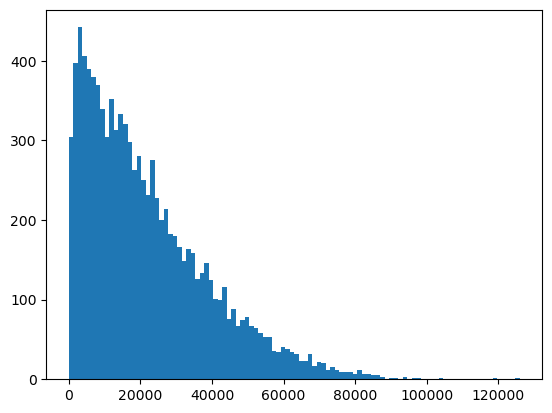

In [3]:
# see the SNR distribution
plt.hist(class_info['snr'], bins = 100);

In [4]:
# snr_filter
print(np.shape(np.where(class_info['snr'] > 10000)))
print(np.shape(np.where(class_info['peak_count'] > 50) ))

(1, 6886)
(1, 9877)


In [5]:
# get the light curve data 
# if we want to only use the higher snr data, then just use the indices
# high_snr_id = list(np.where(class_info['snr'] > 10000)[0])

ids = [i for i in class_info['identifier']]
peak_count = [int(count) for count in class_info['peak_count']]

data = []
labels = []

for i in ids:
    tod = pd.read_csv('sim1/binned_flares/' + f'{i}' + '.csv')
    data.append(list(tod['Counts']))
    
for index in range(len(class_info)):
    if str(class_info['flare_type'][index]) == 'A':
        labels.append(0)
    if str(class_info['flare_type'][index]) == 'B':
        labels.append(1)
    else:
        continue

In [6]:
data = pad_sequences(data, padding='post', dtype=float)   # the padding is to adjust the shape of the np arrays

print(data[0])
print(data.shape)
print(type(data[0, 0]))

[  5.02847085   5.75683191   5.9644922    5.17546718   5.65164762
   7.37056989   6.18147207   8.46694146   6.10194486   7.67802648
   6.47387262   7.92082314   8.29382996   6.86692041   5.7591399
   8.57161059   7.74953157   7.39858288   7.07233532   5.49982173
   7.21553926   8.61171571   8.29964675  10.1482885    9.37689412
   8.91789145   8.08183768   7.9905472    9.28738851   7.75042005
  10.79874879   7.5068655    6.96290992  10.24819336   8.0623708
   7.00123987   9.19005169  10.10037296   8.05964475   8.4446008
   7.71312522   6.93896562   8.58368418   9.06460519   7.4865296
   9.19991211  10.95350863  11.02619253   8.35977779  10.15881464
   8.98551767  10.51766456   8.92187227  10.16759874   9.8139211
  48.23526244 169.30033107 295.77560852 275.31740808 239.21850066
 189.40667031 147.16926776 111.93996154  94.54003097  80.20455103
  64.52008322  52.88815677  44.16625062  34.69696018  29.63247515
  27.69207375  21.94922662  22.50744954  18.69835201  16.96400563
  15.54546001  

## k-fold cross validation

In [7]:
from sklearn.model_selection import KFold

kf = KFold(n_splits=10, shuffle=True)

for train_ind, val_ind in kf.split(data):
    data_train, data_val = data[train_ind], data[val_ind]
    labels_train, labels_val = np.array(labels)[train_ind], np.array(labels)[val_ind]
    ids_train, ids_val = np.array(ids)[train_ind], np.array(ids)[val_ind]
    
    break

print(data_train.shape)
print(data_val.shape)

(8905, 200)
(990, 200)


In [8]:
# getting the derivative of the light curve

data_deriv_train = [ (data_train[i][1:] - data_train[i][:-1]) for i in range(len(data_train)) ]
data_deriv_val = [ (data_val[i][1:] - data_val[i][:-1]) for i in range(len(data_val)) ]

data_deriv2_train = [ (data_deriv_train[i][1:] - data_deriv_train[i][:-1]) for i in range(len(data_deriv_train)) ]
data_deriv2_val = [ (data_deriv_val[i][1:] - data_deriv_val[i][:-1]) for i in range(len(data_deriv_val)) ]

data_deriv_train = pad_sequences(data_deriv_train, padding='post', dtype=float)   # the padding is to adjust the shape of the np arrays
data_deriv_val = pad_sequences(data_deriv_val, padding='post', dtype=float)

data_deriv2_train = pad_sequences(data_deriv2_train, padding='post', dtype=float)   # the padding is to adjust the shape of the np arrays
data_deriv2_val = pad_sequences(data_deriv2_val, padding='post', dtype=float)

#print(data_deriv[0])
#print(data_deriv.shape)
#print(type(data_deriv[0, 0]))

## construct two neural network branches
- model1: training on the light curve data  
- model2: training on the derivative of the light curve data
- model3: training on the 2nd derivative

In [9]:
model1 = Sequential()
    
# First convolutional layer
model1.add(Conv1D(filters=64, kernel_size=3, activation='relu', input_shape=(len(data_train[0]), 1)))
model1.add(MaxPooling1D(pool_size=2))

# Second convolutional layer
model1.add(Conv1D(filters=128, kernel_size=3, activation='relu'))
model1.add(MaxPooling1D(pool_size=2))

# Third convolutional layer
model1.add(Conv1D(filters=256, kernel_size=3, activation='relu'))
model1.add(MaxPooling1D(pool_size=2))

# Flatten the output
model1.add(Flatten())

# Fully connected layer
model1.add(Dense(128, activation='relu'))
model1.add(Dropout(0.5))

# Output layer
model1.add(Dense(1, activation='sigmoid'))

# Compile the model
model1.compile(optimizer=Adam(), loss='binary_crossentropy', metrics=['accuracy'])

/home/mrchu/anaconda3/lib/python3.11/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
2024-06-01 19:05:28.355973: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-06-01 19:05:28.356140: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testin

In [10]:
model2 = Sequential()

# First convolutional layer
model2.add(Conv1D(filters=64, kernel_size=3, activation='relu', input_shape=(len(data_deriv_train[0]), 1)))
model2.add(MaxPooling1D(pool_size=2))

# Second convolutional layer
model2.add(Conv1D(filters=128, kernel_size=3, activation='relu'))
model2.add(MaxPooling1D(pool_size=2))

# Third convolutional layer
model2.add(Conv1D(filters=256, kernel_size=3, activation='relu'))
model2.add(MaxPooling1D(pool_size=2))

# Flatten the output
model2.add(Flatten())

# Fully connected layer
model2.add(Dense(128, activation='relu'))
model2.add(Dropout(0.5))

# Output layer
model2.add(Dense(1, activation='sigmoid'))

# Compile the model
model2.compile(optimizer=Adam(), loss='binary_crossentropy', metrics=['accuracy'])

/home/mrchu/anaconda3/lib/python3.11/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [11]:
model3 = Sequential()

# First convolutional layer
model3.add(Conv1D(filters=64, kernel_size=3, activation='relu', input_shape=(len(data_deriv2_train[0]), 1)))
model3.add(MaxPooling1D(pool_size=2))

# Second convolutional layer
model3.add(Conv1D(filters=128, kernel_size=3, activation='relu'))
model3.add(MaxPooling1D(pool_size=2))

# Third convolutional layer
model3.add(Conv1D(filters=356, kernel_size=3, activation='relu'))
model3.add(MaxPooling1D(pool_size=3))

# Flatten the output
model3.add(Flatten())

# Fully connected layer
model3.add(Dense(138, activation='relu'))
model3.add(Dropout(0.5))

# Output layer
model3.add(Dense(1, activation='sigmoid'))

# Compile the model
model3.compile(optimizer=Adam(), loss='binary_crossentropy', metrics=['accuracy'])

/home/mrchu/anaconda3/lib/python3.11/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


## training model1 and model2

In [12]:
model1.fit(np.array(data_train), np.array(labels_train), epochs=100, batch_size=32, validation_split=0.2, verbose=1)

Epoch 1/100


I0000 00:00:1717294001.336411 3014723 service.cc:145] XLA service 0x7c36d0005ac0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1717294001.336429 3014723 service.cc:153]   StreamExecutor device (0): NVIDIA GeForce RTX 3080 Ti, Compute Capability 8.6
2024-06-01 19:06:41.360090: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-06-01 19:06:41.488123: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:465] Loaded cuDNN version 8907


111/223 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5817 - loss: 8.9863 

I0000 00:00:1717294002.870050 3014723 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


223/223 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - accuracy: 0.5933 - loss: 5.5970 - val_accuracy: 0.7238 - val_loss: 0.5316
Epoch 2/100
223/223 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6530 - loss: 0.5553 - val_accuracy: 0.7541 - val_loss: 0.5107
Epoch 3/100
223/223 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6596 - loss: 0.5763 - val_accuracy: 0.7574 - val_loss: 0.5163
Epoch 4/100
223/223 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7256 - loss: 0.5367 - val_accuracy: 0.7619 - val_loss: 0.4970
Epoch 5/100
223/223 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7534 - loss: 0.5240 - val_accuracy: 0.7732 - val_loss: 0.4963
Epoch 6/100
223/223 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7519 - loss: 0.5052 - val_accuracy: 0.7737 - val_loss: 0.4974
Epoch 7/100
223/223 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7645 - loss: 0.5025 - val_accuracy: 0.7805 - val_loss: 0.4707
Epoch 8/100
223/223 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7732 - loss: 0.4959 - val_accuracy: 0.775

In [13]:
model2.fit(np.array(data_deriv_train), np.array(labels_train), epochs=100, batch_size=32, validation_split=0.2, verbose=1)

Epoch 1/100
223/223 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - accuracy: 0.6787 - loss: 1.3393 - val_accuracy: 0.7636 - val_loss: 0.4582
Epoch 2/100
223/223 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7876 - loss: 0.4463 - val_accuracy: 0.8147 - val_loss: 0.4009
Epoch 3/100
223/223 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8151 - loss: 0.4157 - val_accuracy: 0.8119 - val_loss: 0.4055
Epoch 4/100
223/223 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8320 - loss: 0.3824 - val_accuracy: 0.8355 - val_loss: 0.3783
Epoch 5/100
223/223 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8293 - loss: 0.3762 - val_accuracy: 0.8271 - val_loss: 0.3918
Epoch 6/100
223/223 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8338 - loss: 0.3755 - val_accuracy: 0.8422 - val_loss: 0.3750
Epoch 7/100
223/223 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8521 - loss: 0.3520 - val_accuracy: 0.8540 - val_loss: 0.3444
Epoch 8/100
223/223 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8435 - loss: 0.3492 - val_accu

In [14]:
model3.fit(np.array(data_deriv2_train), np.array(labels_train), epochs=100, batch_size=32, validation_split=0.2, verbose=1)

Epoch 1/100
223/223 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.5577 - loss: 2.1054 - val_accuracy: 0.7316 - val_loss: 0.5973
Epoch 2/100
223/223 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7190 - loss: 0.5848 - val_accuracy: 0.7574 - val_loss: 0.5098
Epoch 3/100
223/223 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7381 - loss: 0.5573 - val_accuracy: 0.7602 - val_loss: 0.5135
Epoch 4/100
223/223 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7520 - loss: 0.5167 - val_accuracy: 0.7647 - val_loss: 0.4842
Epoch 5/100
223/223 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7567 - loss: 0.4960 - val_accuracy: 0.7793 - val_loss: 0.4676
Epoch 6/100
223/223 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7720 - loss: 0.4570 - val_accuracy: 0.7833 - val_loss: 0.4392
Epoch 7/100
223/223 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8013 - loss: 0.4289 - val_accuracy: 0.7659 - val_loss: 0.4656
Epoch 8/100
223/223 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7951 - loss: 0.4399 - val_acc

In [15]:
print(np.expand_dims(data_val, axis=-1).shape)
print(np.expand_dims(data_deriv_val, axis=-1).shape)

preds1 = model1.predict(np.expand_dims(data_val, axis=-1))
preds2 = model2.predict(np.expand_dims(data_deriv_val, axis=-1))
preds3 = model3.predict(np.expand_dims(data_deriv2_val, axis=-1))

(990, 200, 1)
(990, 199, 1)
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


## evaluating the initial training 

In [16]:
# training for model 1 

from tqdm import tqdm 

class_list = {'0': 'A' , '1': 'B'}

num_high_1 = 0
num_mis_high_1 = 0
num_mis_low_1 = 0

mis_index_1 = [] # identifier list of misclassified flares

tot_exc = 0

for i, pred in enumerate(tqdm(preds1)):
    conf = np.abs(pred[0]-0.5)+0.5     # pred is just 1 number 
    pred_class = int(np.round(pred[0]))

    #print(pred_class, labels_val[i])
    
    tot_exc += 1
    
    if conf > 0.9:
        num_high_1 += 1

        if class_list[str(pred_class)] != class_list[str(labels_val[i])]:
            num_mis_high_1 += 1
            mis_index_1.append(i)
            
            
    else:

        if class_list[str(pred_class)] != class_list[str(labels_val[i])]:
            num_mis_low_1 += 1
            mis_index_1.append(i)

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 990/990 [00:00<00:00, 188384.04it/s]


In [17]:
print(1-len(mis_index_1)/len(preds1))

0.8545454545454545


In [18]:
# training for model 2 

from tqdm import tqdm 

class_list = {'0': 'A' , '1': 'B'}

num_high_2 = 0
num_mis_high_2 = 0
num_mis_low_2 = 0

mis_index_2 = [] # identifier list of misclassified flares

tot_exc = 0

for i, pred in enumerate(tqdm(preds2)):
    conf = np.abs(pred[0]-0.5)+0.5     # pred is just 1 number 
    pred_class = int(np.round(pred[0]))

    #print(pred_class, labels_val[i])
    
    tot_exc += 1
    
    if conf > 0.9:
        num_high_2 += 1

        if class_list[str(pred_class)] != class_list[str(labels_val[i])]:
            num_mis_high_2 += 1
            mis_index_2.append(i)
            
            
    else:

        if class_list[str(pred_class)] != class_list[str(labels_val[i])]:
            num_mis_low_2 += 1
            mis_index_2.append(i)

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 990/990 [00:00<00:00, 182121.09it/s]


In [19]:
print(1-len(mis_index_2)/len(preds2))

0.8454545454545455


In [20]:
# training for model 3 

from tqdm import tqdm 

class_list = {'0': 'A' , '1': 'B'}

num_high_3 = 0
num_mis_high_3 = 0
num_mis_low_3 = 0

mis_index_3 = [] # identifier list of misclassified flares

tot_exc = 0

for i, pred in enumerate(tqdm(preds3)):
    conf = np.abs(pred[0]-0.5)+0.5     # pred is just 1 number 
    pred_class = int(np.round(pred[0]))

    #print(pred_class, labels_val[i])
    
    tot_exc += 1
    
    if conf > 0.9:
        num_high_3 += 1

        if class_list[str(pred_class)] != class_list[str(labels_val[i])]:
            num_mis_high_3 += 1
            mis_index_3.append(i)
            
            
    else:

        if class_list[str(pred_class)] != class_list[str(labels_val[i])]:
            num_mis_low_3 += 1
            mis_index_3.append(i)

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 990/990 [00:00<00:00, 196691.82it/s]


In [21]:
print(1-len(mis_index_3)/len(preds3))

0.7868686868686868


In [24]:
# seems to be misidentifiying the same flares
print(len(mis_index_1))
print(len(mis_index_2))
print(len(mis_index_3))
print(len(np.intersect1d(mis_index_3, np.intersect1d(mis_index_1, mis_index_2, mis_index_3))))

144
153
211
60


In [19]:
print('for model1:')
print(f'Number of high confidence classifications = {num_high_1}')
print(f'Number of low confidence classifications = {len(preds1) - num_high_1}')
print(f'Percentage of high confidence = {num_high_1/len(preds1)}')

print(f'Total misclassified = {num_mis_high_1 + num_mis_low_1}')
print(f'Accuracy in total = {1-(num_mis_high_1+ num_mis_low_1)/len(preds1)}')

print(f'Accuracy of high confidence = {1-num_mis_high_1/num_high_1}')
# print(f'Accuracy of low confidence = {1-num_mis_low_1/(len(preds1) - num_high_1)}')

for model1:
Number of high confidence classifications = 495
Number of low confidence classifications = 495
Percentage of high confidence = 0.5
Total misclassified = 149
Accuracy in total = 0.8494949494949495
Accuracy of high confidence = 0.9757575757575757


In [20]:
print('for model2:')
print(f'Number of high confidence classifications = {num_high_2}')
print(f'Number of low confidence classifications = {len(preds2) - num_high_2}')
print(f'Percentage of high confidence = {num_high_2/len(preds2)}')

print(f'Total misclassified = {num_mis_high_2 + num_mis_low_2}')
print(f'Accuracy in total = {1-(num_mis_high_2+ num_mis_low_2)/len(preds2)}')

print(f'Accuracy of high confidence = {1-num_mis_high_2/num_high_2}')
# print(f'Accuracy of low confidence = {1-num_mis_low_2/(len(preds2) - num_high_2)}')

for model2:
Number of high confidence classifications = 891
Number of low confidence classifications = 99
Percentage of high confidence = 0.9
Total misclassified = 320
Accuracy in total = 0.6767676767676767
Accuracy of high confidence = 0.6947250280583614


  0%|                                                                                                                                                          | 0/990 [00:00<?, ?it/s]

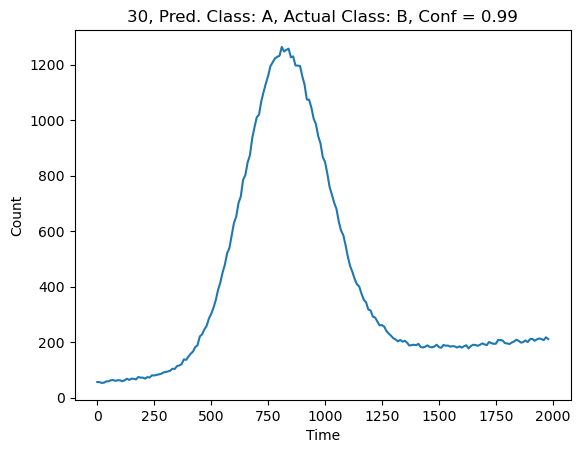

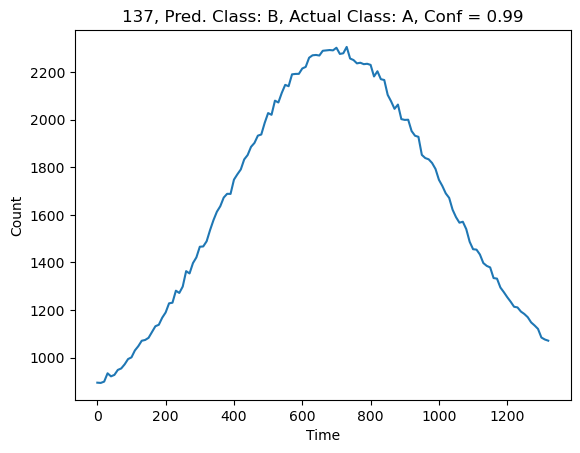

  1%|█▉                                                                                                                                               | 13/990 [00:00<00:13, 72.25it/s]

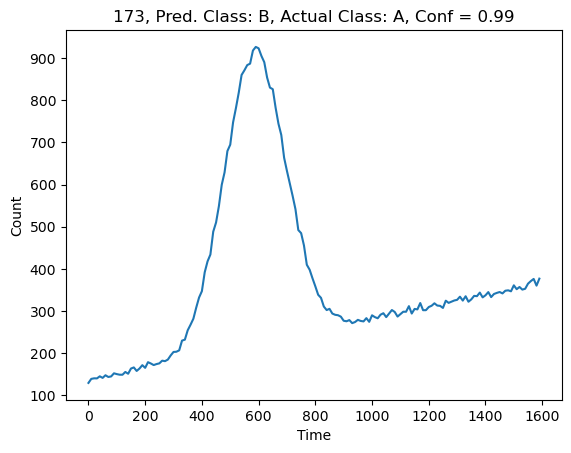

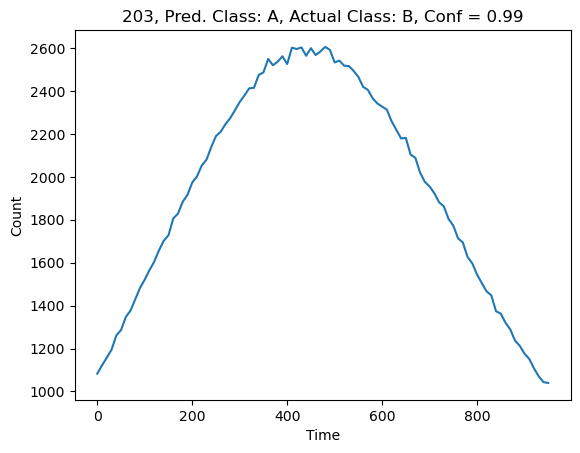

  2%|███                                                                                                                                              | 21/990 [00:00<00:17, 56.85it/s]

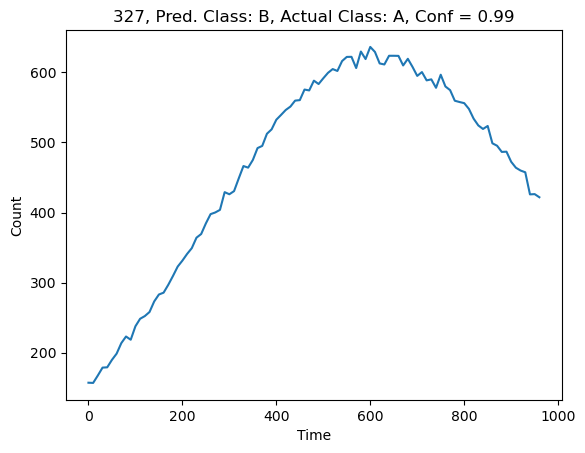

  3%|███▉                                                                                                                                             | 27/990 [00:00<00:25, 37.84it/s]

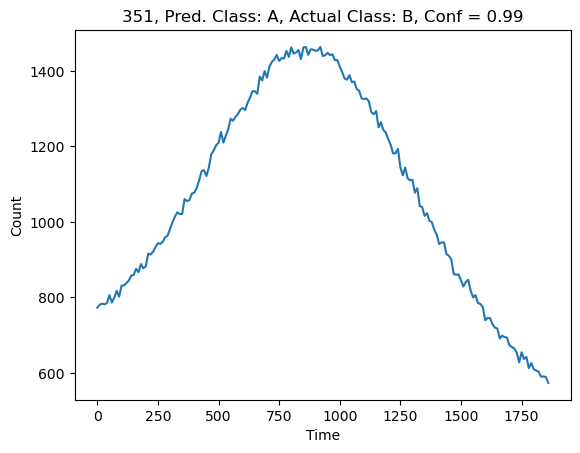

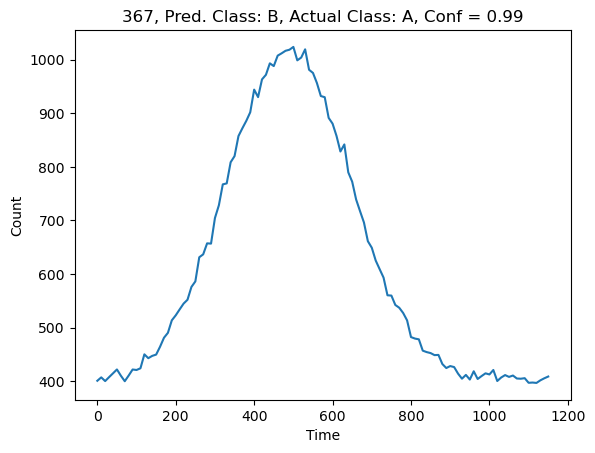

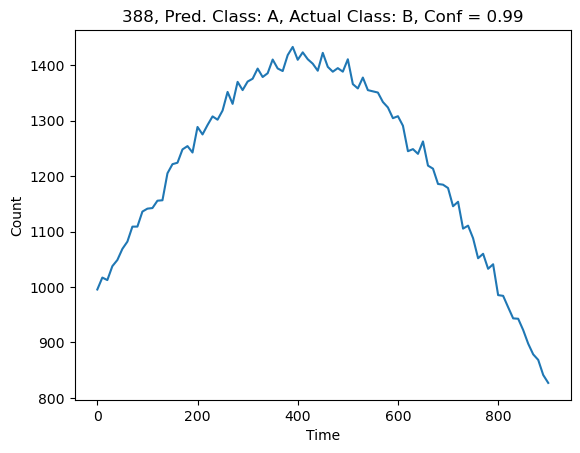

  3%|████▋                                                                                                                                            | 32/990 [00:00<00:31, 30.42it/s]

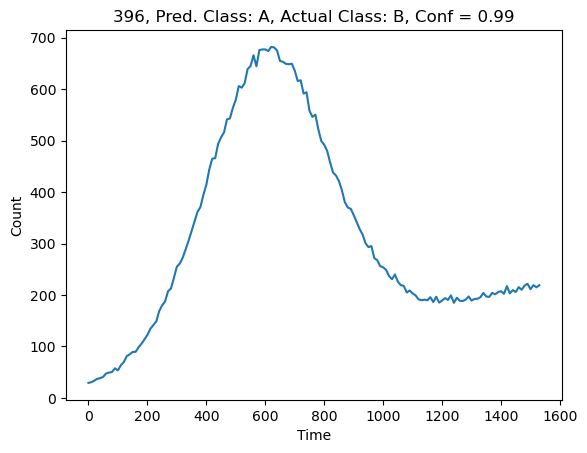

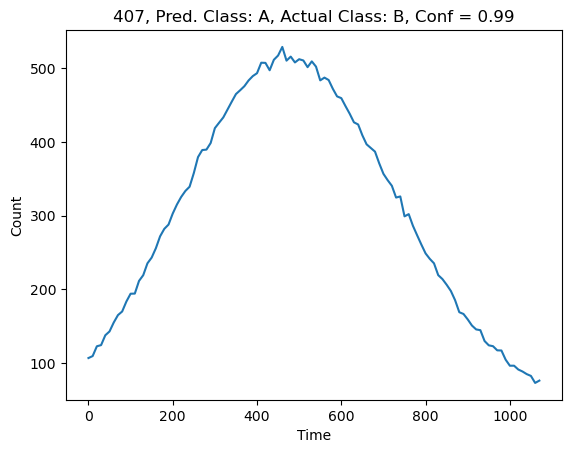

  4%|█████▎                                                                                                                                           | 36/990 [00:01<00:33, 28.50it/s]

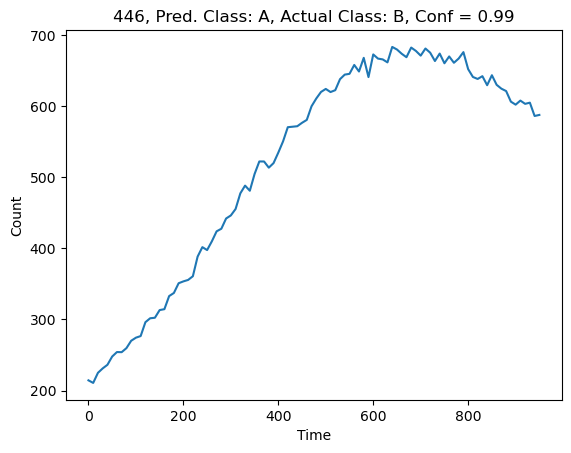

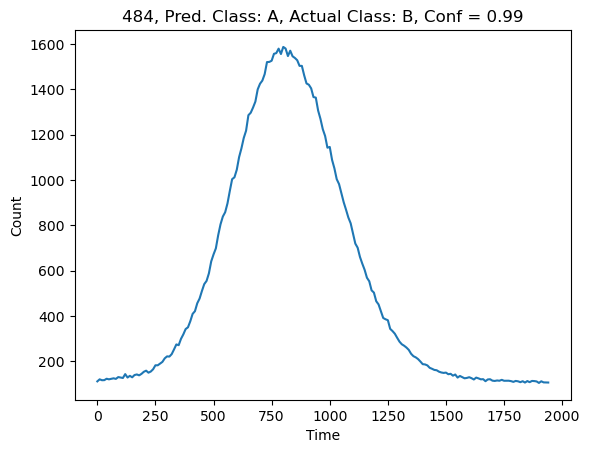

  5%|██████▉                                                                                                                                          | 47/990 [00:01<00:23, 39.38it/s]

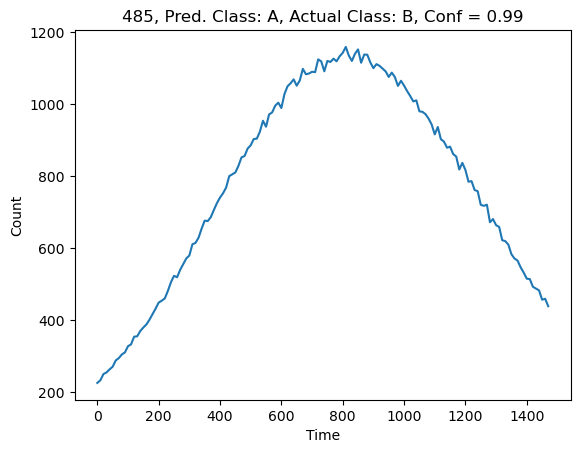

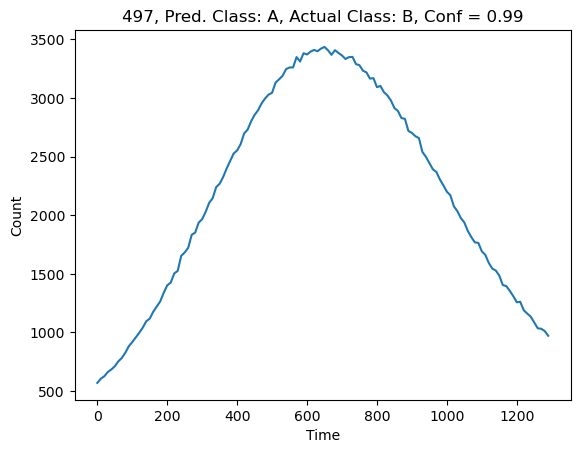

  5%|███████▌                                                                                                                                         | 52/990 [00:01<00:25, 36.84it/s]

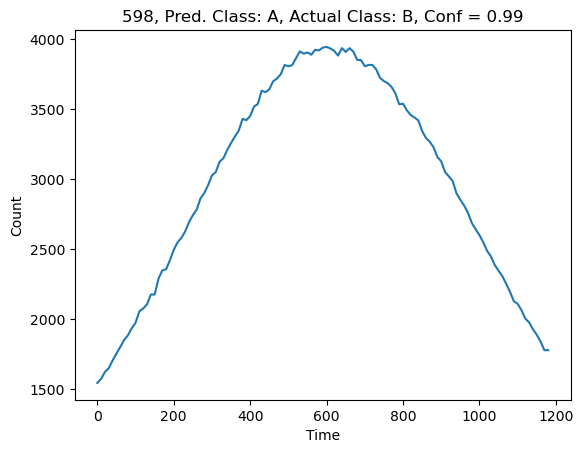

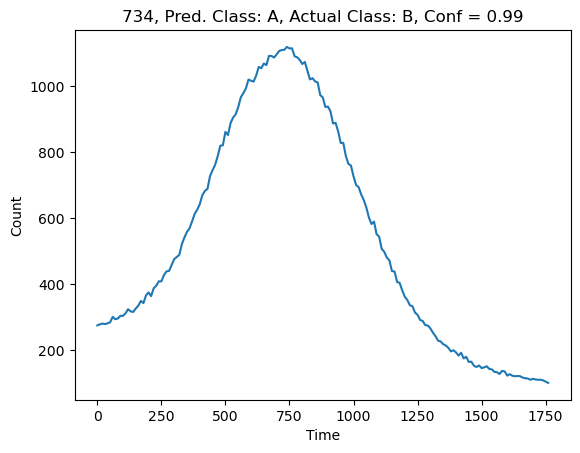

  7%|█████████▉                                                                                                                                       | 68/990 [00:01<00:16, 55.31it/s]

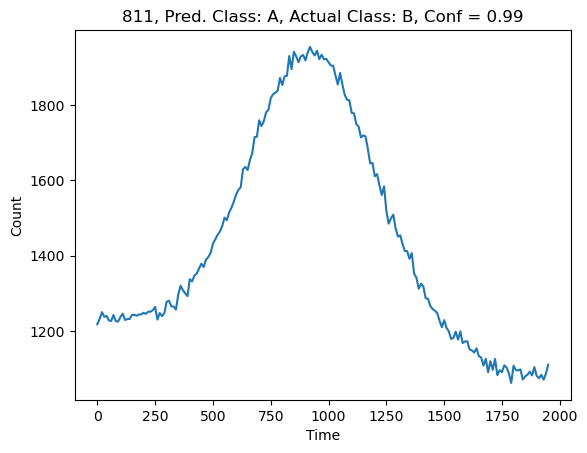

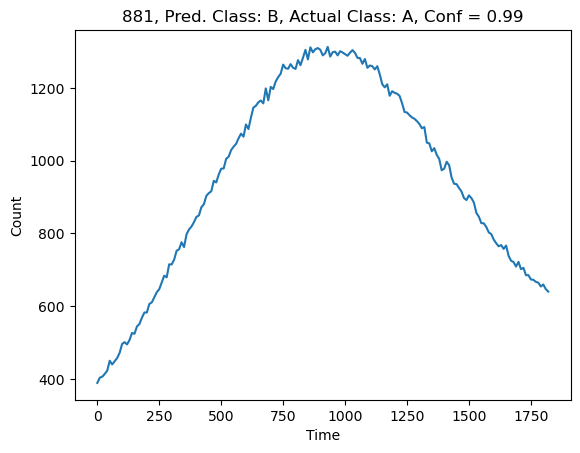

  9%|████████████▌                                                                                                                                    | 86/990 [00:01<00:12, 72.59it/s]

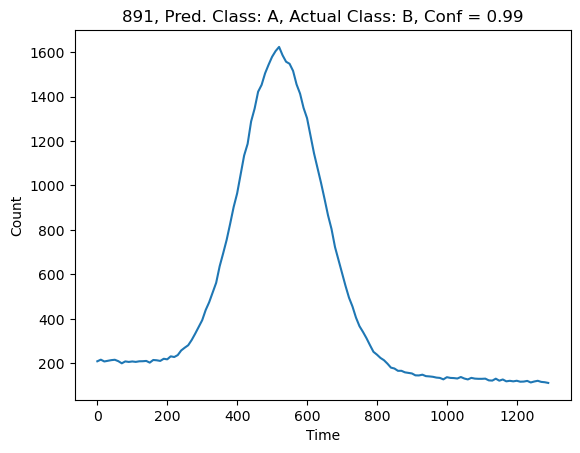

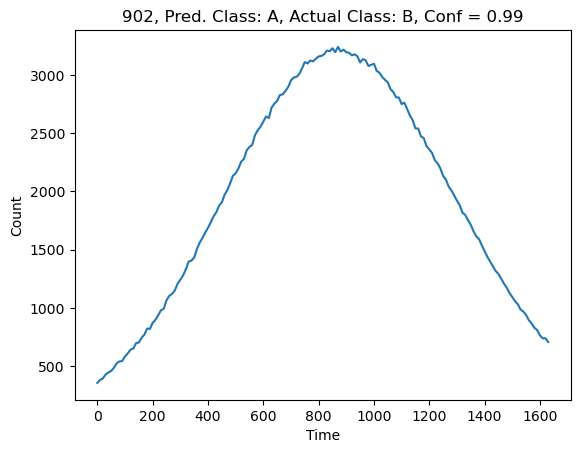

  9%|█████████████▊                                                                                                                                   | 94/990 [00:01<00:13, 65.23it/s]

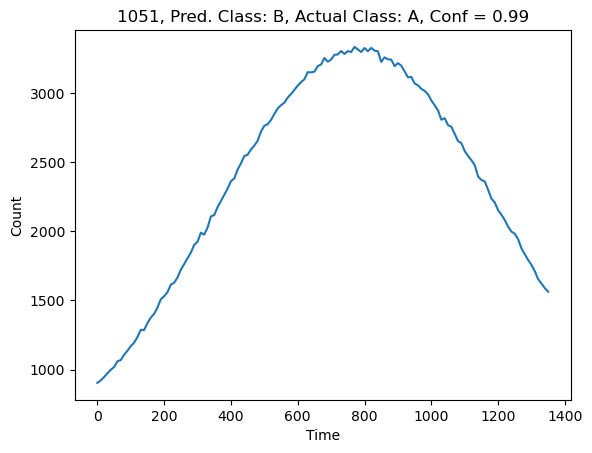

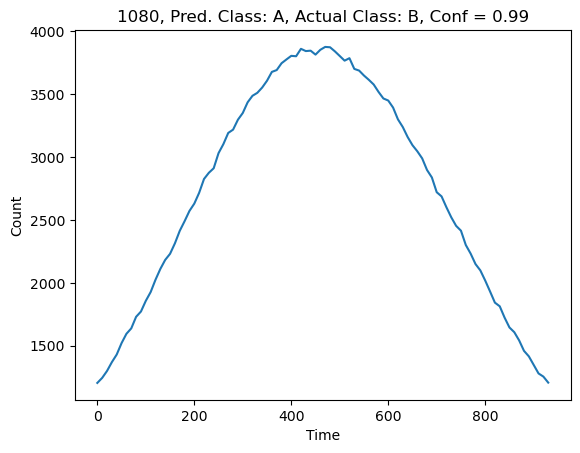

 11%|████████████████▎                                                                                                                               | 112/990 [00:02<00:11, 79.30it/s]

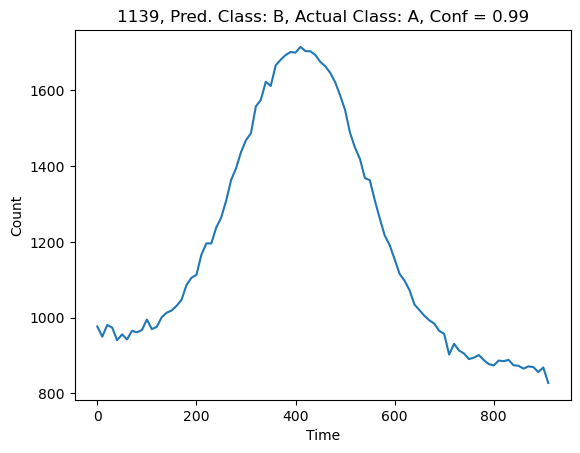

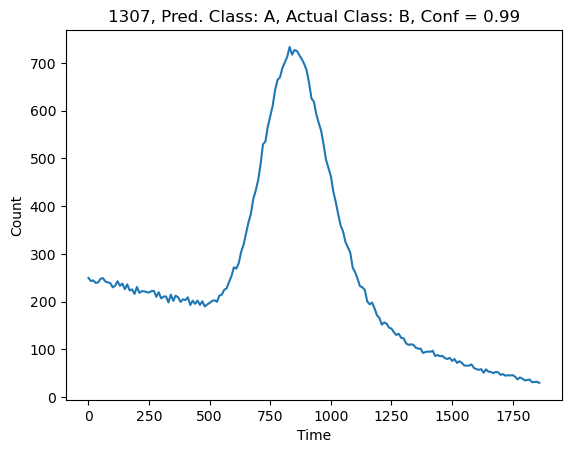

 14%|███████████████████▉                                                                                                                           | 138/990 [00:02<00:08, 103.36it/s]

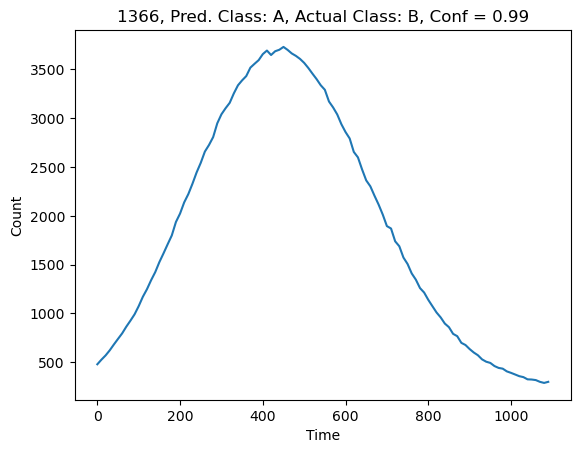

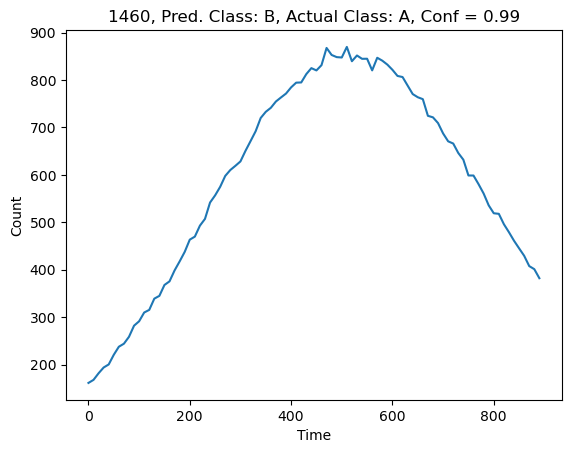

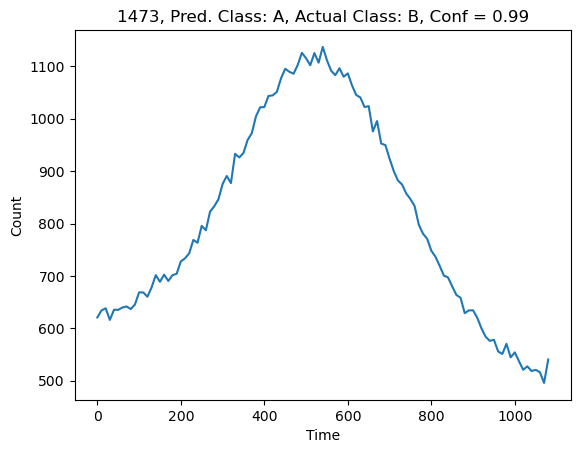

 15%|█████████████████████▋                                                                                                                          | 149/990 [00:02<00:10, 80.57it/s]

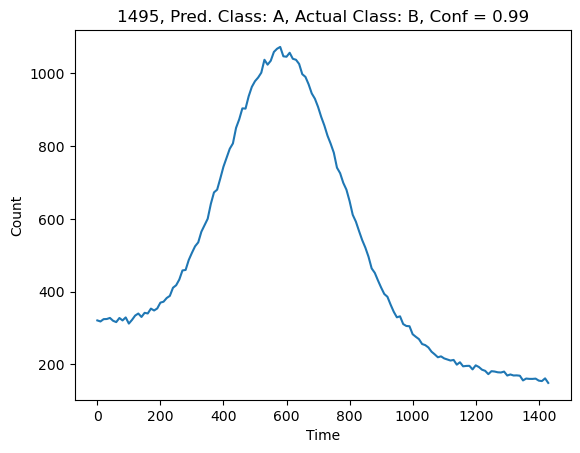

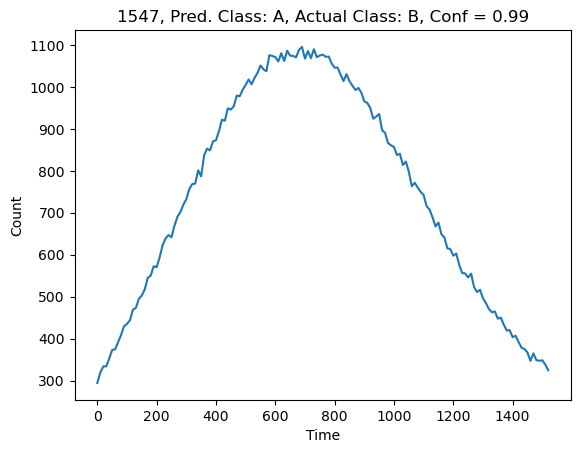

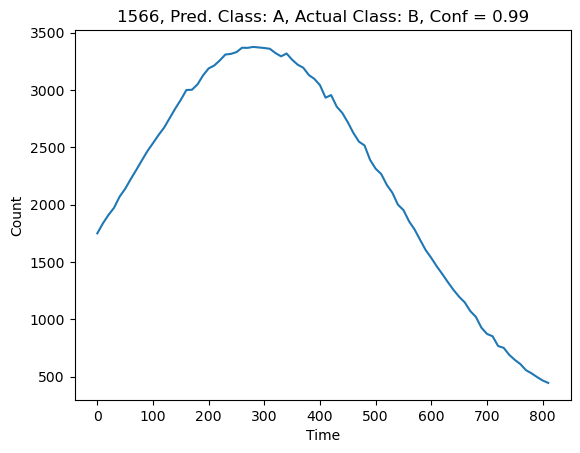

 16%|██████████████████████▉                                                                                                                         | 158/990 [00:02<00:13, 63.31it/s]

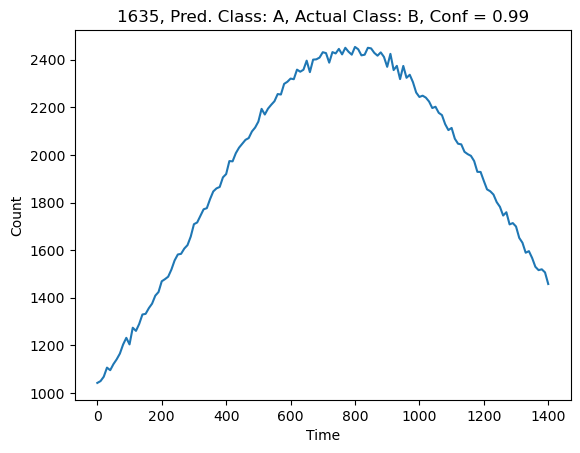

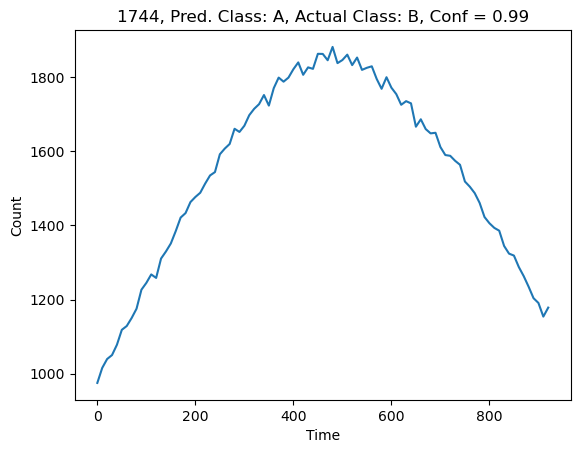

 17%|████████████████████████▋                                                                                                                       | 170/990 [00:02<00:12, 66.32it/s]

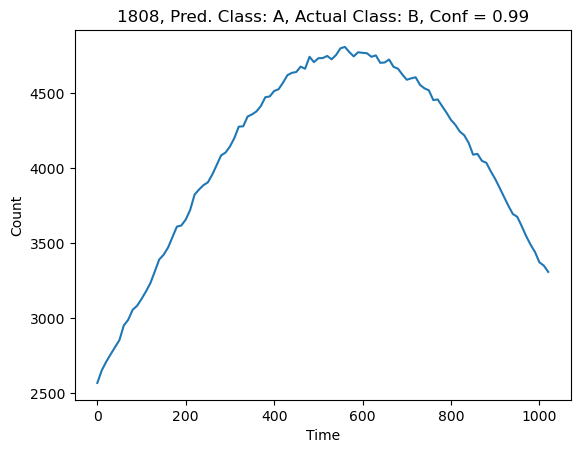

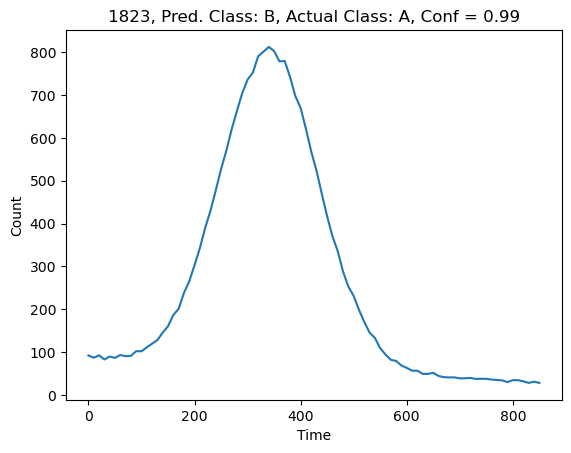

 18%|██████████████████████████▎                                                                                                                     | 181/990 [00:02<00:12, 67.15it/s]

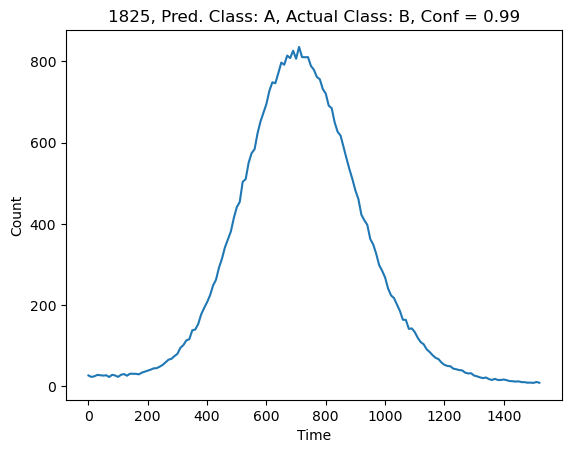

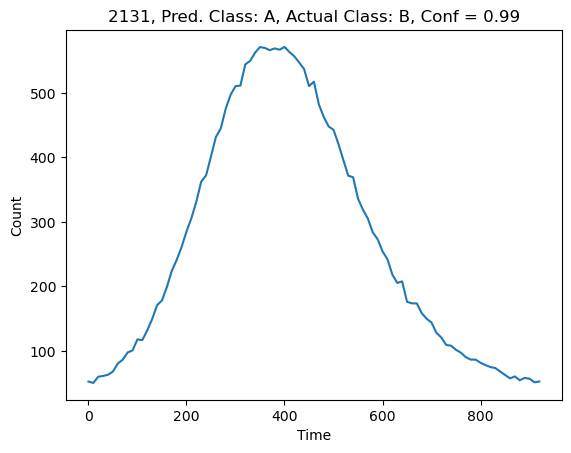

 21%|██████████████████████████████▍                                                                                                                | 211/990 [00:03<00:07, 100.84it/s]

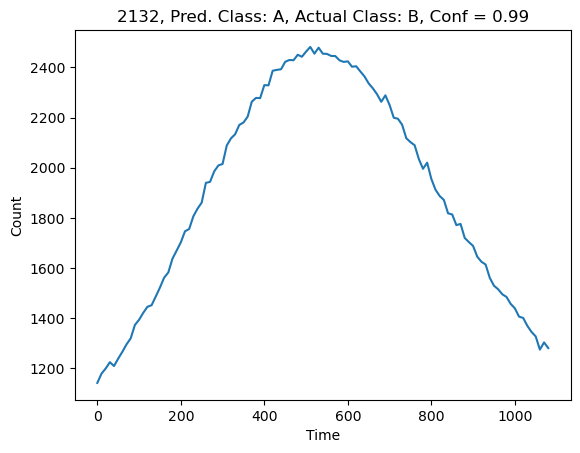

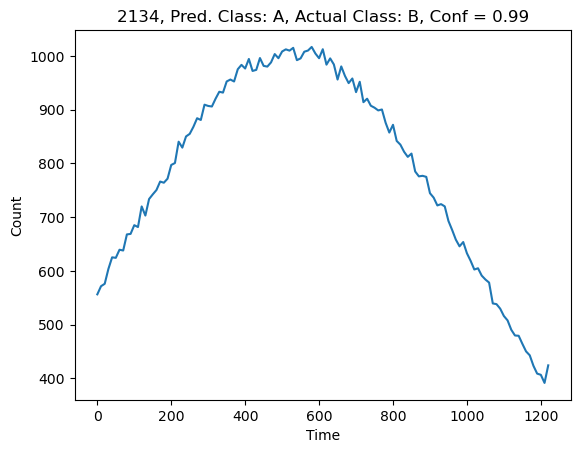

 22%|████████████████████████████████▎                                                                                                               | 222/990 [00:03<00:08, 91.30it/s]

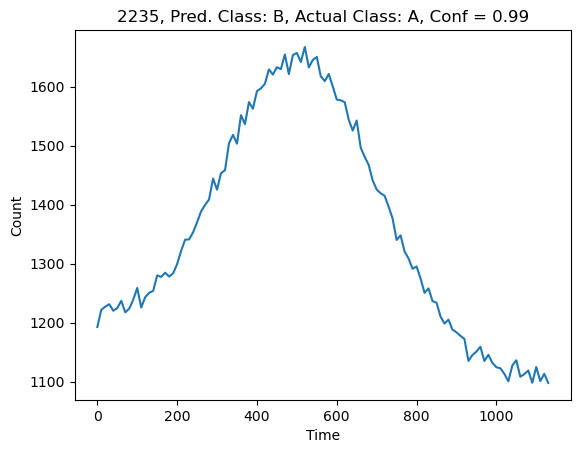

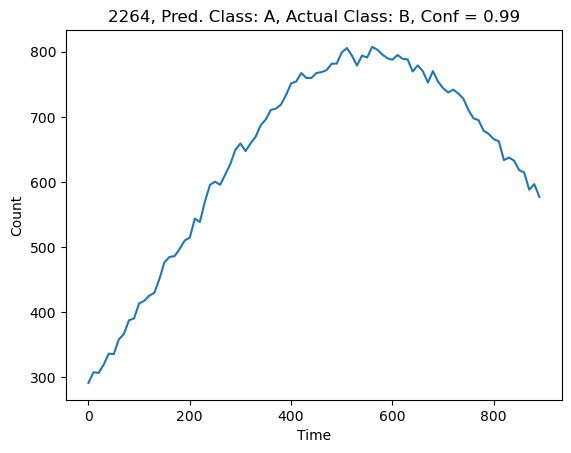

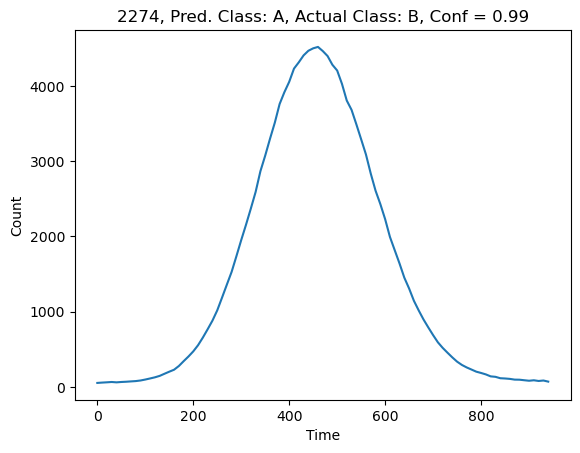

 23%|█████████████████████████████████▋                                                                                                              | 232/990 [00:03<00:10, 74.01it/s]

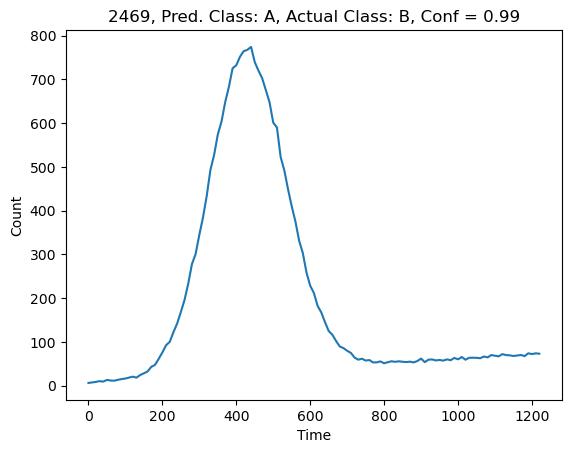

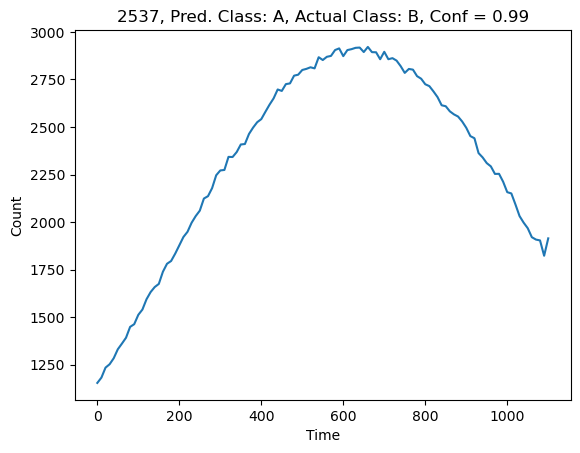

 25%|████████████████████████████████████▌                                                                                                           | 251/990 [00:03<00:08, 84.91it/s]

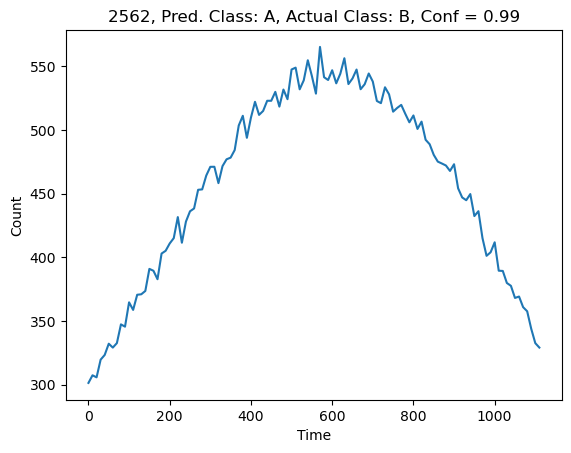

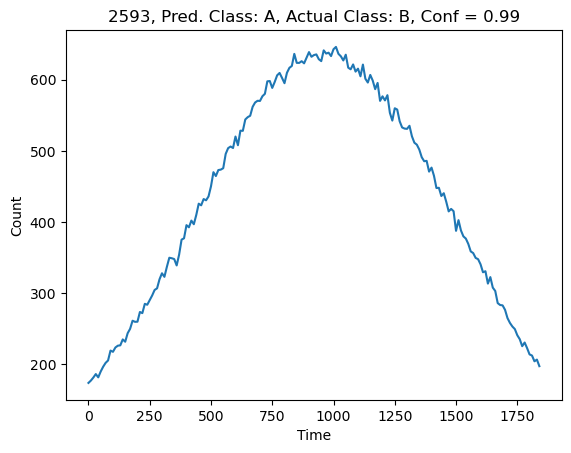

 26%|█████████████████████████████████████▉                                                                                                          | 261/990 [00:03<00:09, 79.62it/s]

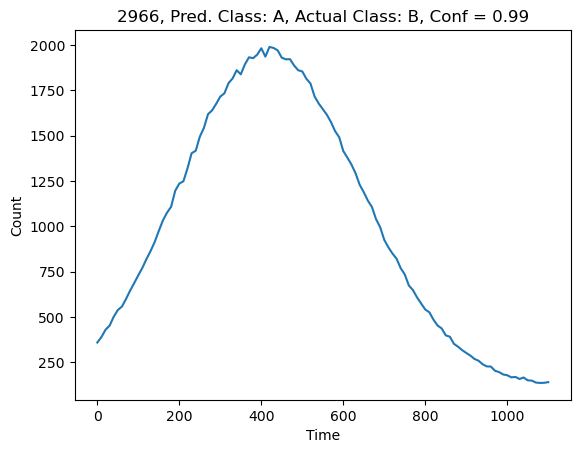

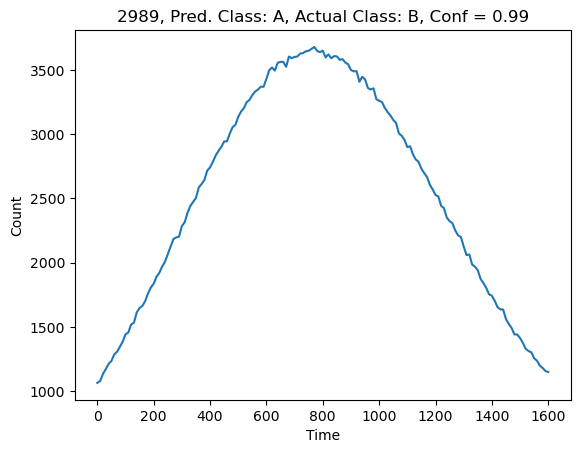

 30%|██████████████████████████████████████████▎                                                                                                    | 293/990 [00:04<00:06, 112.94it/s]

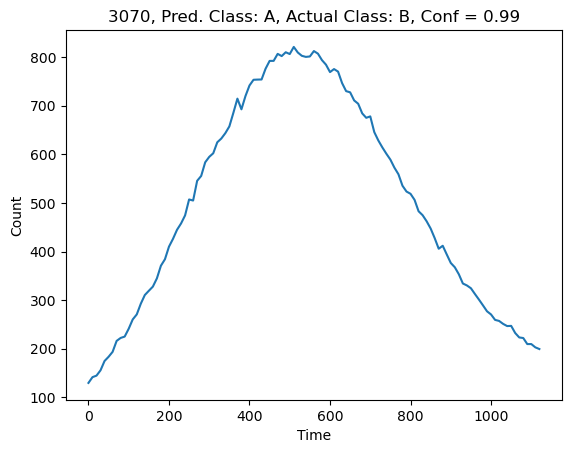

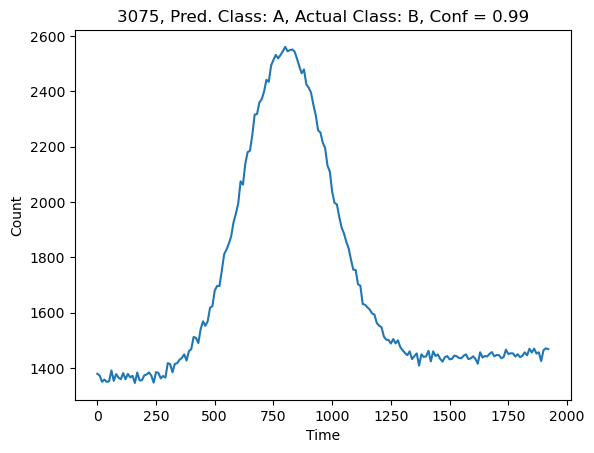

 31%|████████████████████████████████████████████                                                                                                   | 305/990 [00:04<00:06, 100.20it/s]

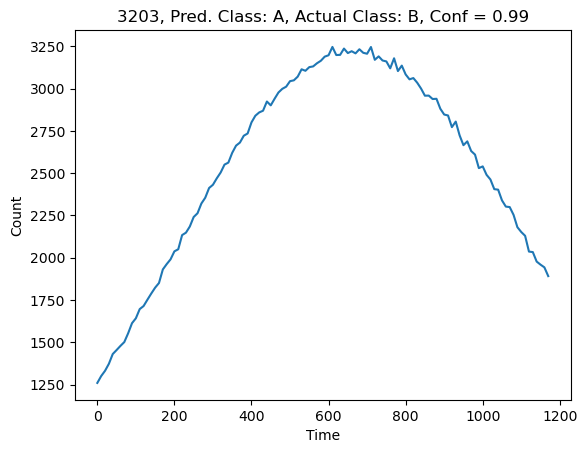

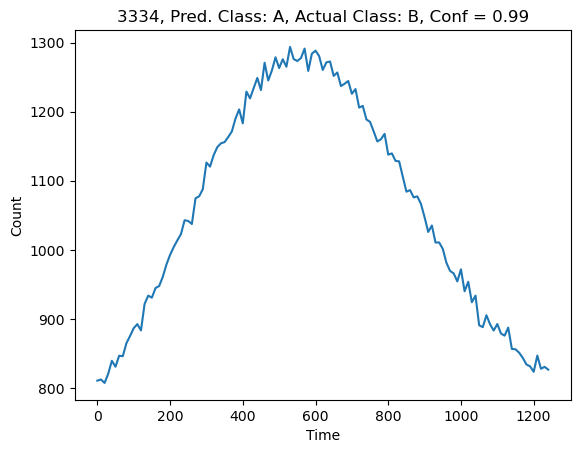

 34%|███████████████████████████████████████████████▉                                                                                               | 332/990 [00:04<00:05, 117.62it/s]

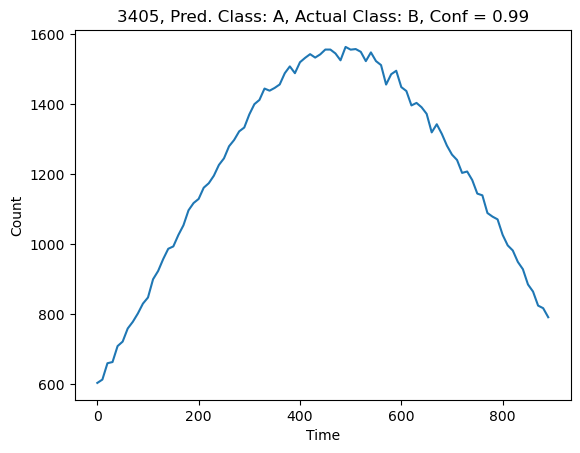

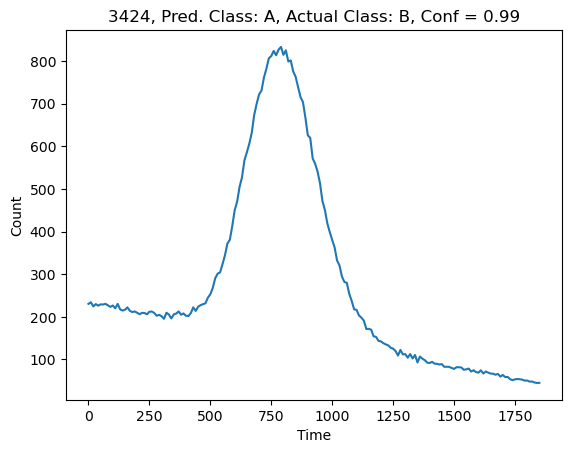

 35%|█████████████████████████████████████████████████▋                                                                                             | 344/990 [00:04<00:06, 104.87it/s]

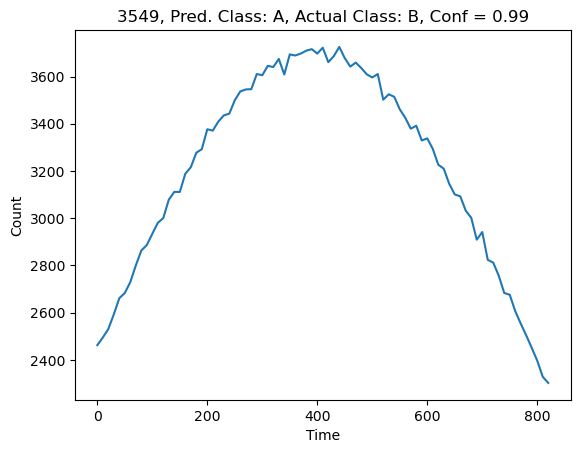

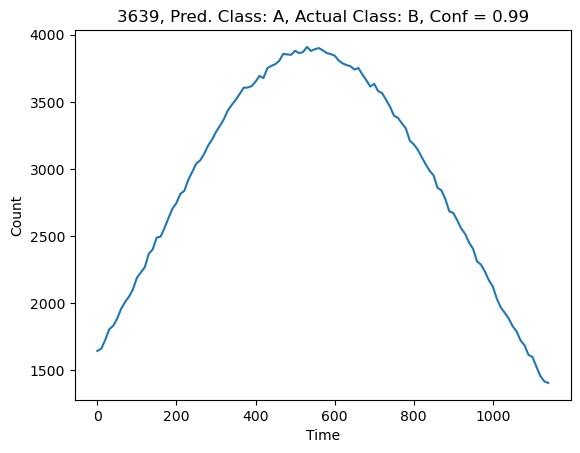

 36%|███████████████████████████████████████████████████▋                                                                                           | 358/990 [00:04<00:06, 100.04it/s]

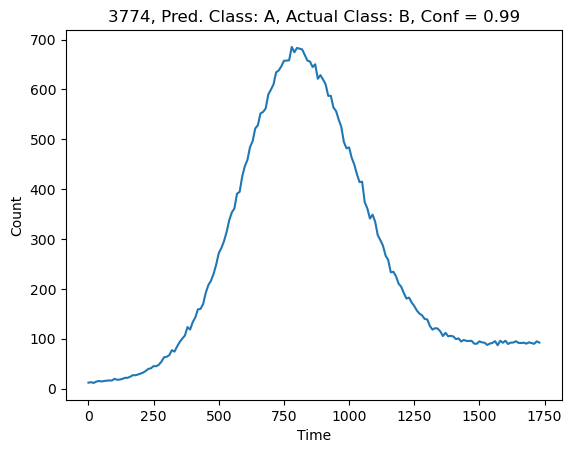

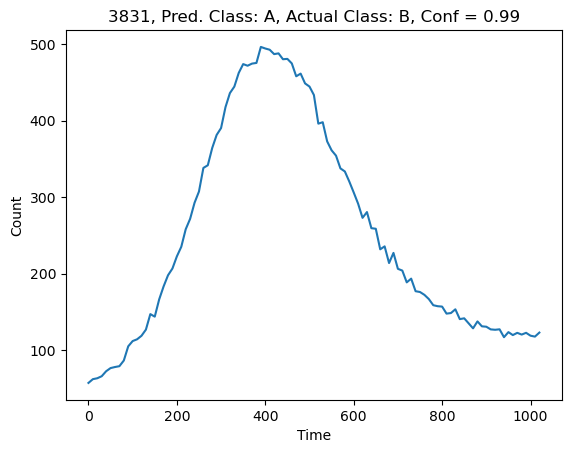

 38%|██████████████████████████████████████████████████████▉                                                                                        | 380/990 [00:04<00:05, 111.03it/s]

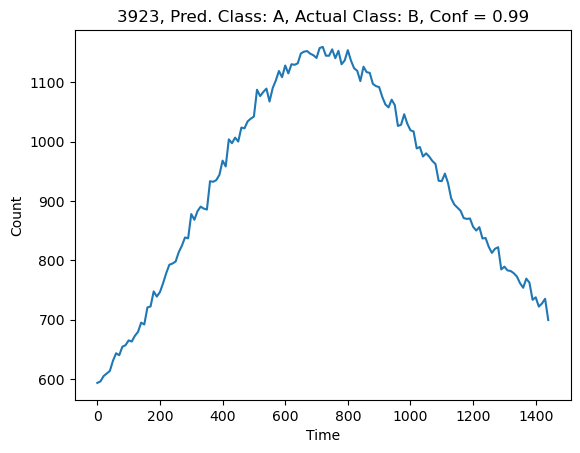

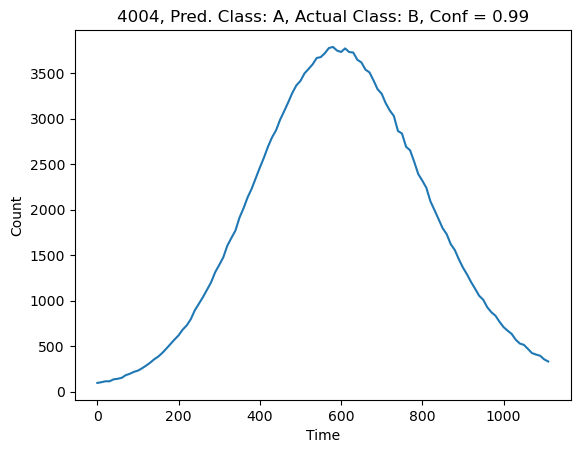

 40%|████████████████████████████████████████████████████████▉                                                                                      | 394/990 [00:05<00:05, 104.02it/s]

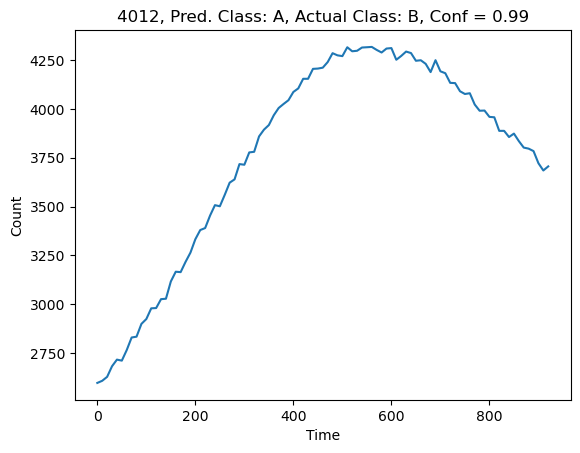

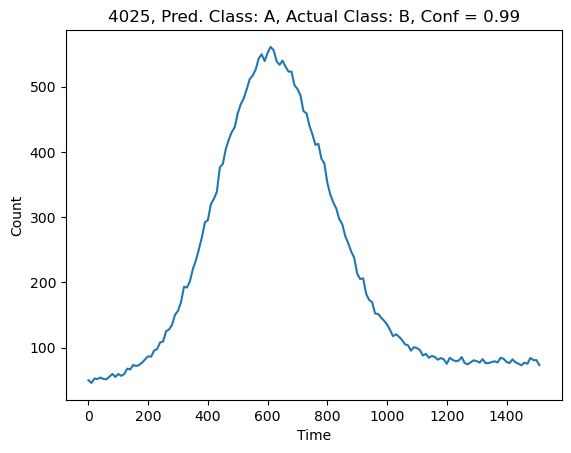

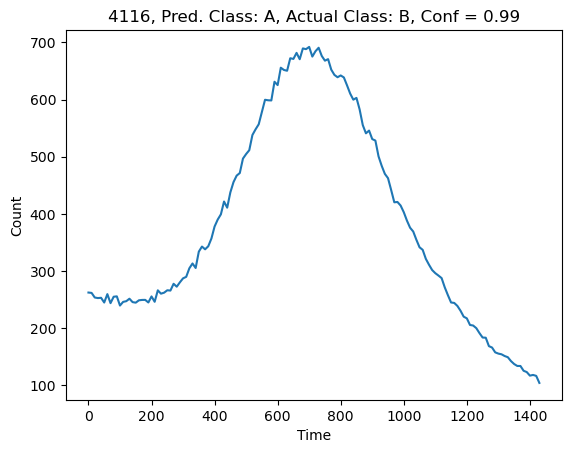

 41%|██████████████████████████████████████████████████████████▉                                                                                     | 405/990 [00:05<00:07, 80.78it/s]

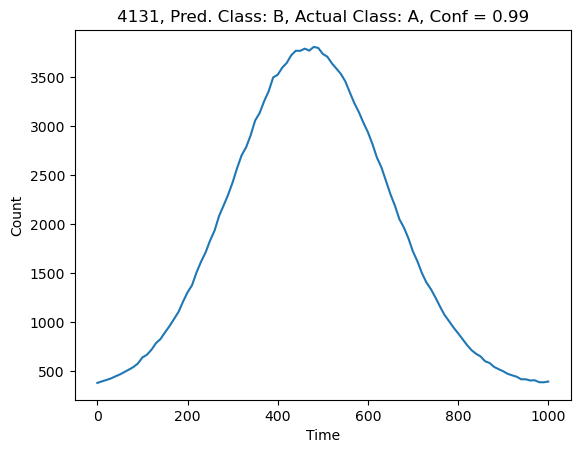

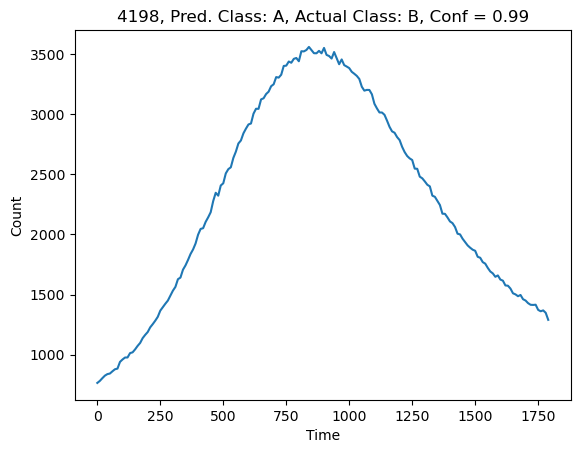

 42%|████████████████████████████████████████████████████████████▏                                                                                   | 414/990 [00:05<00:07, 74.16it/s]

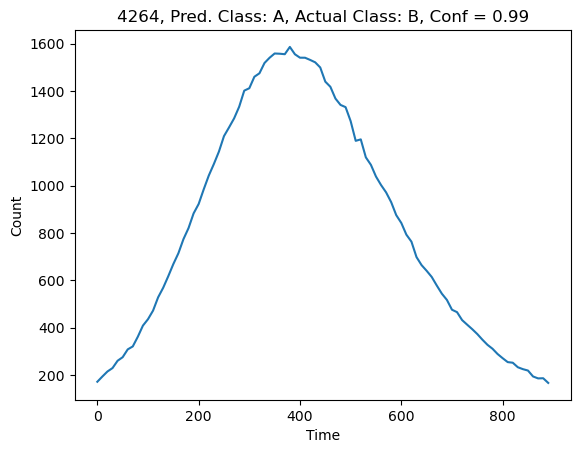

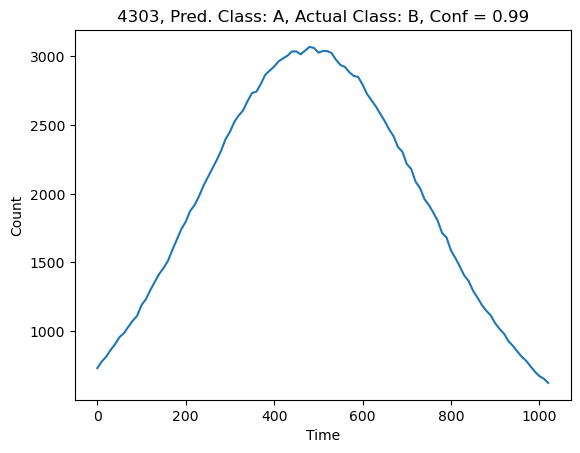

 43%|█████████████████████████████████████████████████████████████▍                                                                                  | 422/990 [00:05<00:08, 68.89it/s]

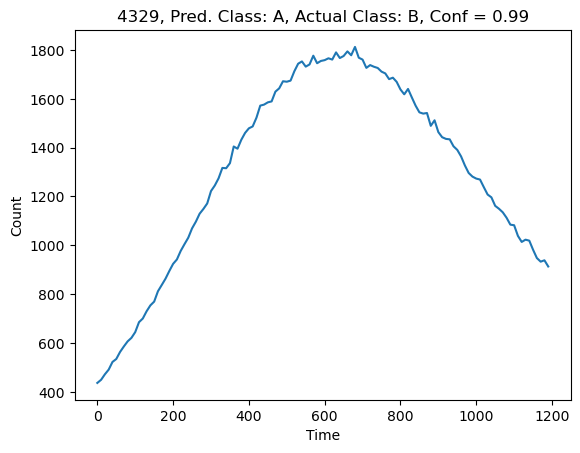

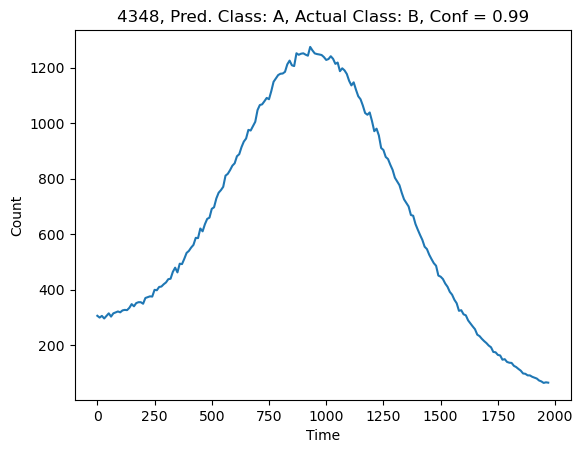

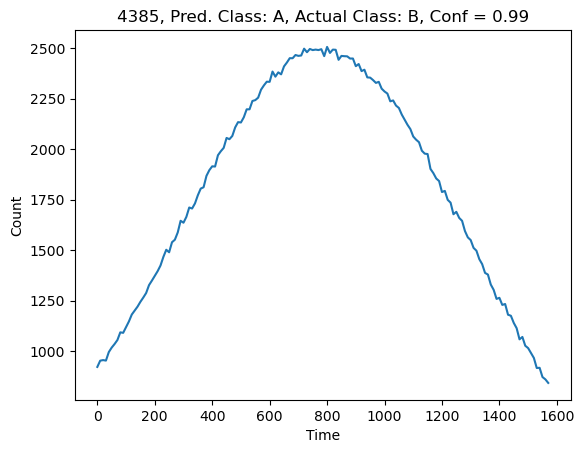

 43%|██████████████████████████████████████████████████████████████▌                                                                                 | 430/990 [00:05<00:10, 54.23it/s]

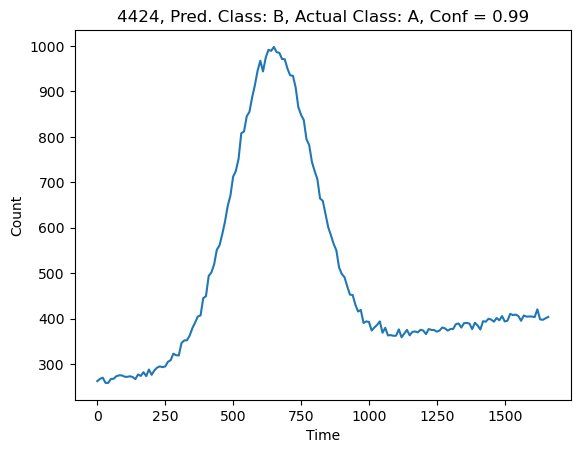

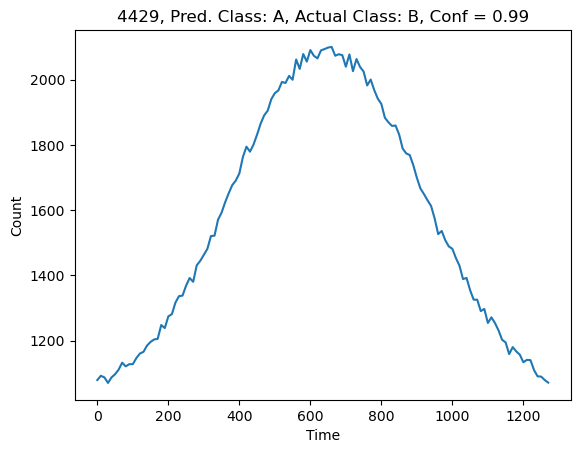

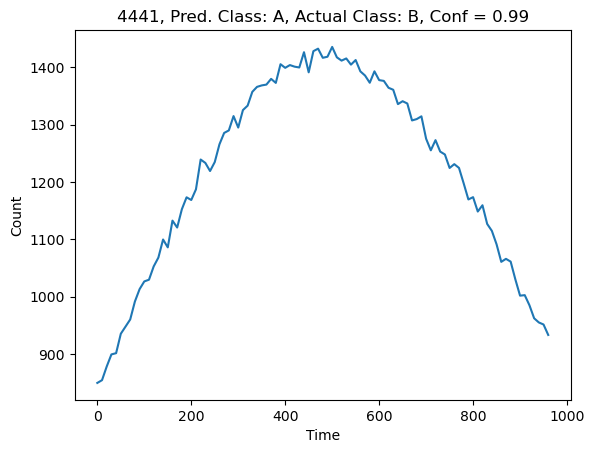

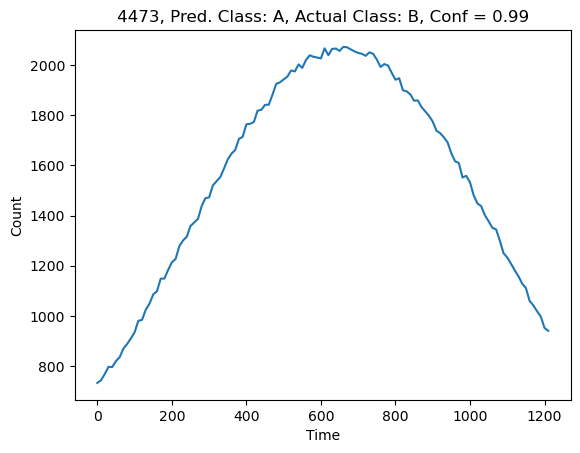

 44%|███████████████████████████████████████████████████████████████▍                                                                                | 436/990 [00:06<00:14, 39.53it/s]

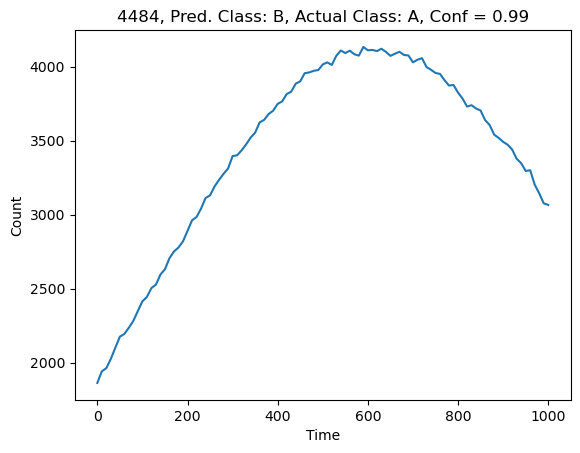

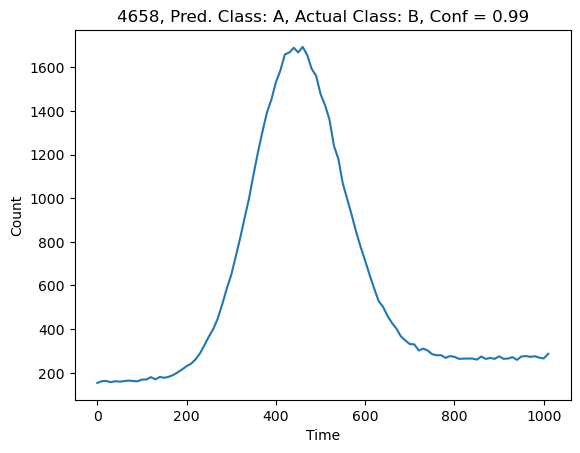

 46%|██████████████████████████████████████████████████████████████████▏                                                                             | 455/990 [00:06<00:09, 57.78it/s]

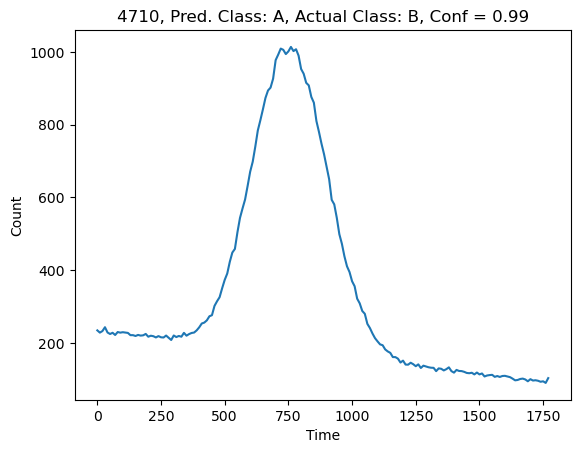

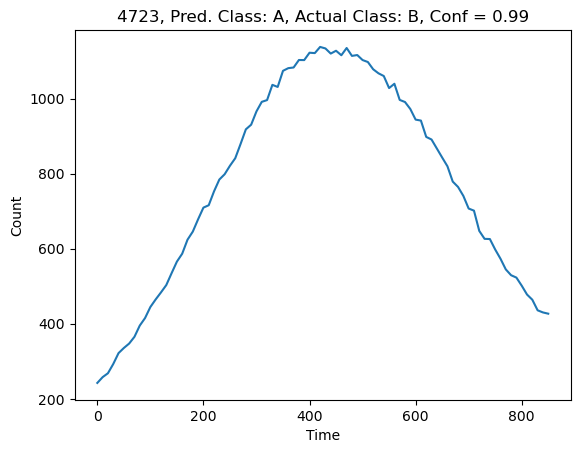

 47%|███████████████████████████████████████████████████████████████████▏                                                                            | 462/990 [00:06<00:09, 55.06it/s]

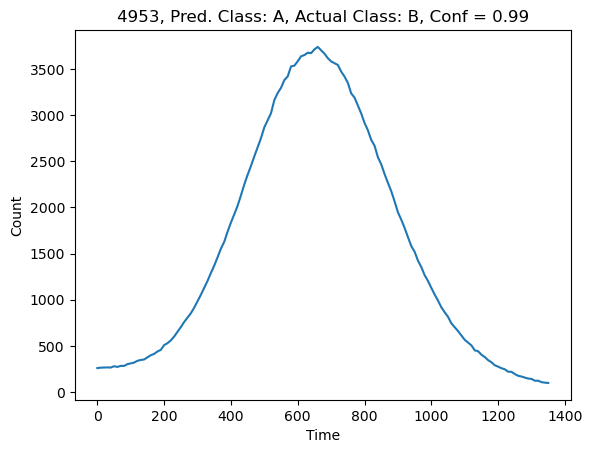

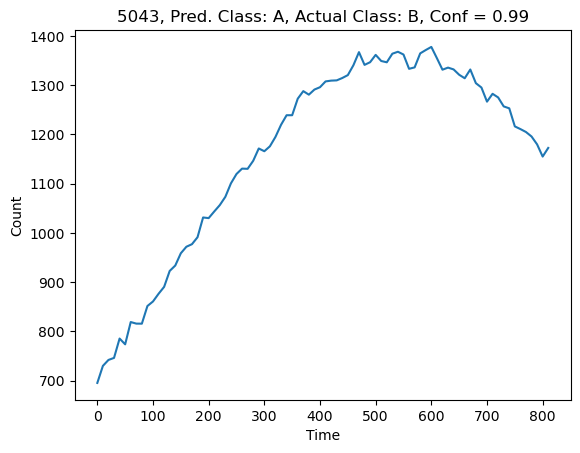

 49%|██████████████████████████████████████████████████████████████████████▊                                                                         | 487/990 [00:06<00:06, 79.73it/s]

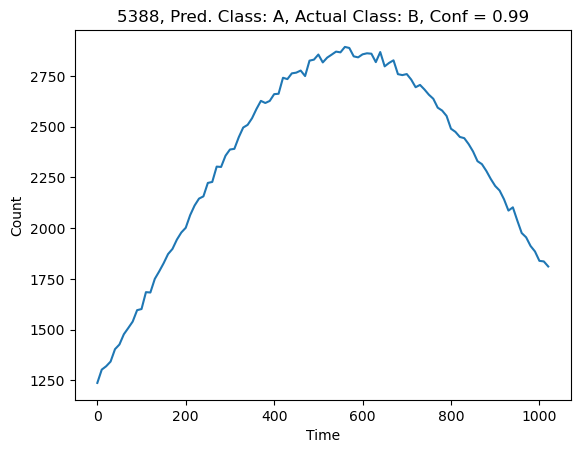

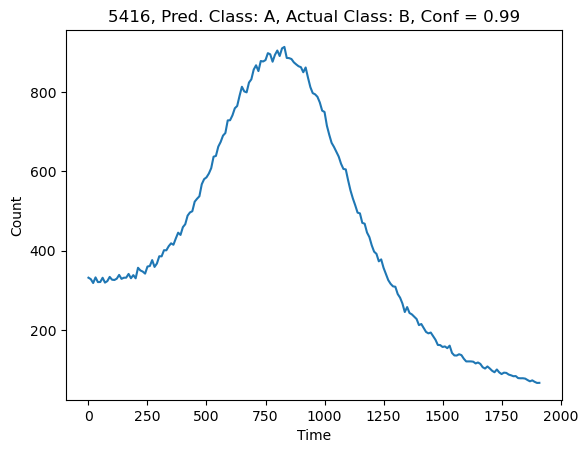

 52%|██████████████████████████████████████████████████████████████████████████▉                                                                    | 519/990 [00:06<00:04, 110.99it/s]

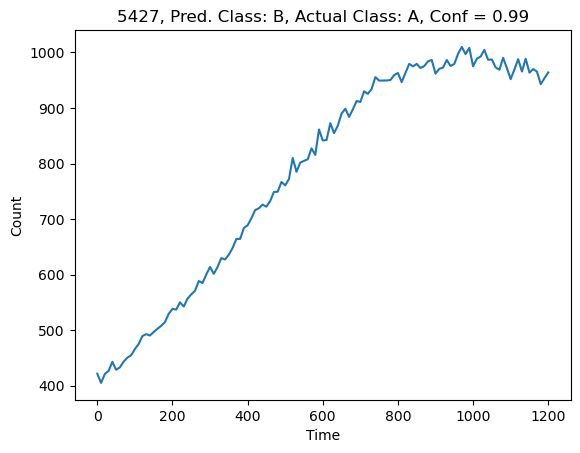

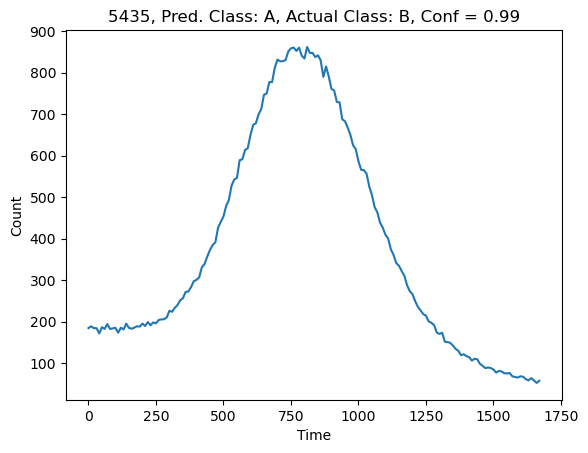

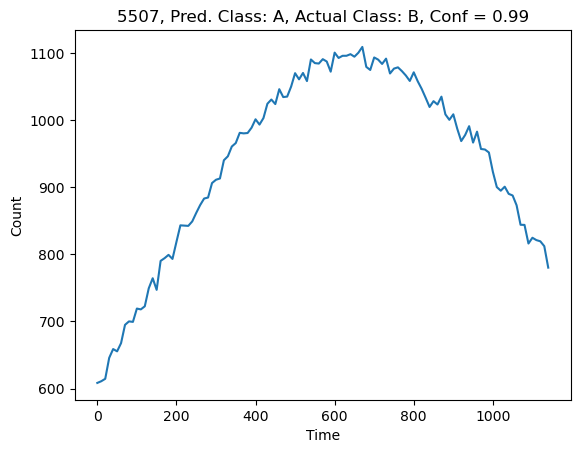

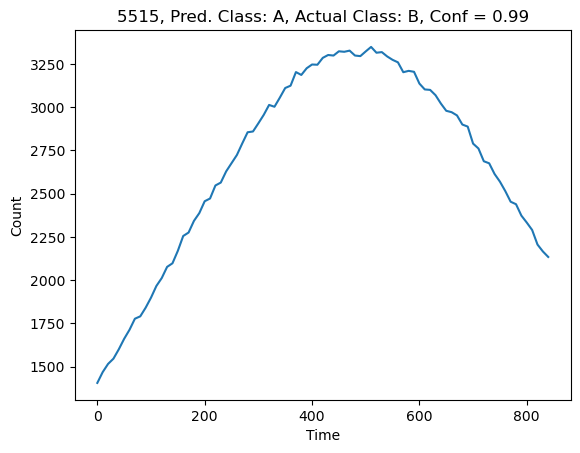

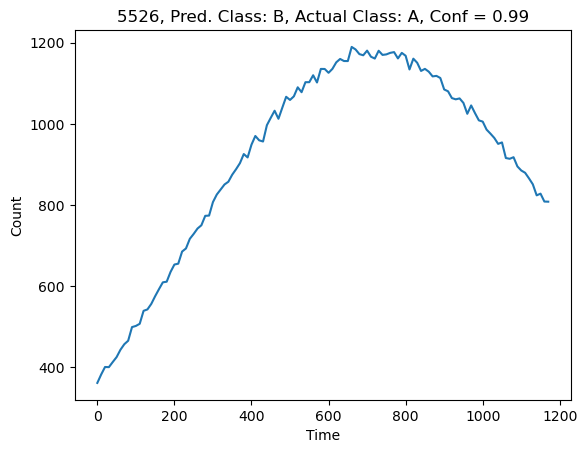

 54%|█████████████████████████████████████████████████████████████████████████████▏                                                                  | 531/990 [00:07<00:06, 71.08it/s]

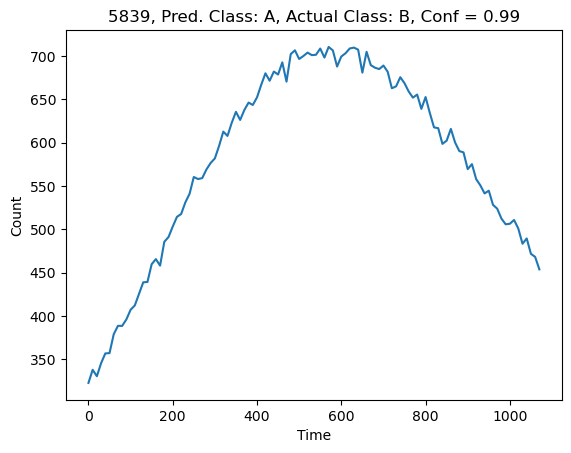

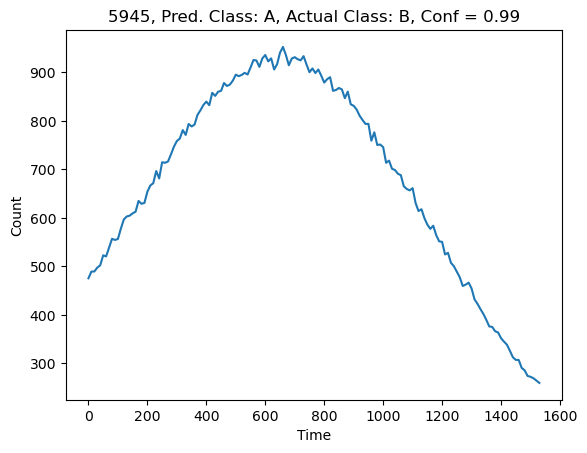

 57%|██████████████████████████████████████████████████████████████████████████████████                                                              | 564/990 [00:07<00:04, 99.49it/s]

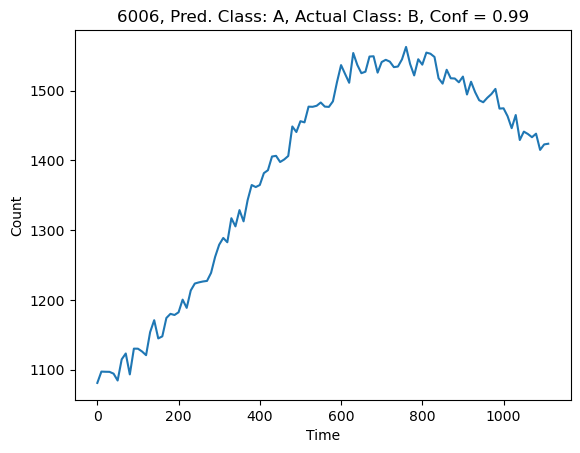

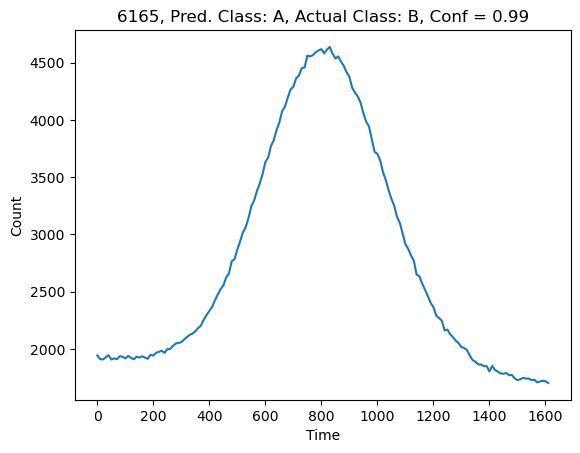

 59%|████████████████████████████████████████████████████████████████████████████████████▎                                                          | 584/990 [00:07<00:03, 106.12it/s]

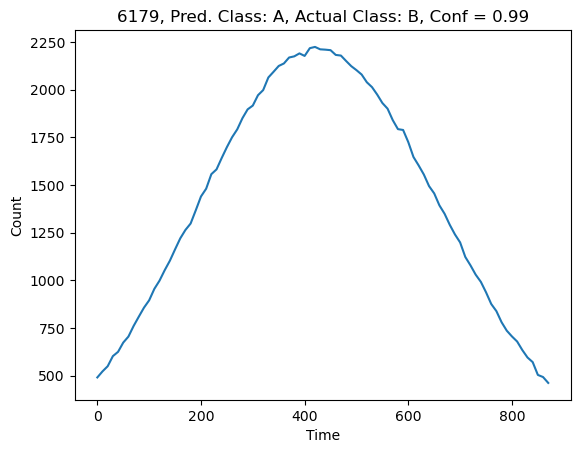

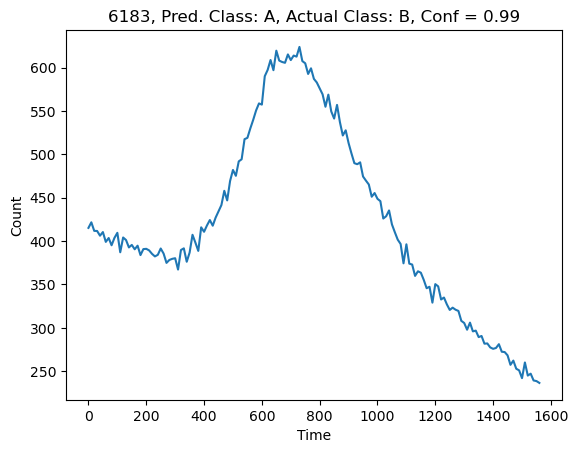

 60%|██████████████████████████████████████████████████████████████████████████████████████▊                                                         | 597/990 [00:07<00:03, 98.72it/s]

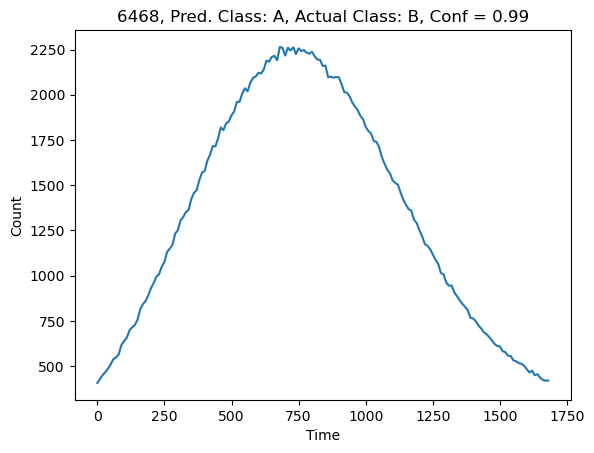

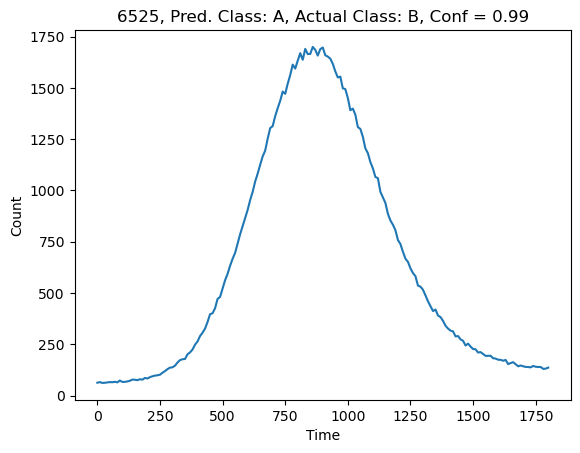

 63%|██████████████████████████████████████████████████████████████████████████████████████████▍                                                    | 626/990 [00:07<00:03, 118.31it/s]

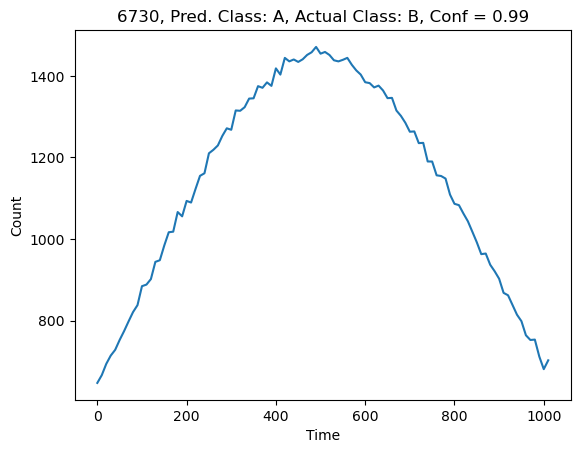

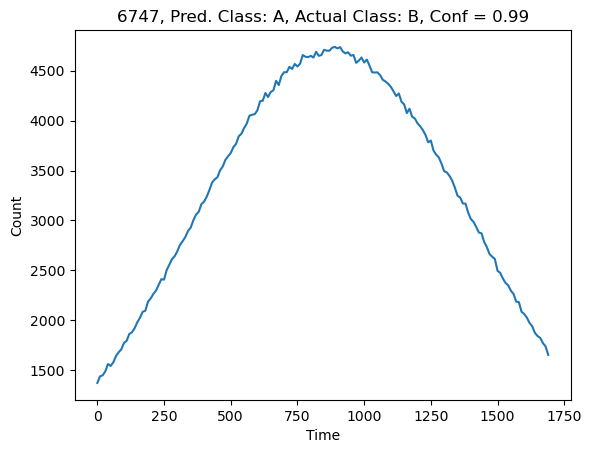

 66%|██████████████████████████████████████████████████████████████████████████████████████████████                                                 | 651/990 [00:08<00:02, 129.91it/s]

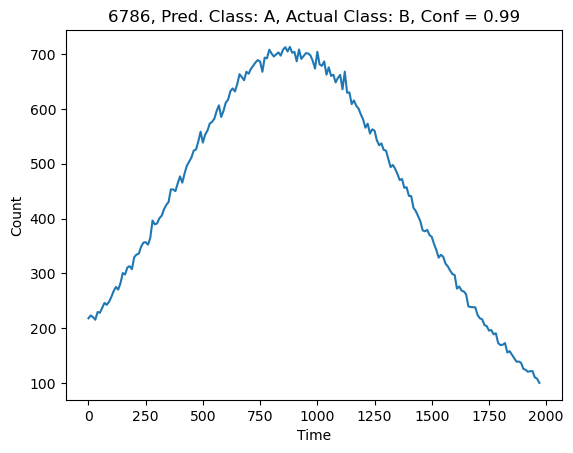

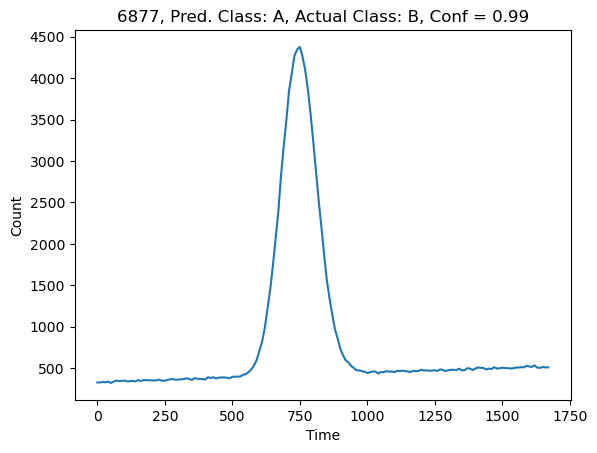

 67%|████████████████████████████████████████████████████████████████████████████████████████████████                                               | 665/990 [00:08<00:02, 115.90it/s]

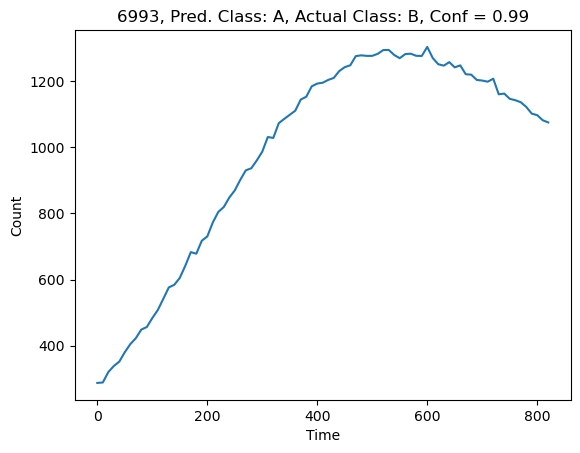

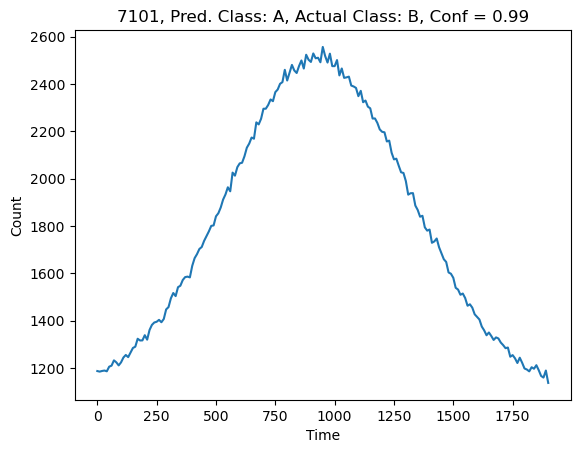

 70%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                           | 691/990 [00:08<00:02, 130.92it/s]

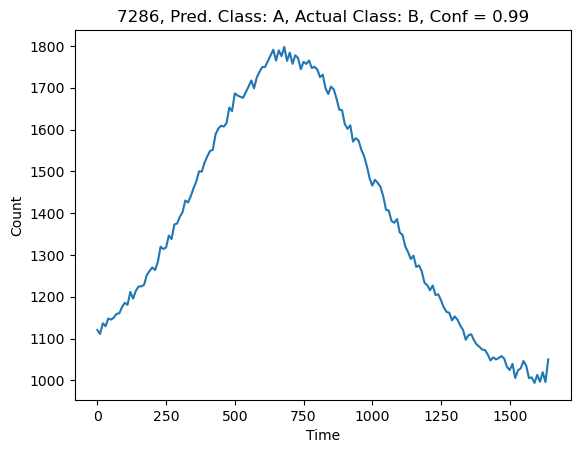

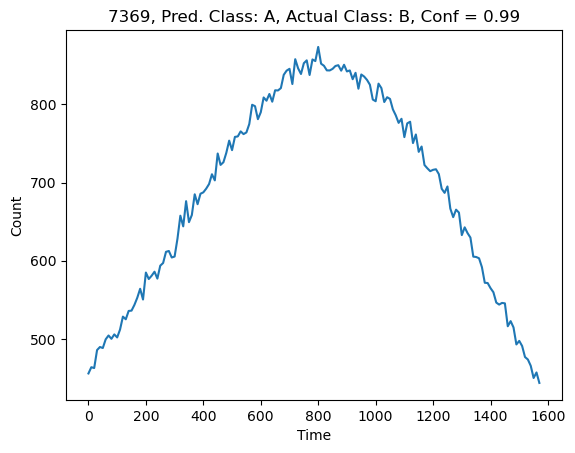

 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                                        | 713/990 [00:08<00:02, 132.33it/s]

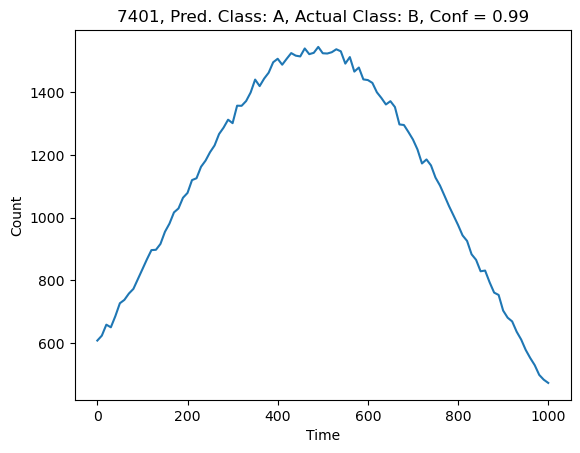

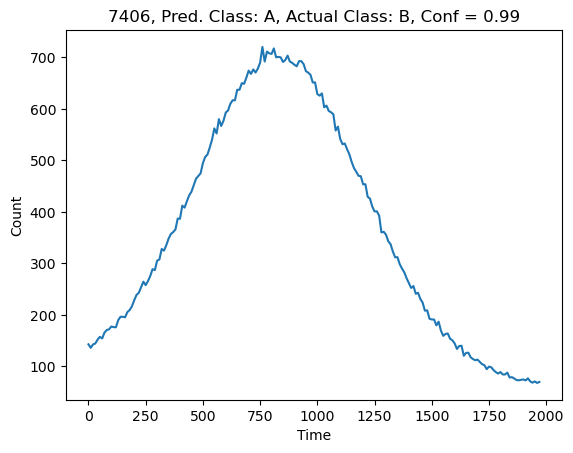

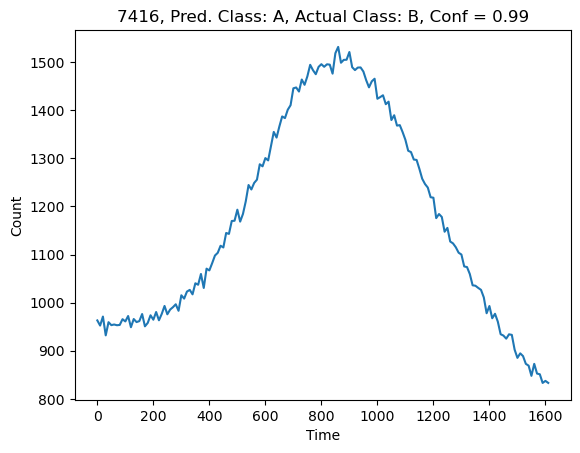

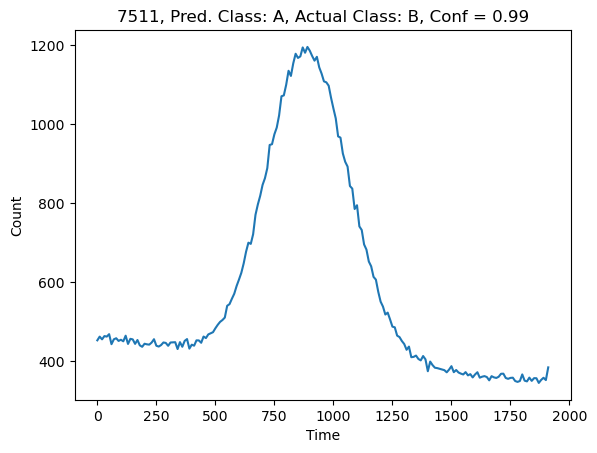

 73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 727/990 [00:08<00:03, 73.45it/s]

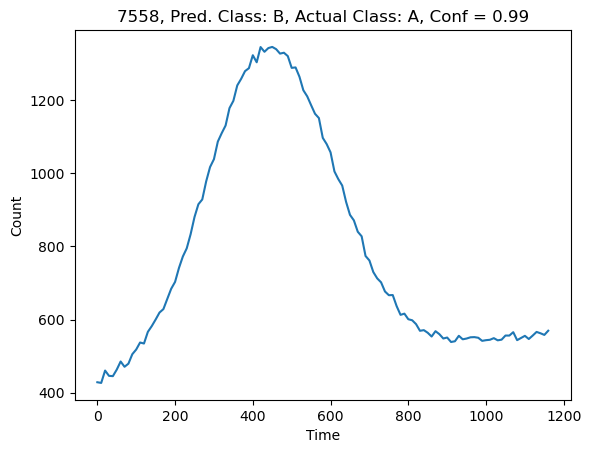

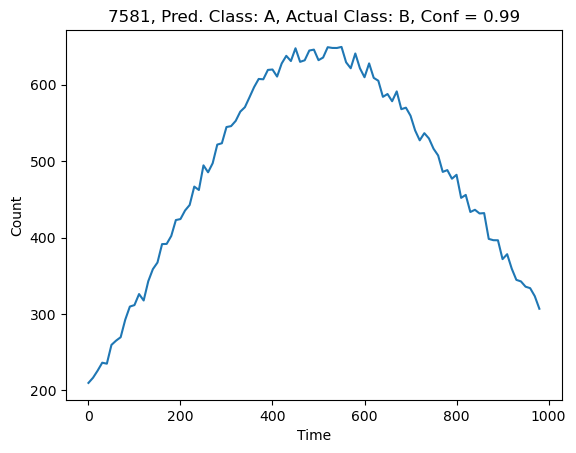

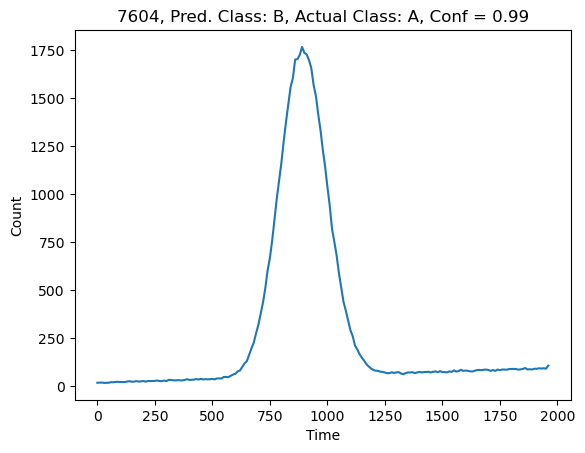

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                    | 738/990 [00:09<00:03, 66.80it/s]

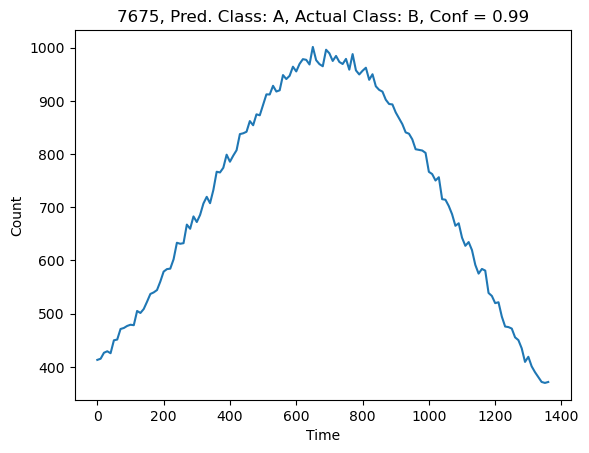

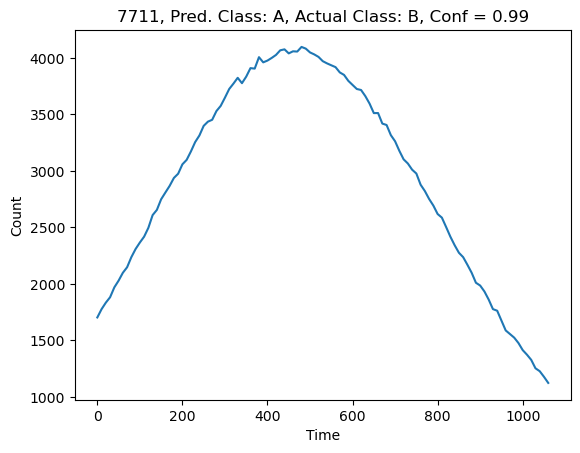

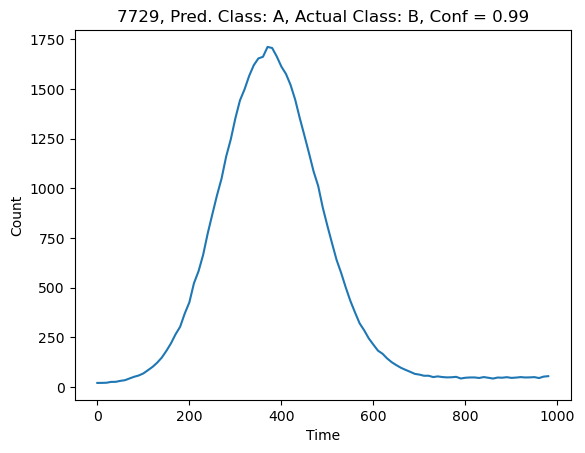

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                   | 747/990 [00:09<00:04, 58.51it/s]

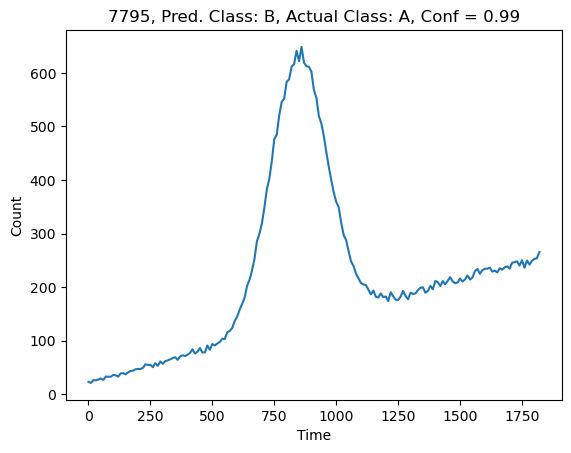

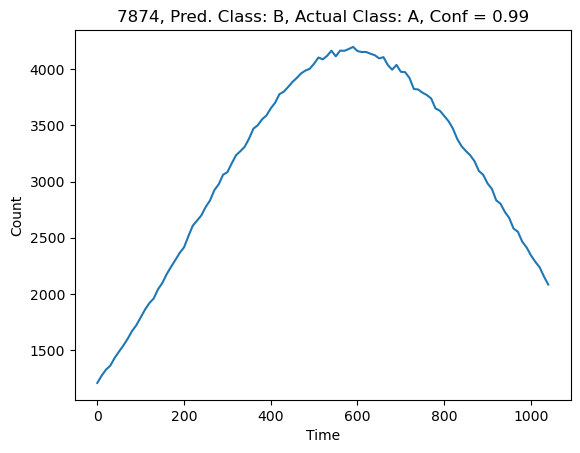

 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                | 764/990 [00:09<00:03, 69.27it/s]

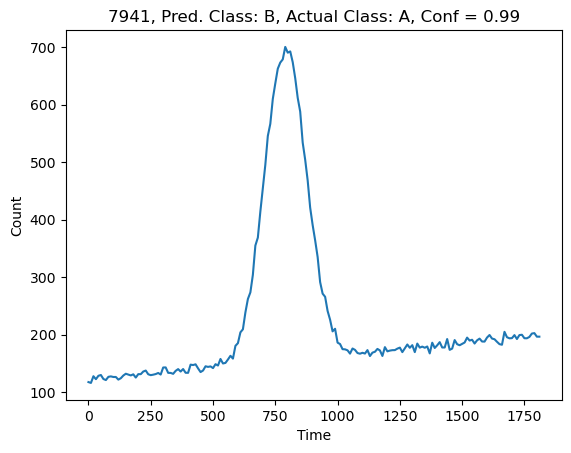

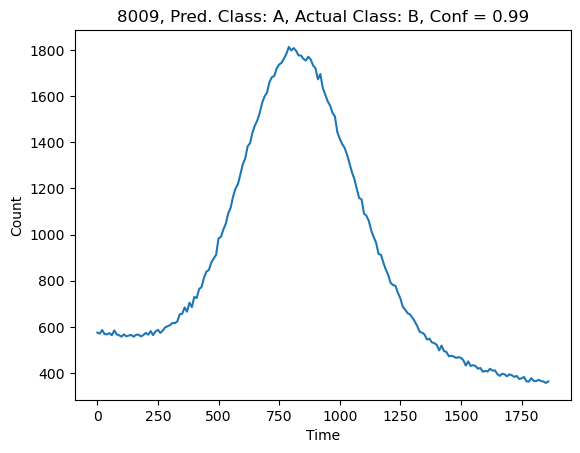

 79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                              | 779/990 [00:09<00:02, 74.24it/s]

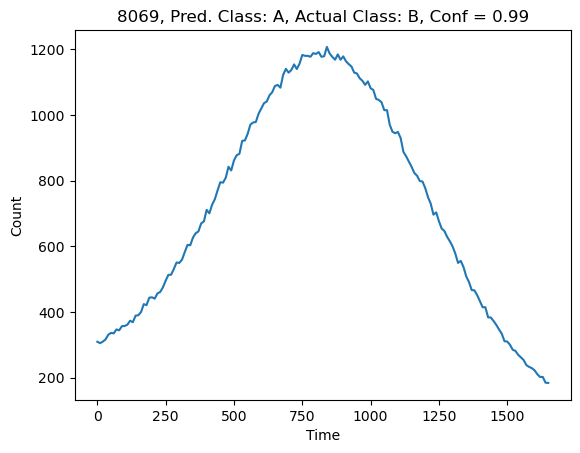

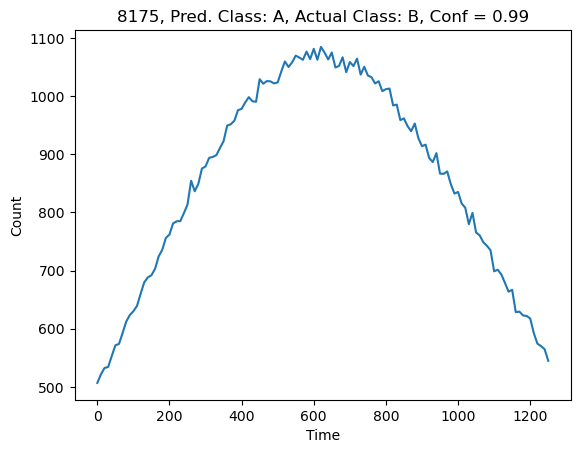

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                            | 795/990 [00:09<00:02, 80.81it/s]

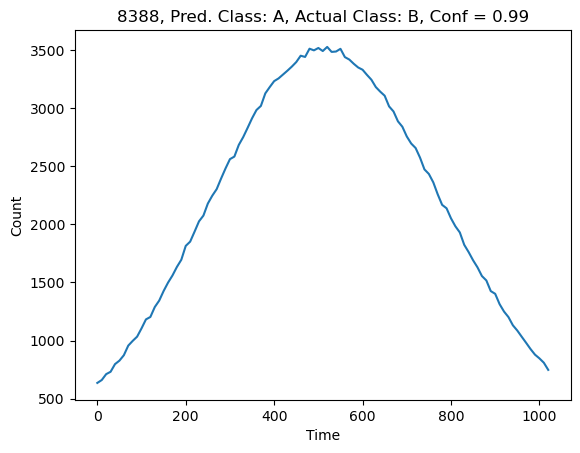

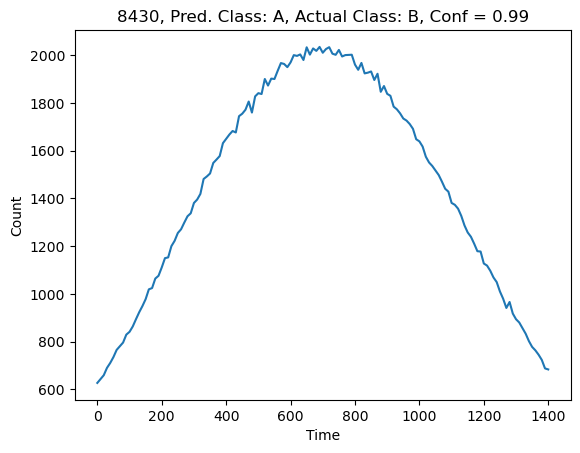

 83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                        | 822/990 [00:10<00:01, 103.54it/s]

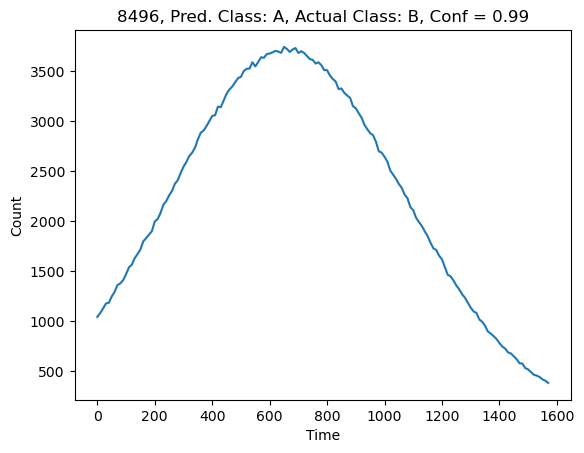

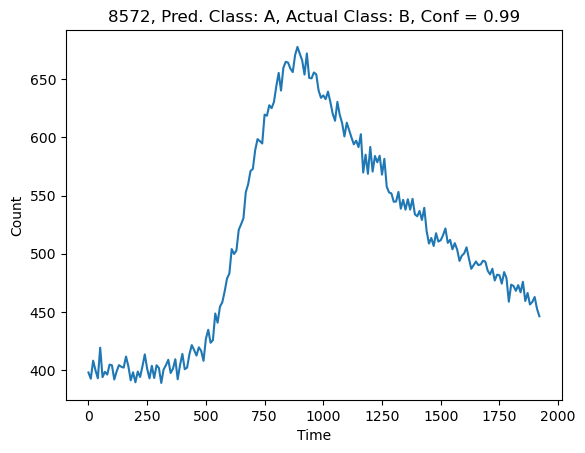

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 835/990 [00:10<00:01, 96.91it/s]

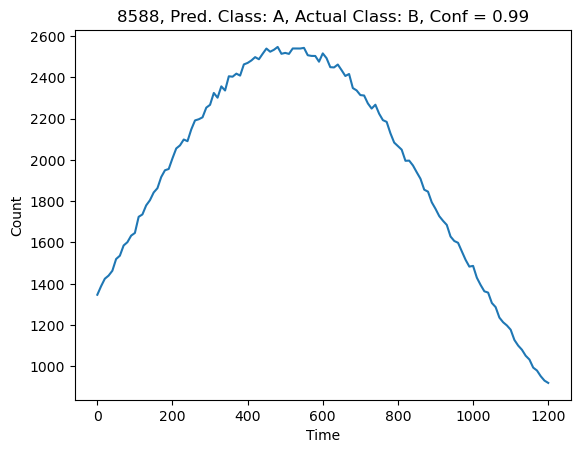

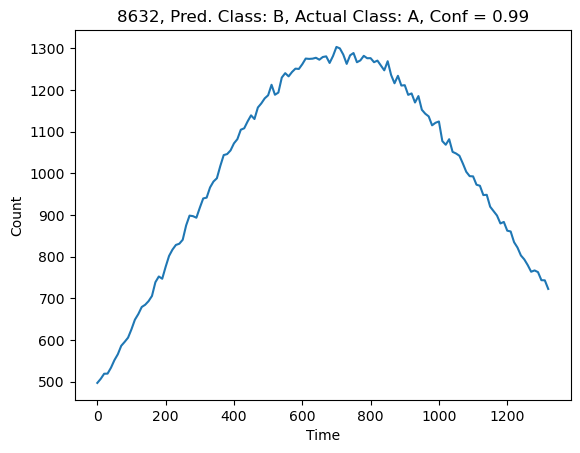

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 846/990 [00:10<00:01, 87.74it/s]

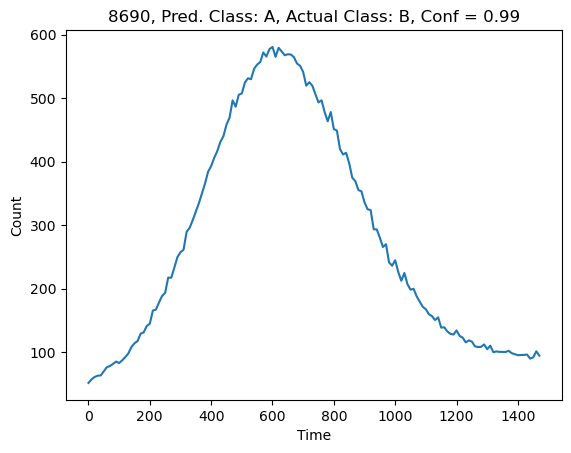

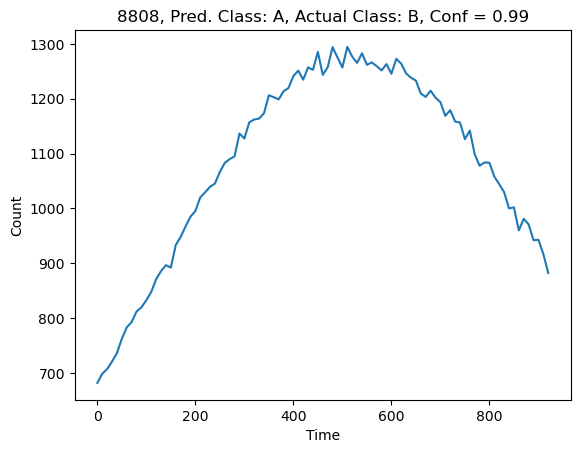

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 858/990 [00:10<00:01, 84.27it/s]

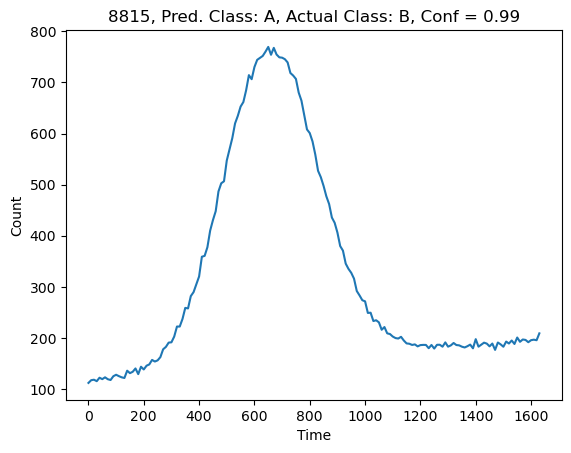

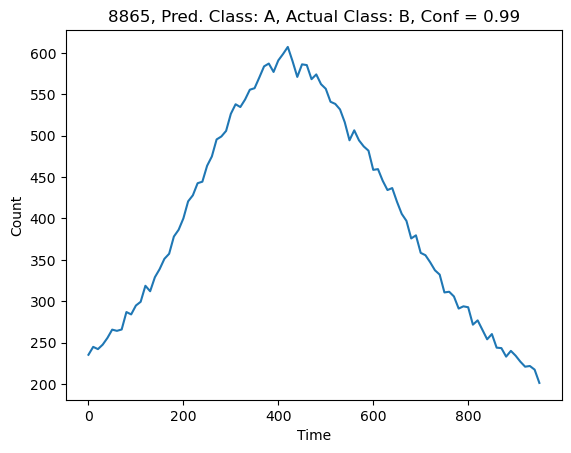

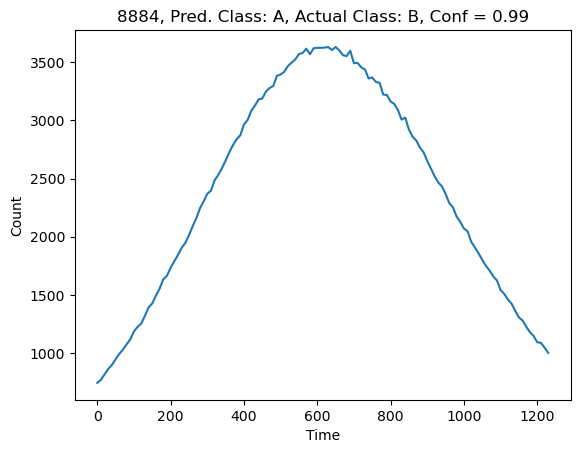

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 867/990 [00:10<00:01, 66.14it/s]

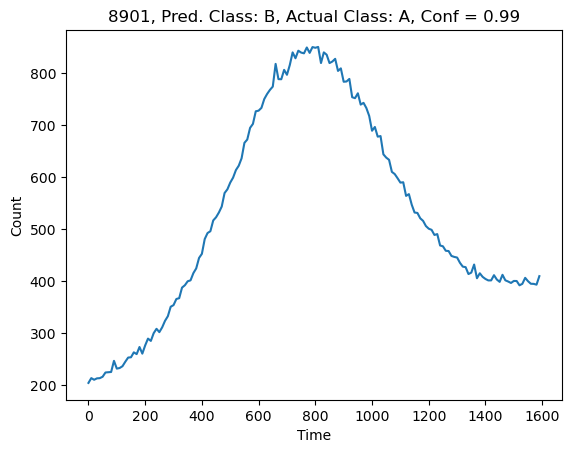

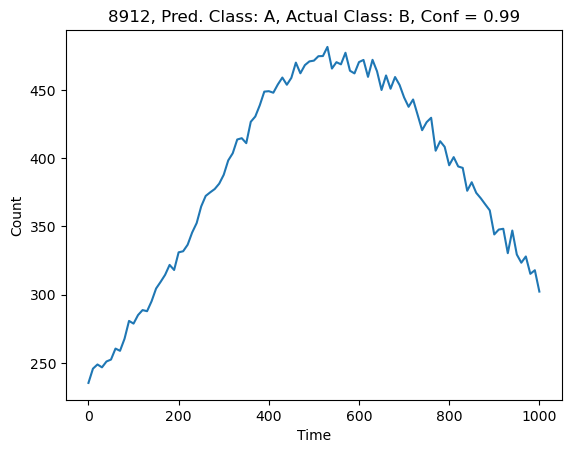

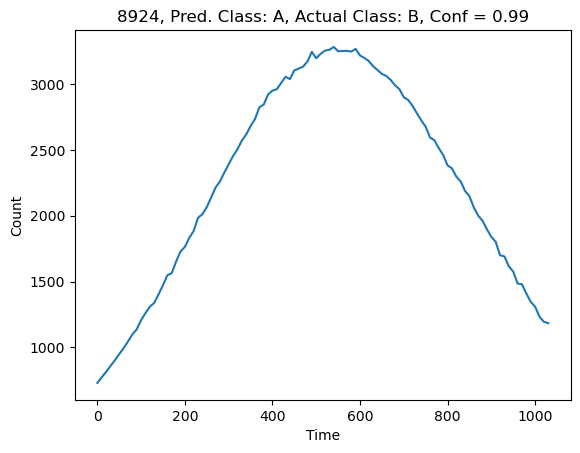

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 875/990 [00:11<00:02, 55.97it/s]

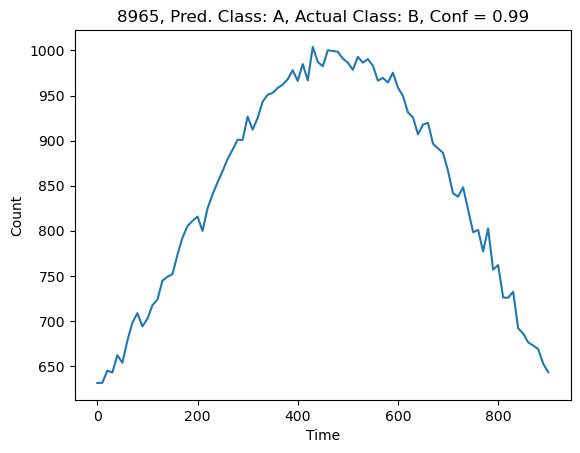

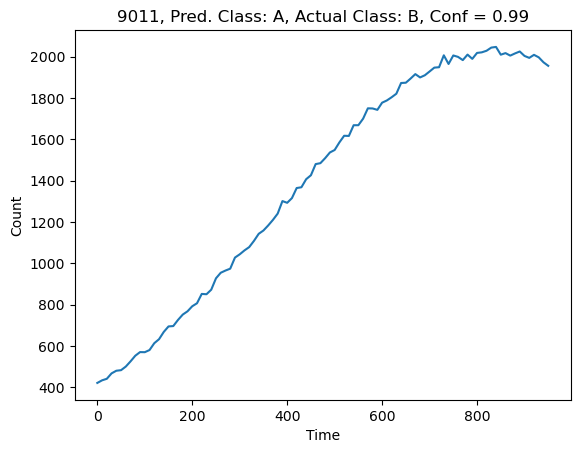

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 883/990 [00:11<00:01, 54.31it/s]

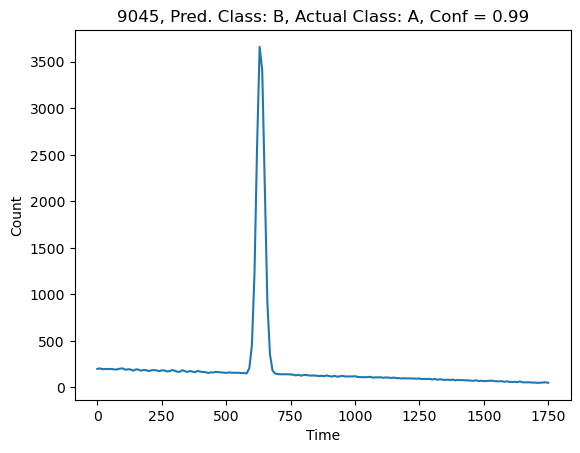

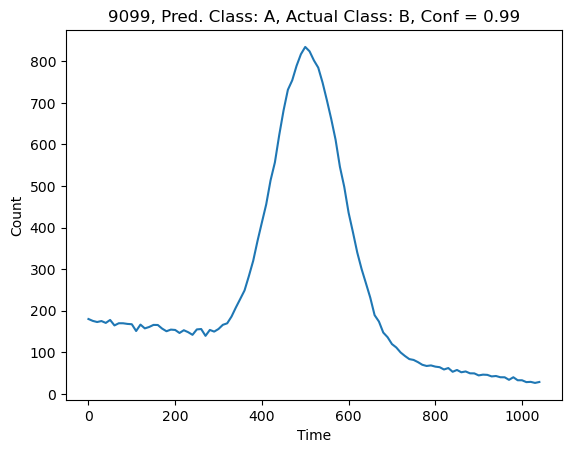

 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 894/990 [00:11<00:01, 57.59it/s]

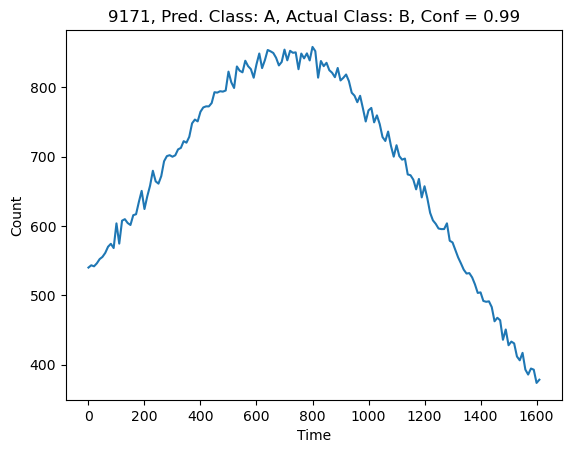

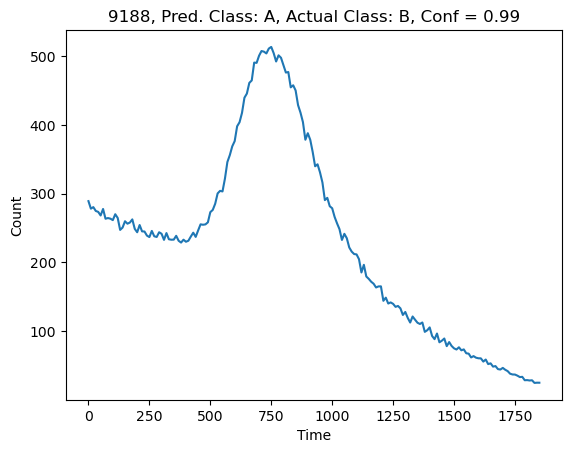

 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 901/990 [00:11<00:01, 54.61it/s]

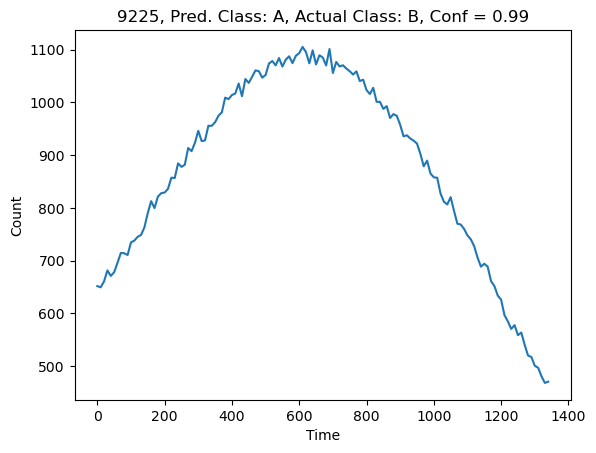

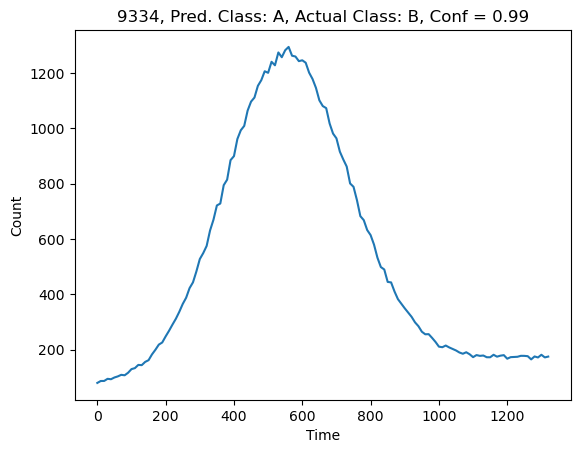

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 917/990 [00:11<00:01, 67.97it/s]

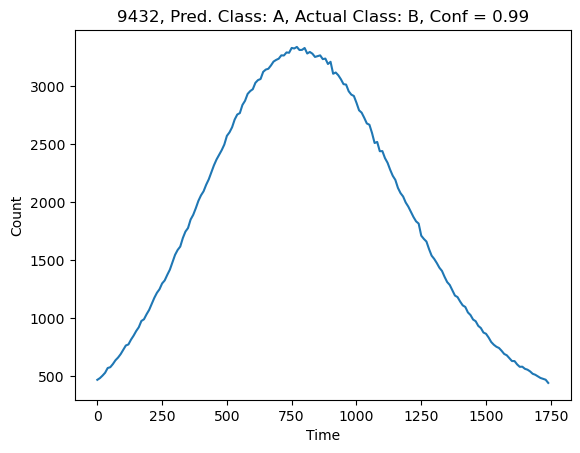

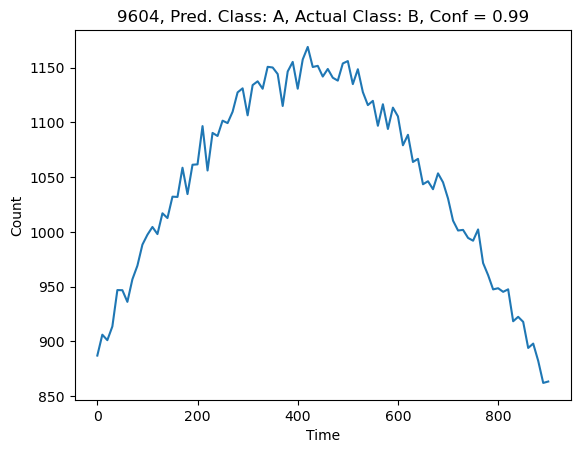

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 940/990 [00:11<00:00, 91.01it/s]

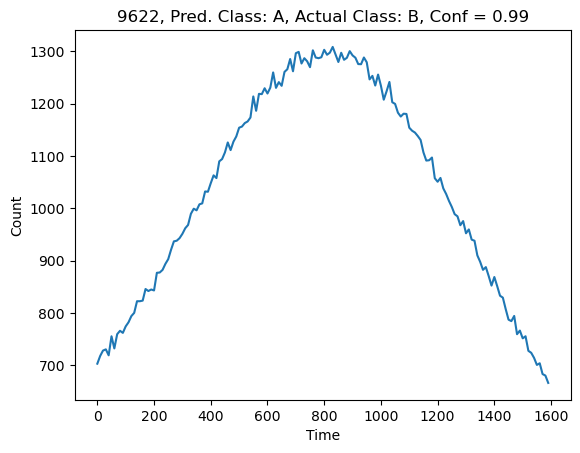

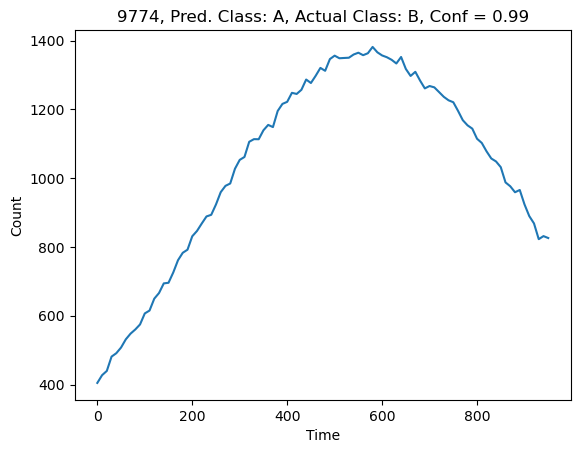

 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 961/990 [00:11<00:00, 103.92it/s]

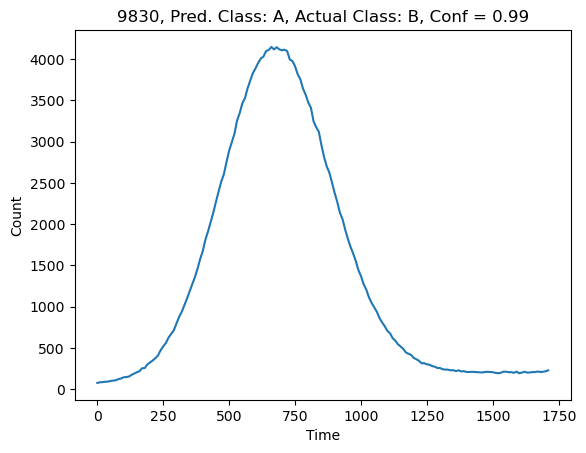

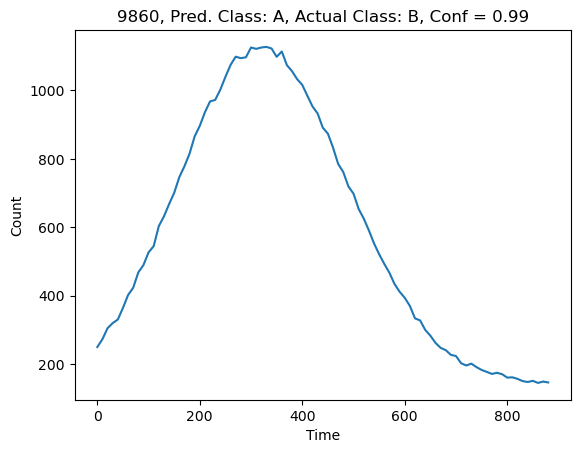

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 972/990 [00:12<00:00, 93.94it/s]

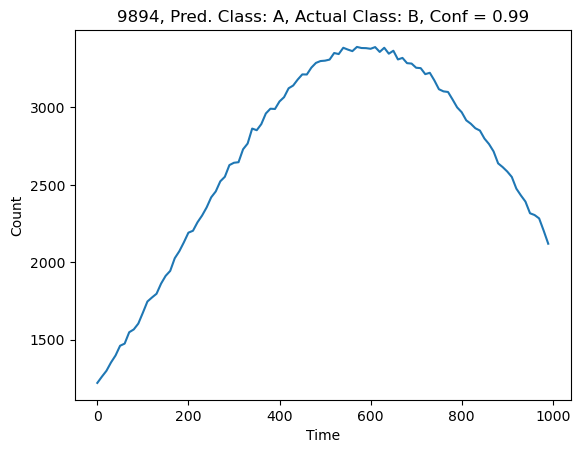

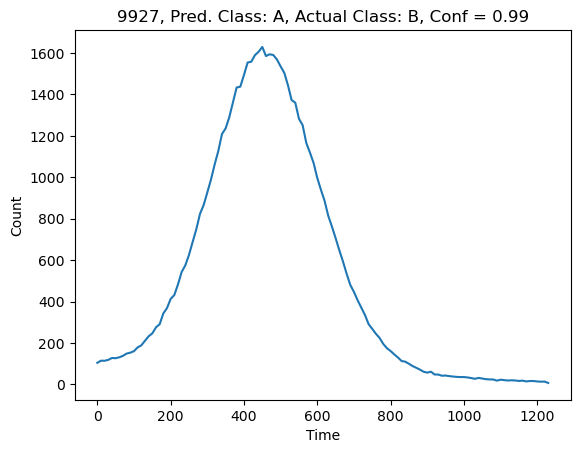

 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 982/990 [00:12<00:00, 85.66it/s]

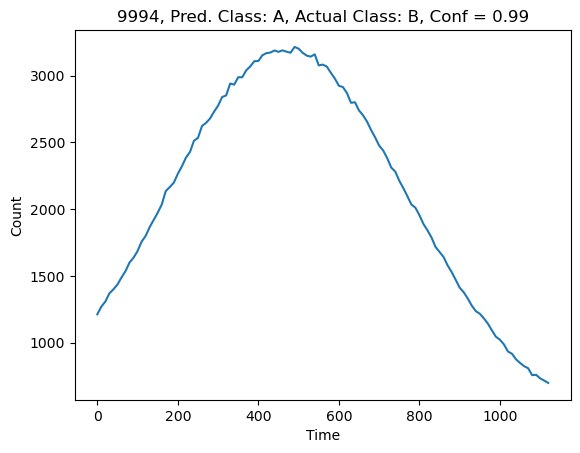

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 990/990 [00:12<00:00, 79.97it/s]


In [32]:
# plotting misclassified 
for i, pred1 in enumerate(tqdm(preds1)):
    pred1_class = int(np.round(pred1[0]))
    if class_list[str(pred1_class)] != class_list[str(labels_val[i])]:
        plt.plot(np.arange(0, len(data_val[i][data_val[i] != 0]))*10, data_val[i][data_val[i] != 0])

        plt.xlabel('Time')
        plt.ylabel('Count')

        plt.title(f"{ids_val[i]}, Pred. Class: {class_list[str(pred1_class)]}, Actual Class: {class_list[str(labels_val[i])]}, Conf = {np.round(conf, 3)}")
        plt.show()

  0%|                                                                                                                                                          | 0/990 [00:00<?, ?it/s]

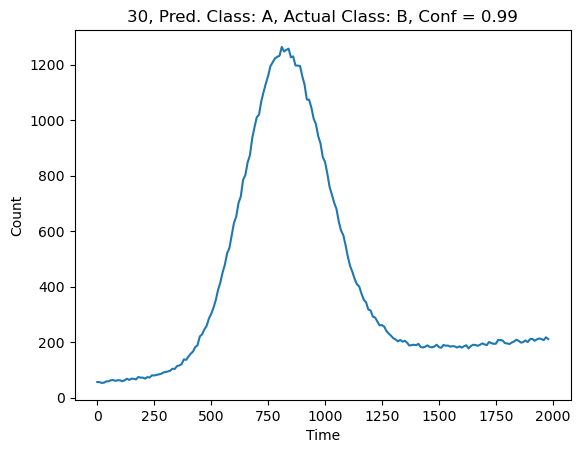

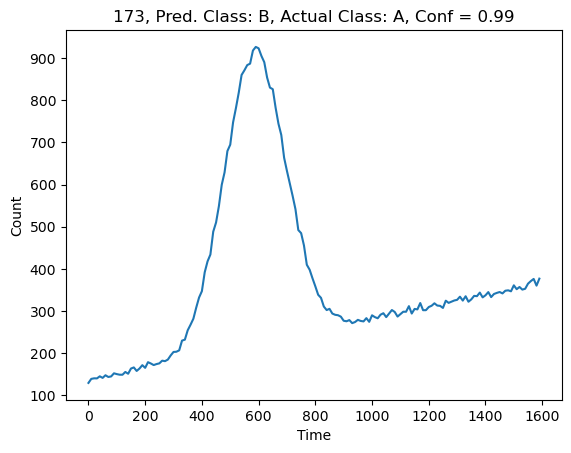

  1%|██                                                                                                                                               | 14/990 [00:00<00:13, 73.78it/s]

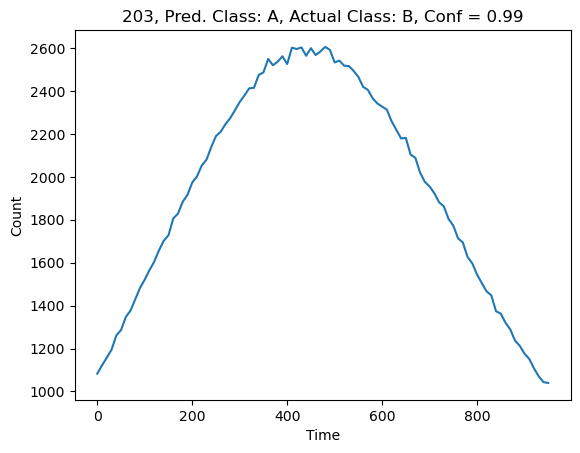

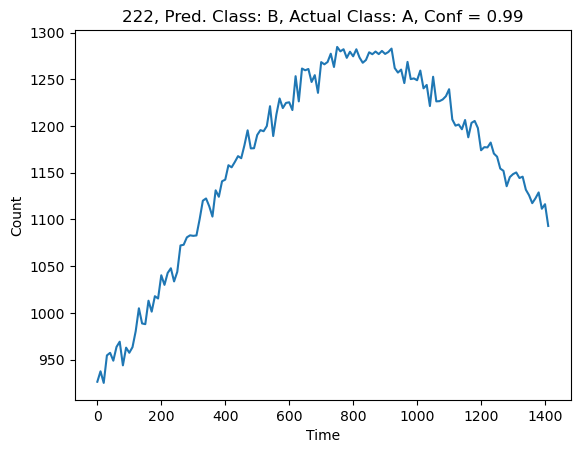

  2%|███▏                                                                                                                                             | 22/990 [00:00<00:16, 57.88it/s]

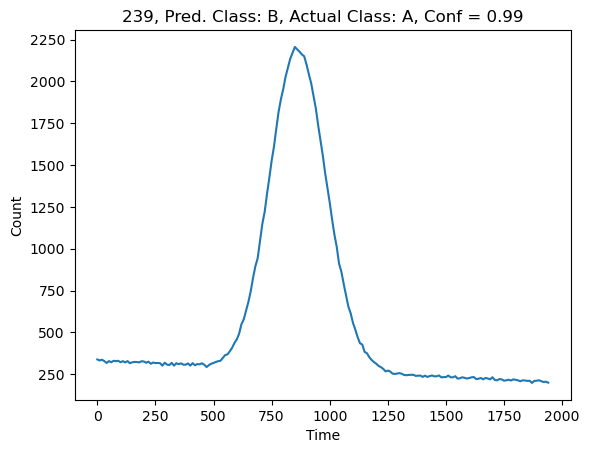

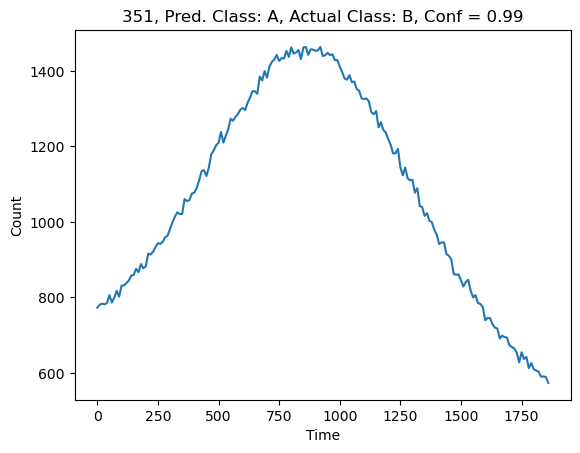

  3%|████▏                                                                                                                                            | 29/990 [00:00<00:19, 50.30it/s]

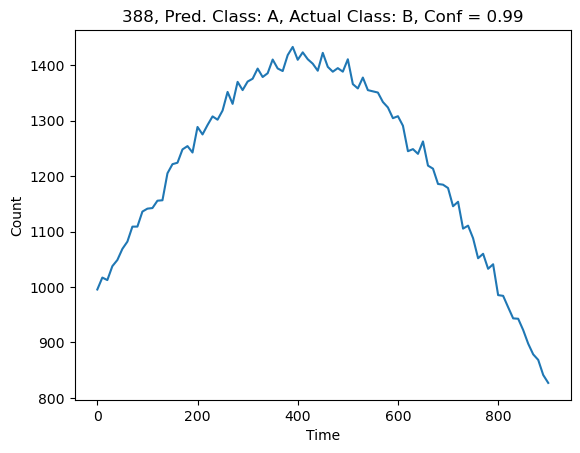

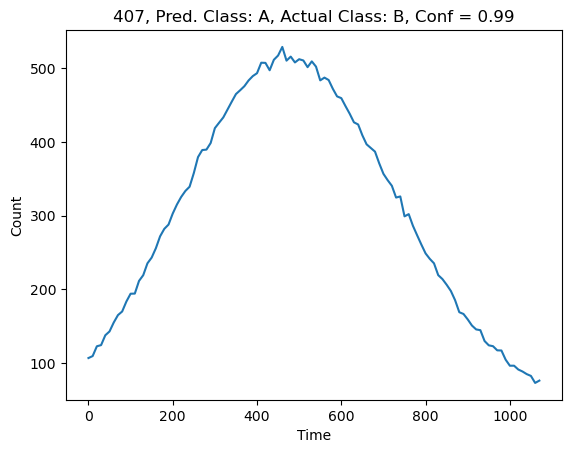

  4%|█████▎                                                                                                                                           | 36/990 [00:00<00:19, 48.21it/s]

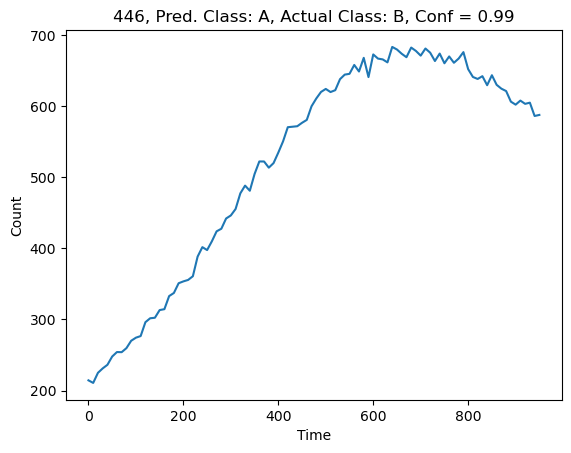

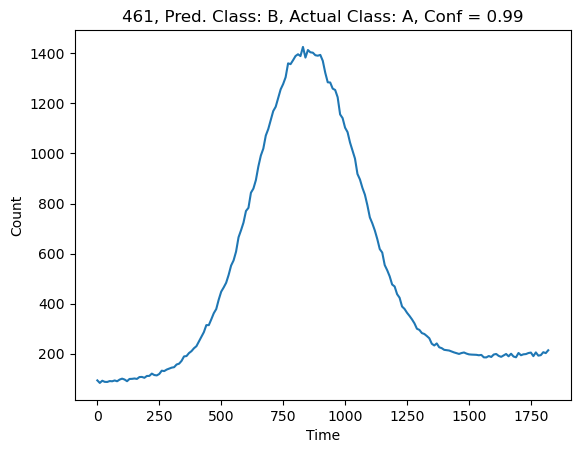

  4%|██████▍                                                                                                                                          | 44/990 [00:00<00:19, 48.36it/s]

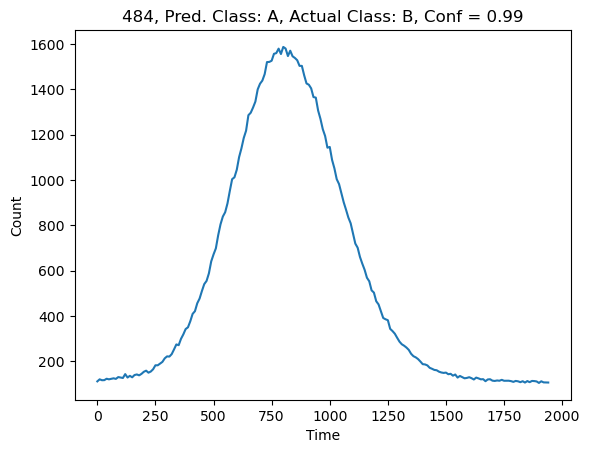

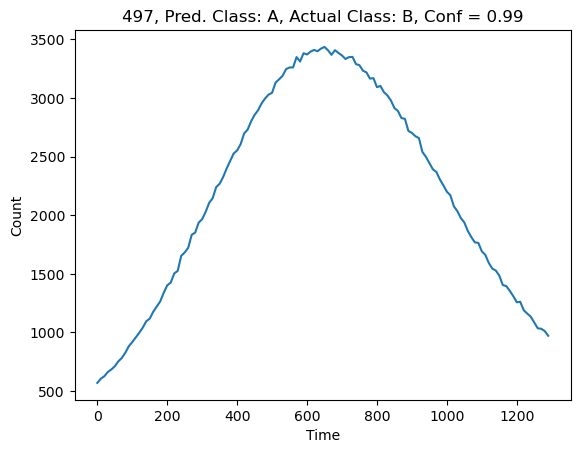

  5%|███████▎                                                                                                                                         | 50/990 [00:01<00:21, 43.18it/s]

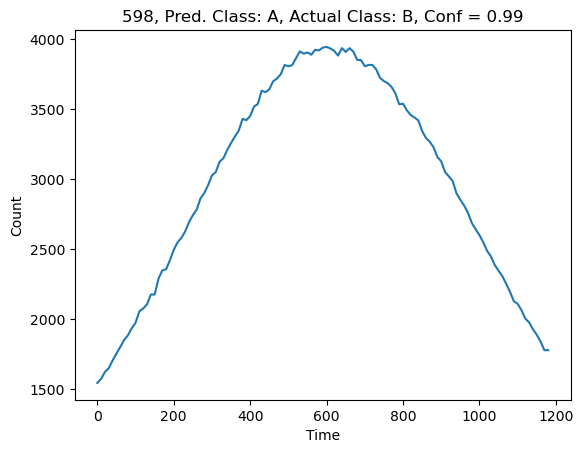

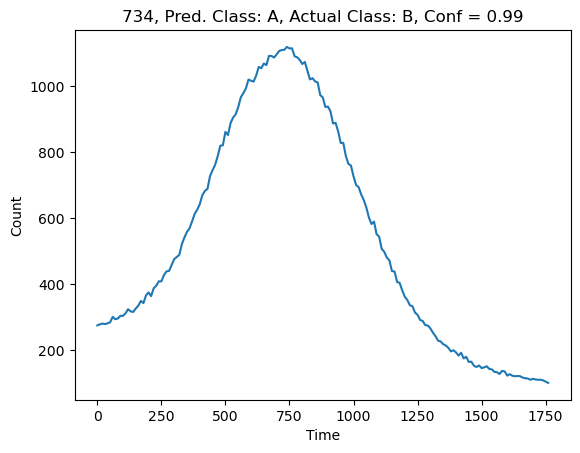

  7%|█████████▉                                                                                                                                       | 68/990 [00:01<00:14, 63.78it/s]

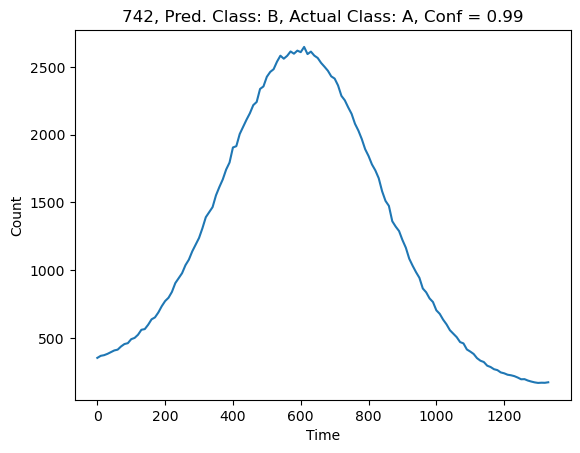

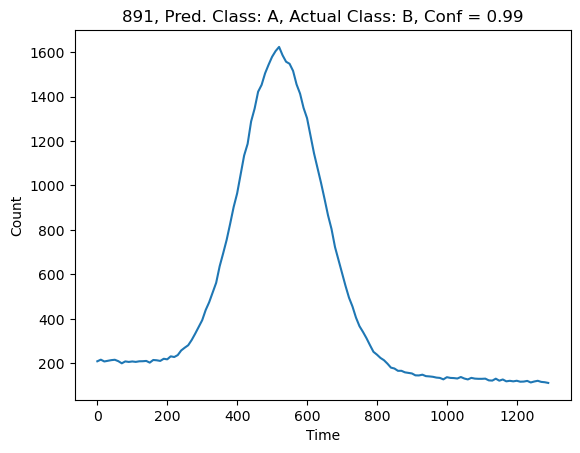

  9%|████████████▉                                                                                                                                    | 88/990 [00:01<00:10, 82.60it/s]

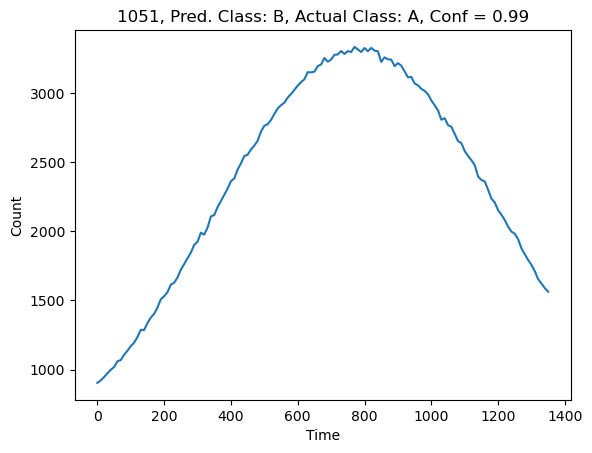

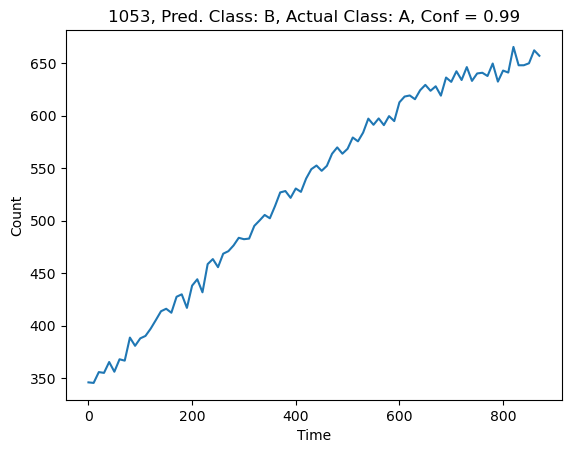

 11%|███████████████▊                                                                                                                                | 109/990 [00:01<00:09, 97.57it/s]

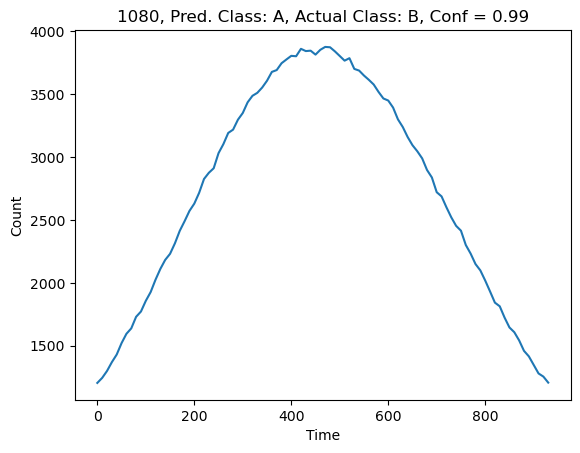

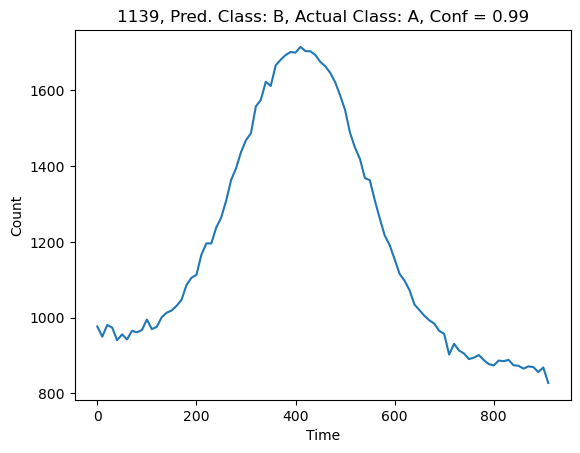

 12%|█████████████████▎                                                                                                                              | 119/990 [00:01<00:09, 88.95it/s]

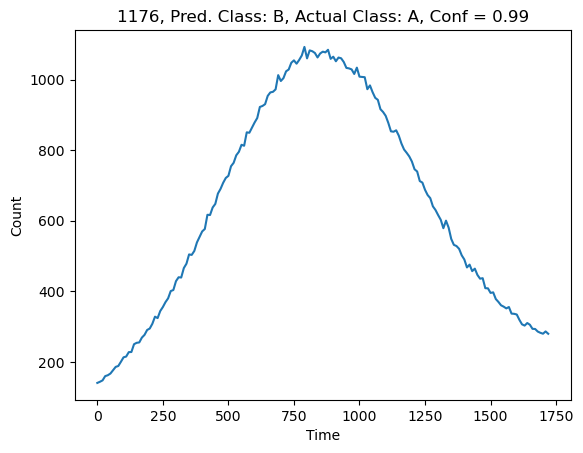

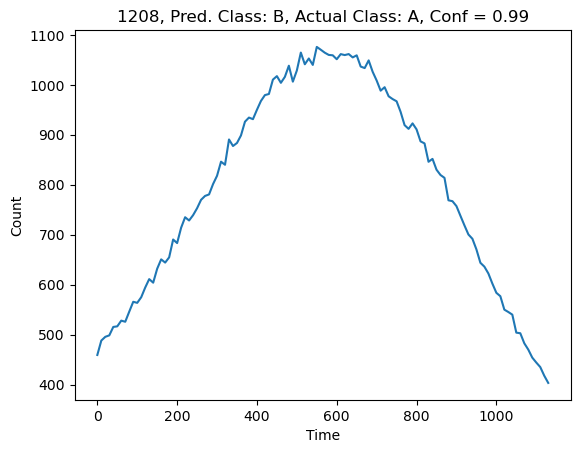

 13%|██████████████████▌                                                                                                                             | 128/990 [00:01<00:10, 78.43it/s]

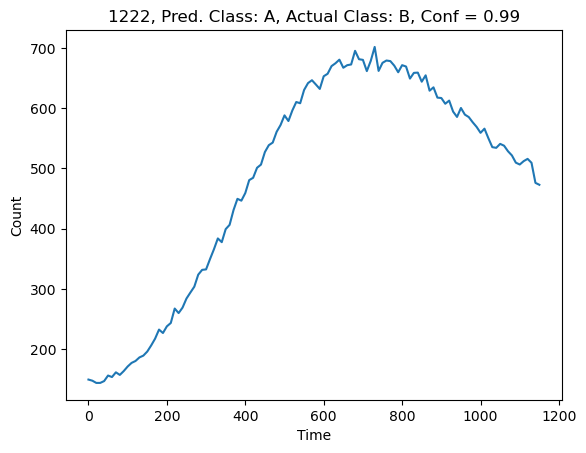

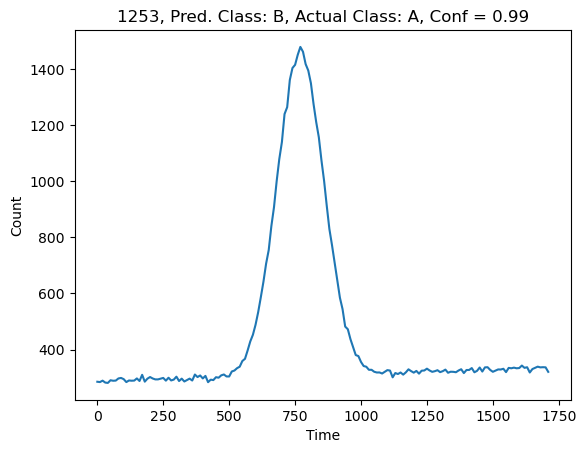

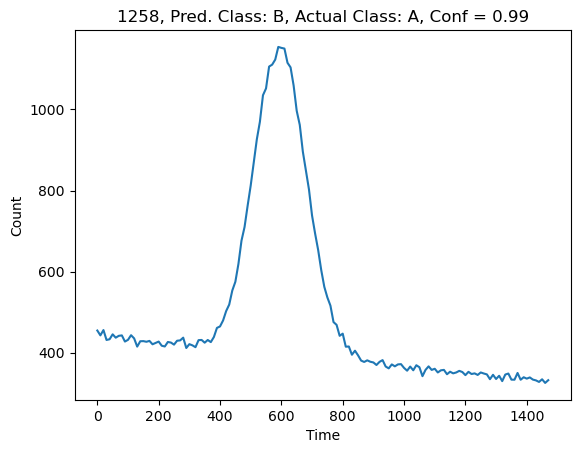

 14%|███████████████████▊                                                                                                                            | 136/990 [00:02<00:14, 60.52it/s]

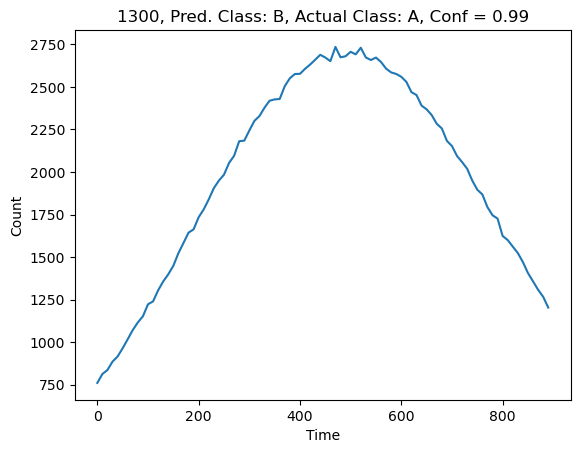

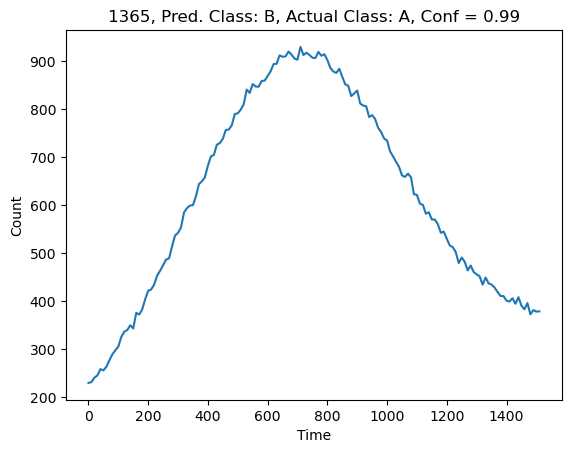

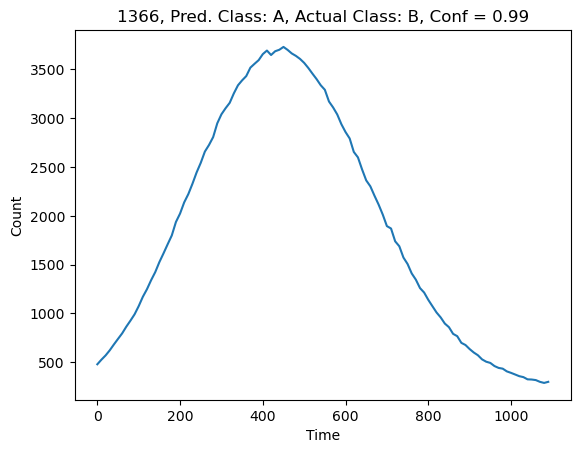

 14%|████████████████████▊                                                                                                                           | 143/990 [00:02<00:17, 48.54it/s]

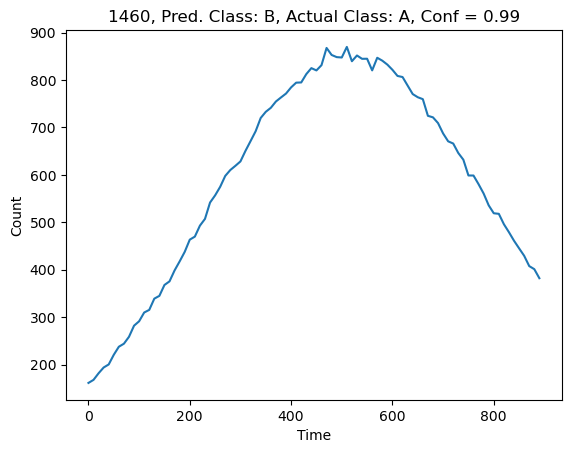

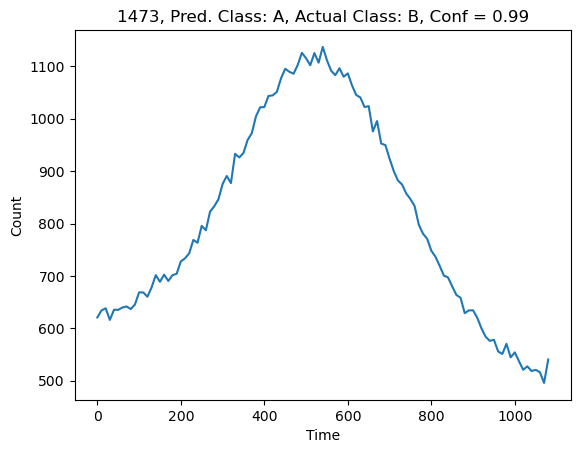

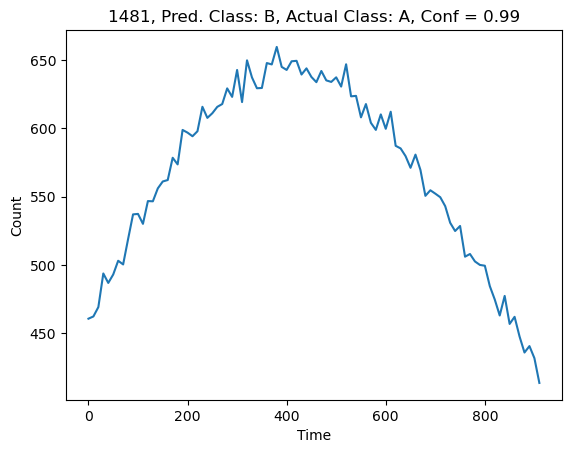

 15%|█████████████████████▋                                                                                                                          | 149/990 [00:02<00:20, 40.56it/s]

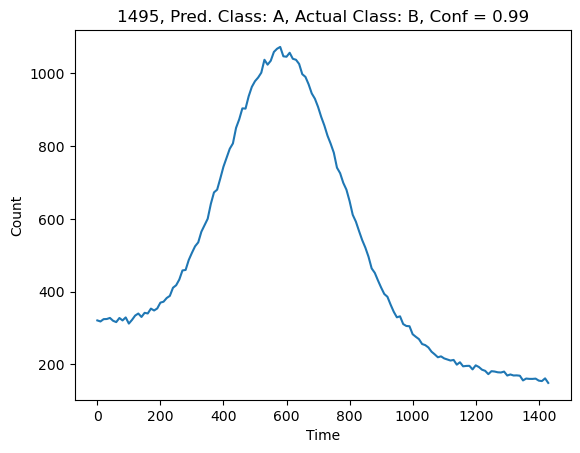

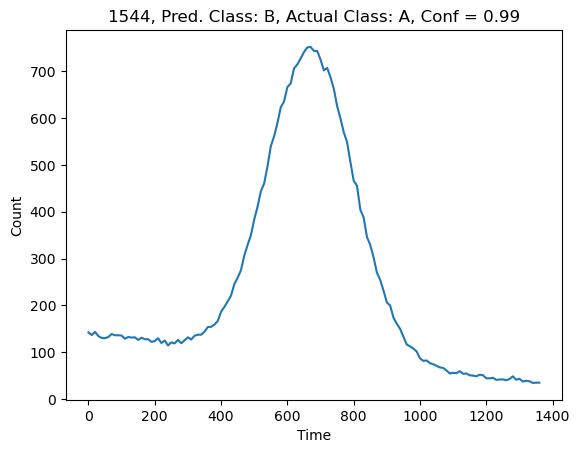

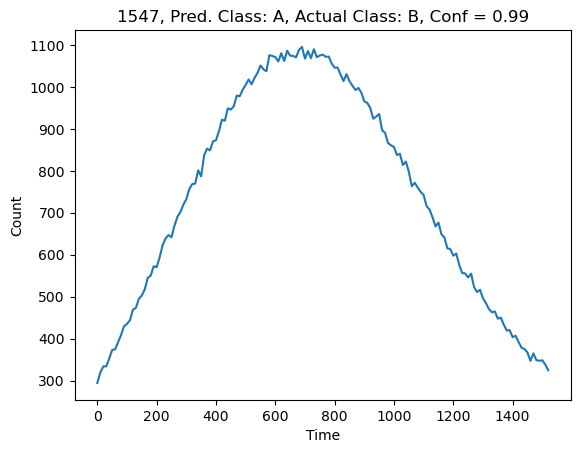

 16%|██████████████████████▍                                                                                                                         | 154/990 [00:02<00:24, 33.51it/s]

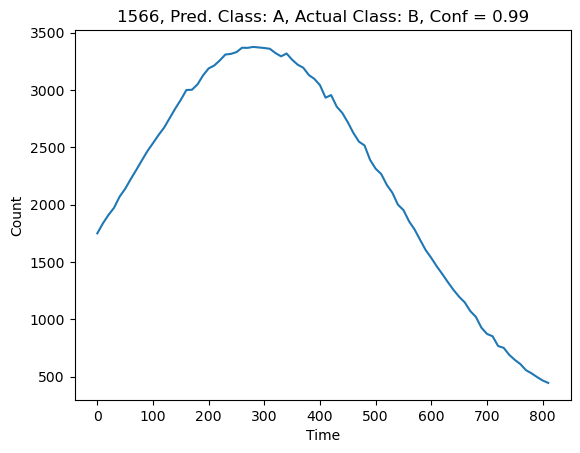

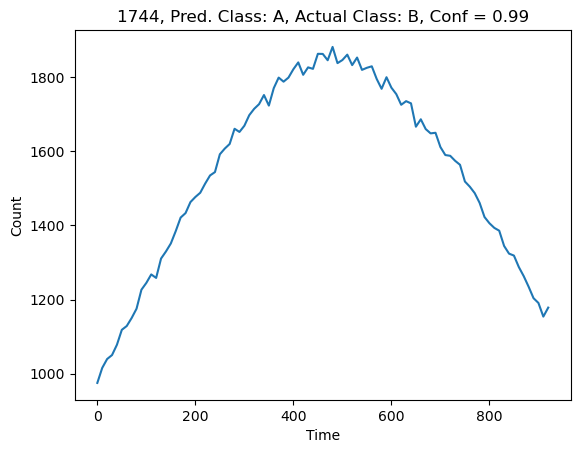

 17%|████████████████████████▋                                                                                                                       | 170/990 [00:02<00:16, 49.14it/s]

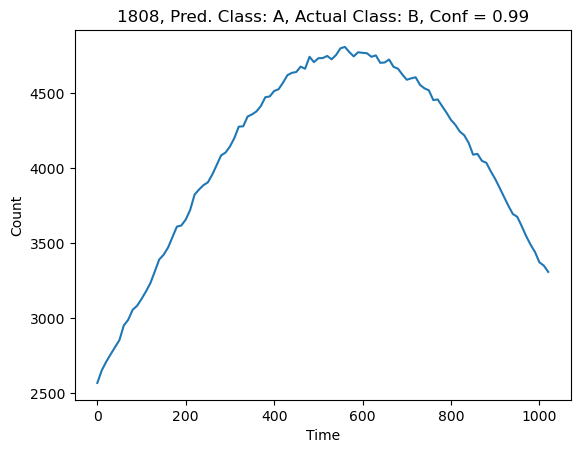

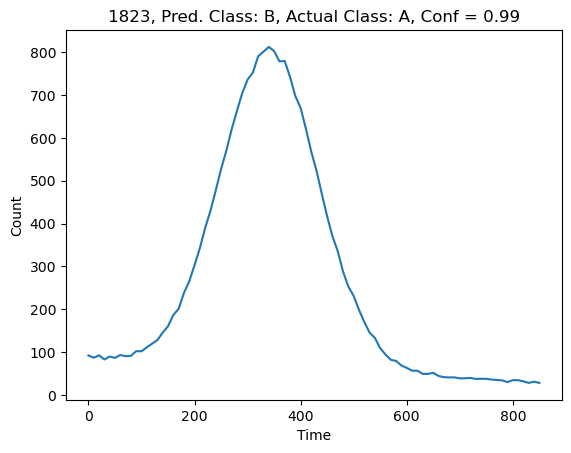

 18%|██████████████████████████▎                                                                                                                     | 181/990 [00:03<00:14, 54.50it/s]

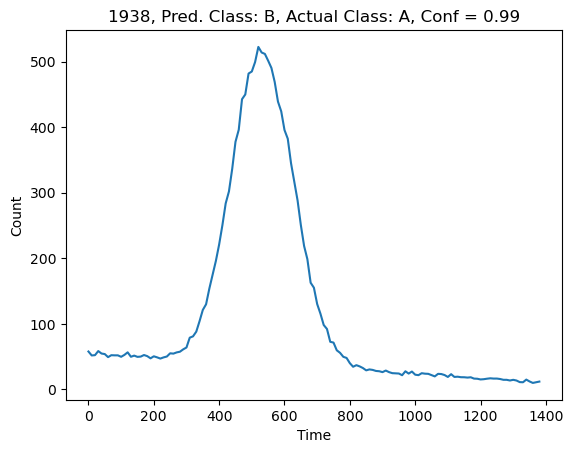

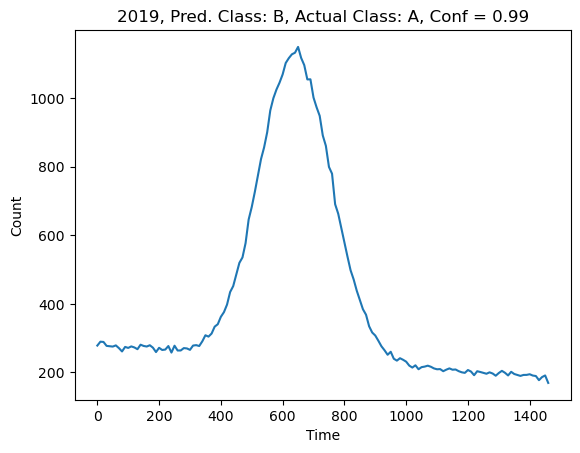

 21%|█████████████████████████████▋                                                                                                                  | 204/990 [00:03<00:10, 78.51it/s]

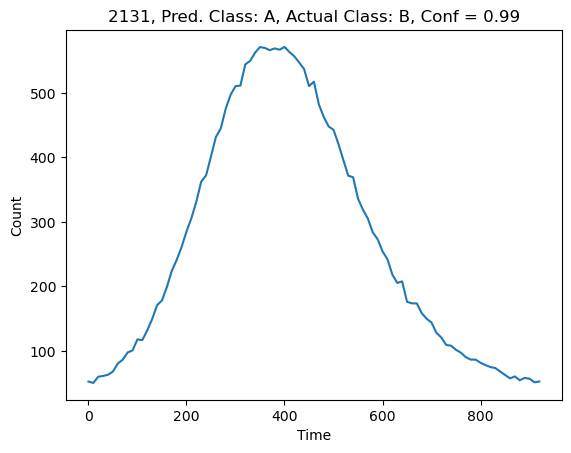

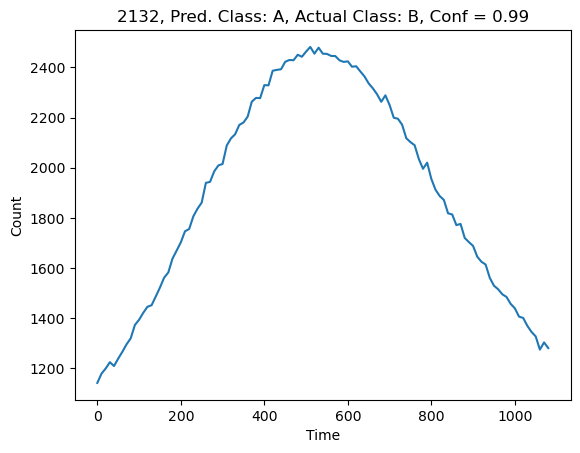

 22%|██████████████████████████████▉                                                                                                                 | 213/990 [00:03<00:10, 73.63it/s]

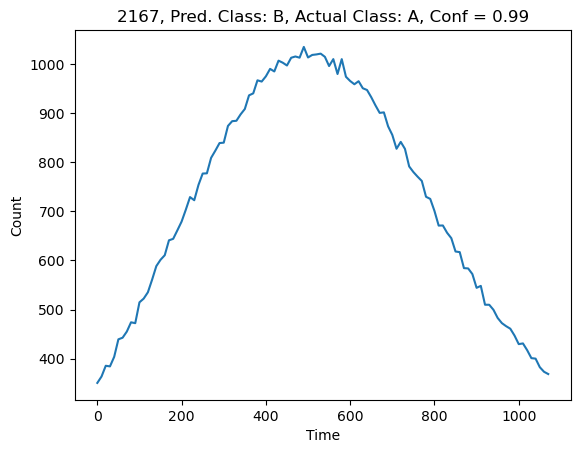

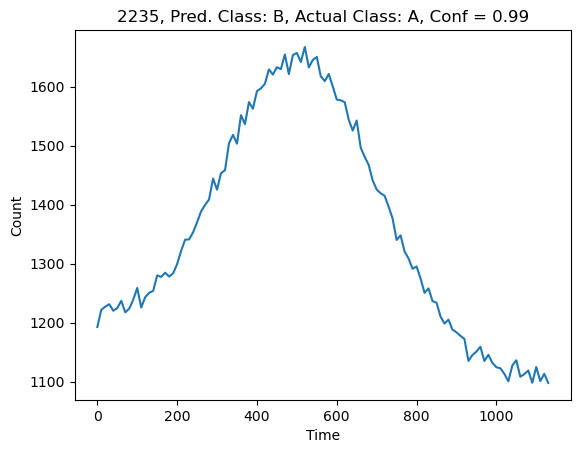

 23%|████████████████████████████████▊                                                                                                               | 226/990 [00:03<00:10, 75.58it/s]

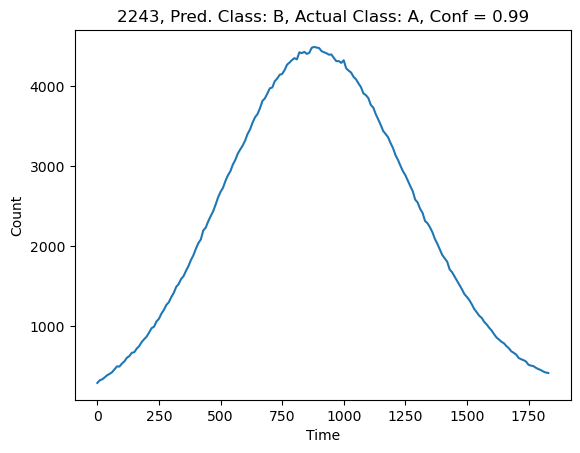

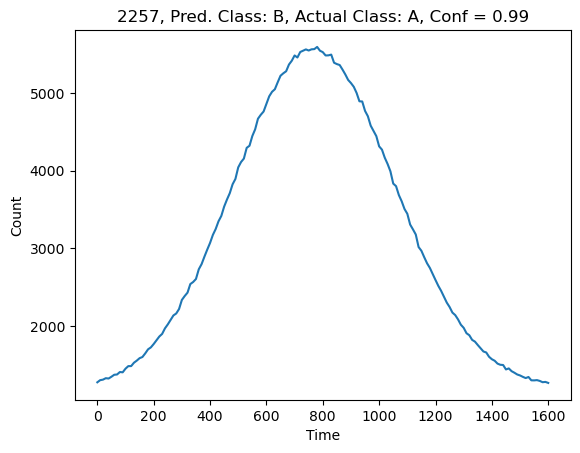

 24%|██████████████████████████████████                                                                                                              | 234/990 [00:03<00:10, 69.04it/s]

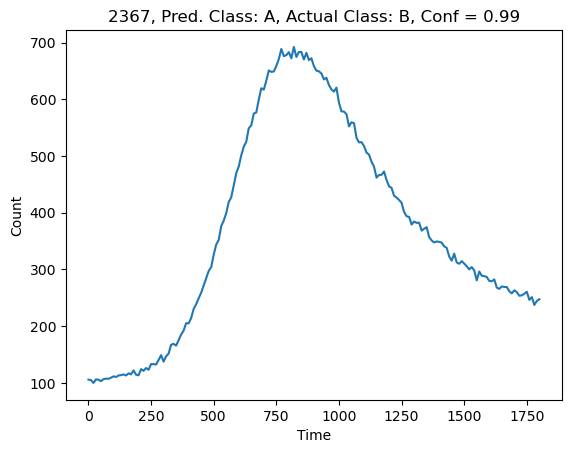

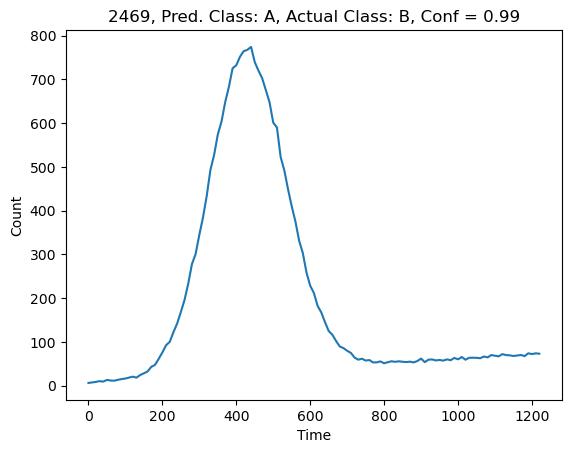

 25%|███████████████████████████████████▎                                                                                                            | 243/990 [00:03<00:11, 64.32it/s]

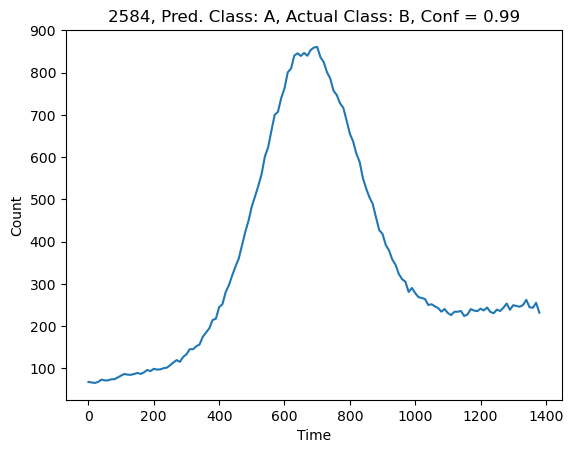

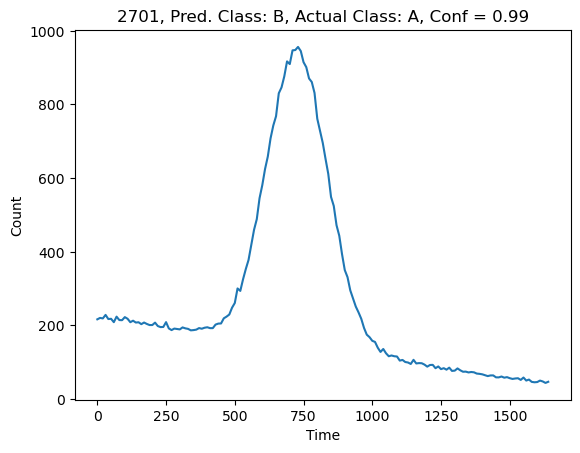

 27%|███████████████████████████████████████▏                                                                                                        | 269/990 [00:04<00:07, 92.20it/s]

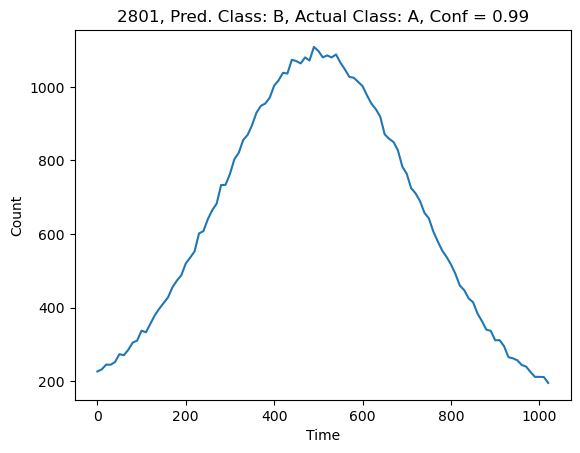

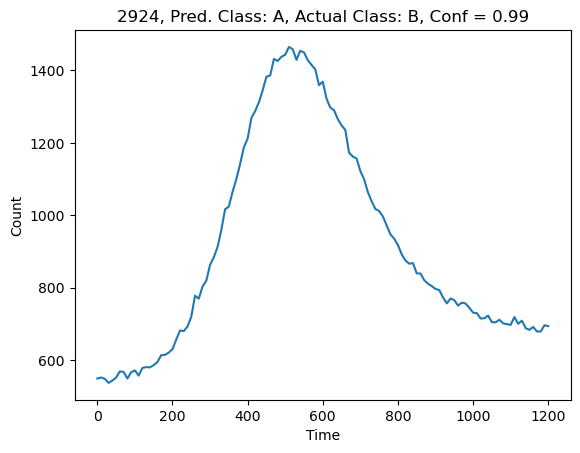

 29%|█████████████████████████████████████████▌                                                                                                      | 286/990 [00:04<00:07, 98.53it/s]

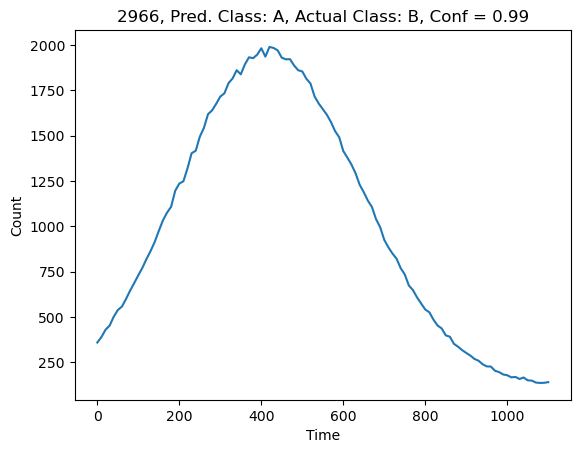

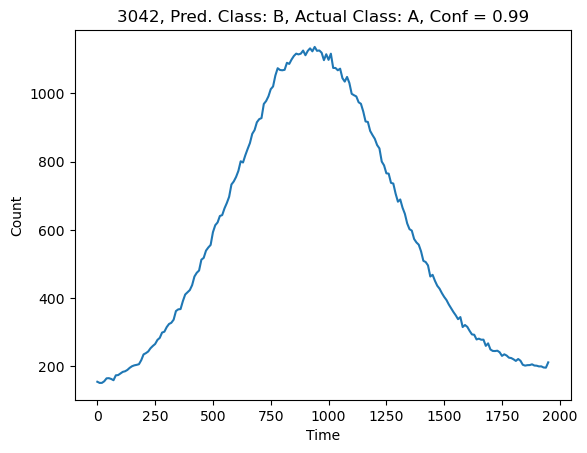

 30%|███████████████████████████████████████████▏                                                                                                    | 297/990 [00:04<00:07, 89.56it/s]

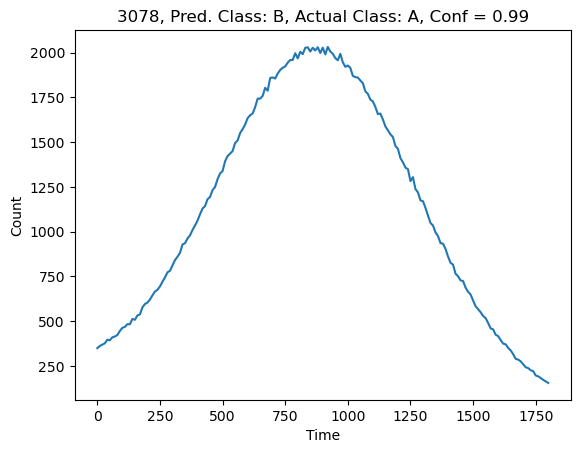

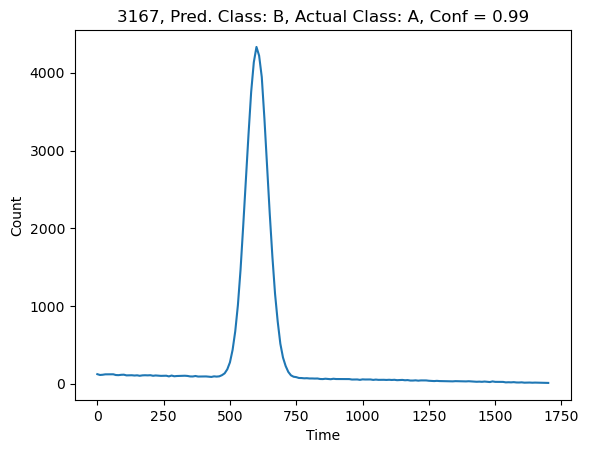

 31%|█████████████████████████████████████████████▏                                                                                                  | 311/990 [00:04<00:07, 88.34it/s]

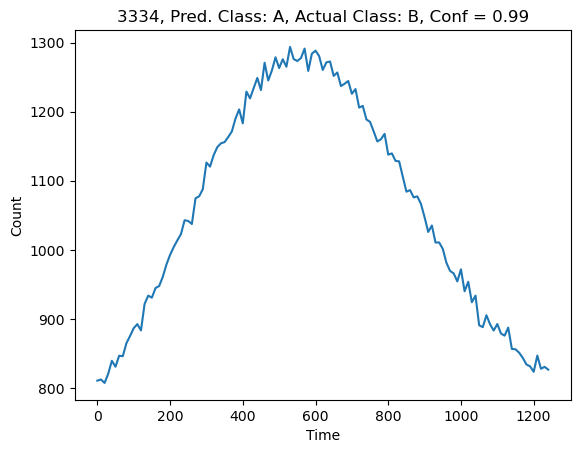

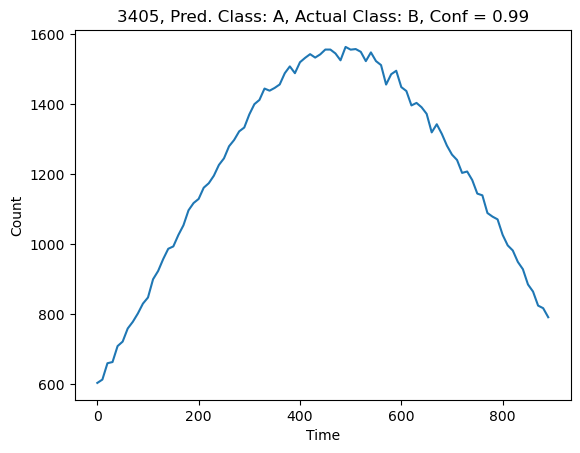

 34%|████████████████████████████████████████████████▋                                                                                              | 337/990 [00:04<00:05, 111.87it/s]

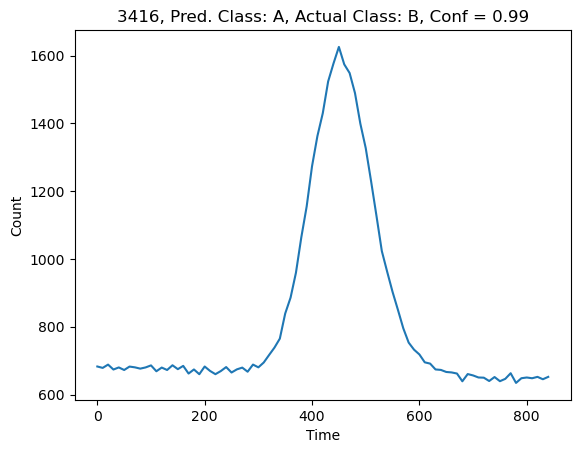

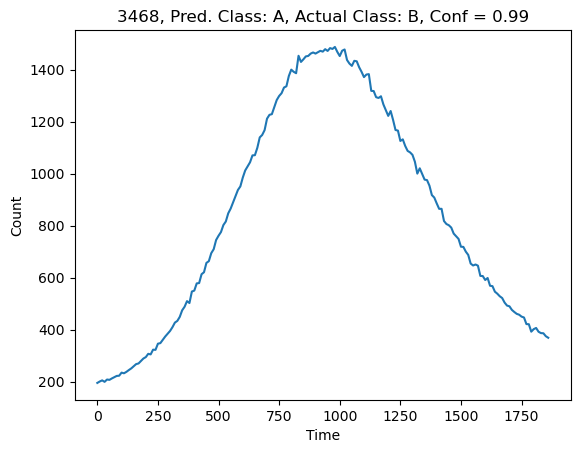

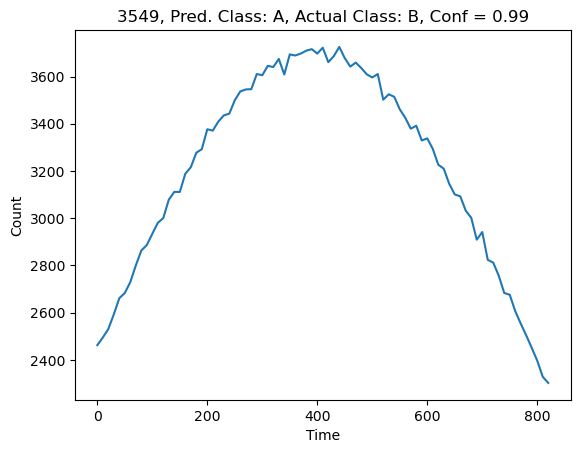

 35%|██████████████████████████████████████████████████▊                                                                                             | 349/990 [00:04<00:07, 87.07it/s]

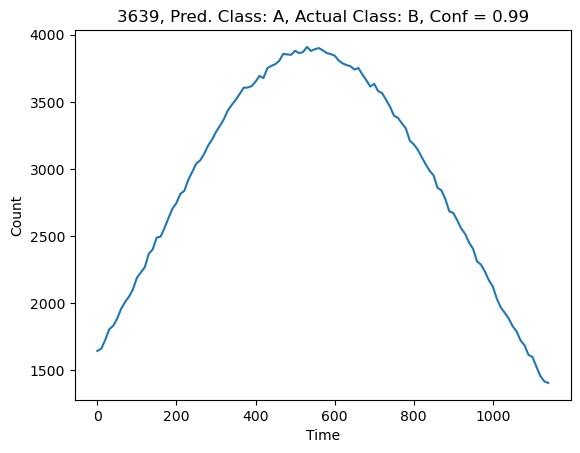

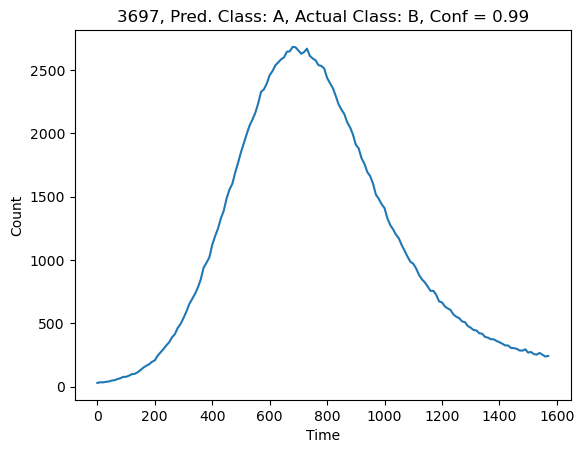

 37%|█████████████████████████████████████████████████████▍                                                                                          | 367/990 [00:05<00:06, 94.39it/s]

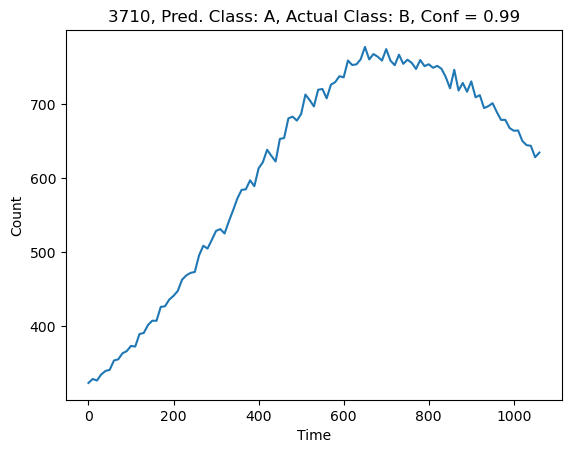

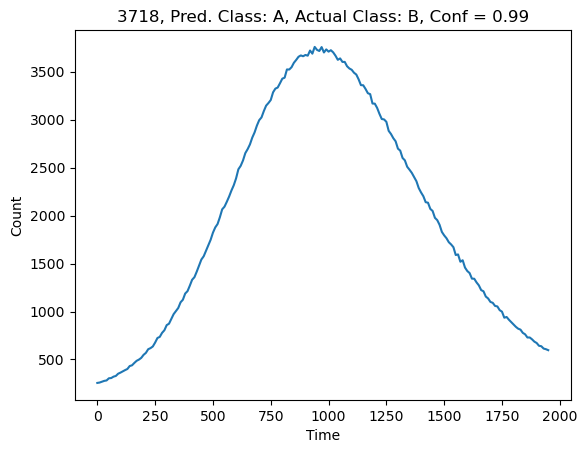

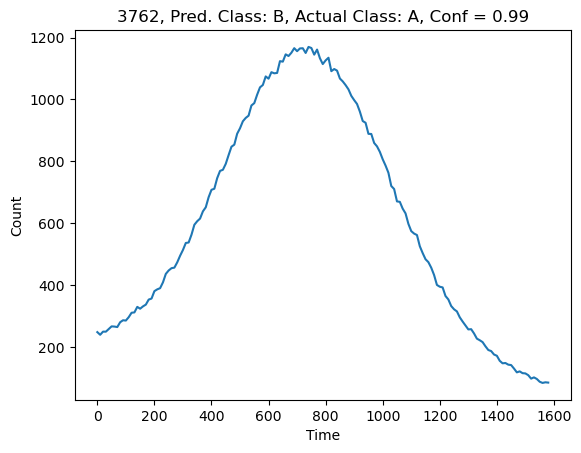

 38%|██████████████████████████████████████████████████████▉                                                                                         | 378/990 [00:05<00:07, 76.96it/s]

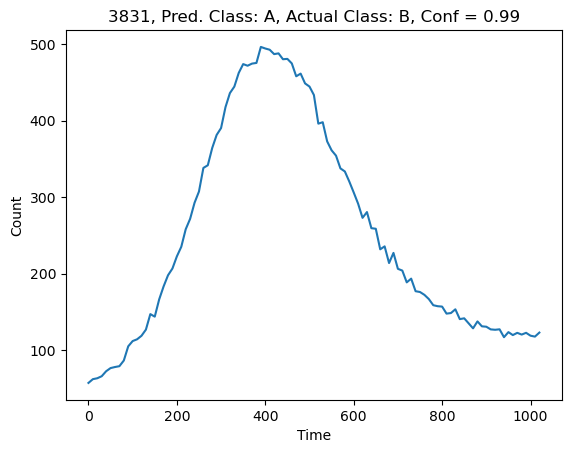

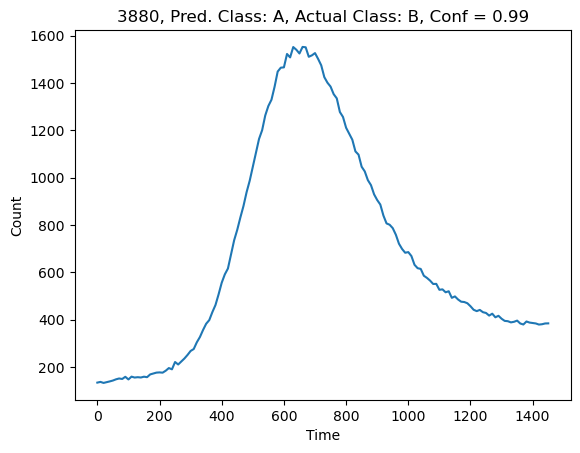

 39%|████████████████████████████████████████████████████████▎                                                                                       | 387/990 [00:05<00:08, 71.67it/s]

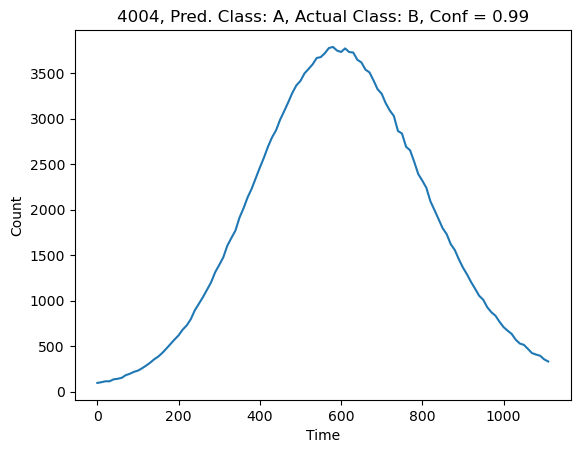

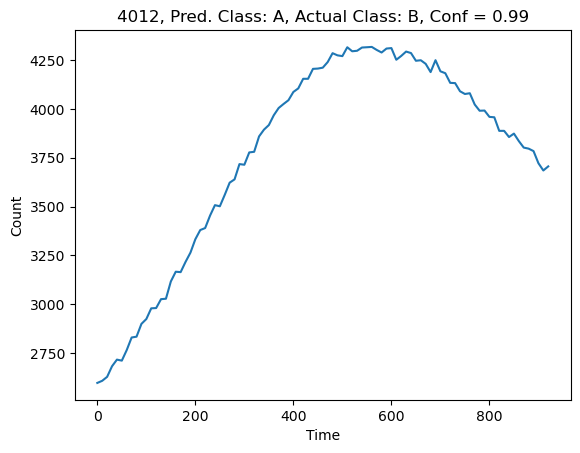

 40%|█████████████████████████████████████████████████████████▍                                                                                      | 395/990 [00:05<00:09, 66.00it/s]

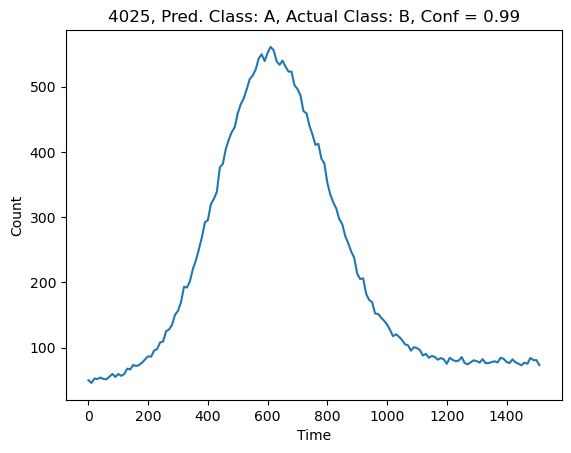

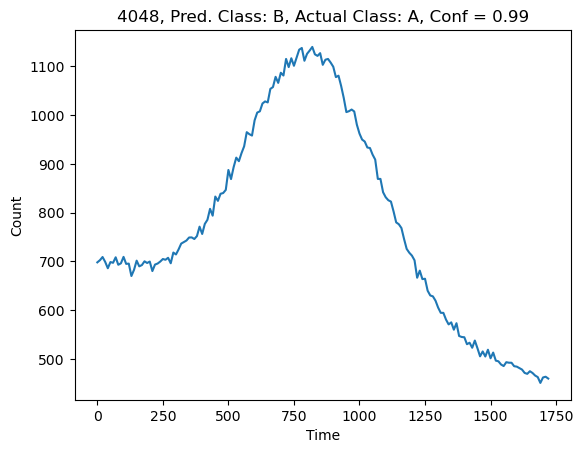

 41%|██████████████████████████████████████████████████████████▍                                                                                     | 402/990 [00:05<00:09, 59.98it/s]

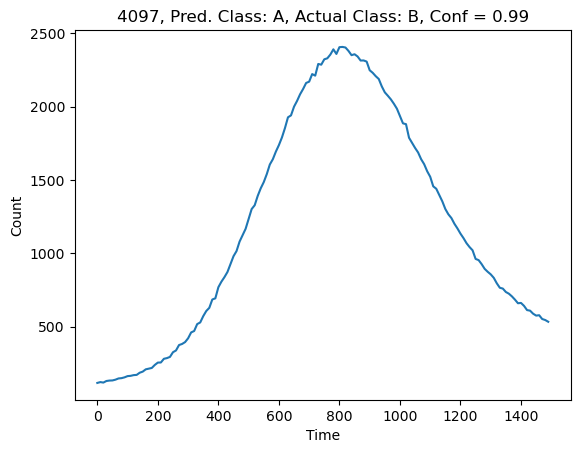

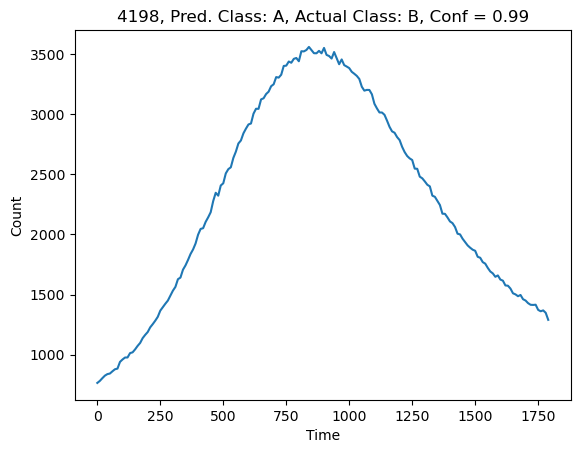

 42%|███████████████████████████████████████████████████████████▊                                                                                    | 411/990 [00:05<00:09, 59.17it/s]

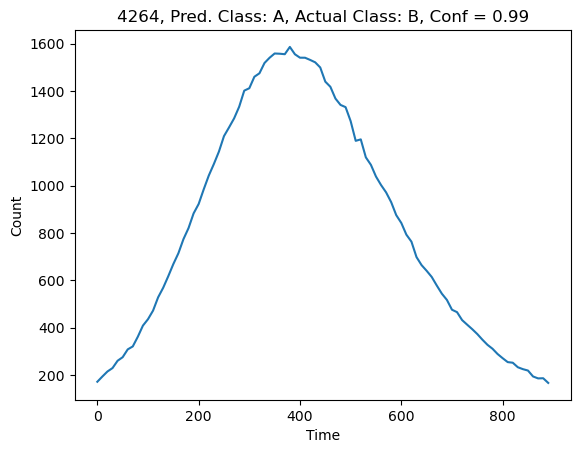

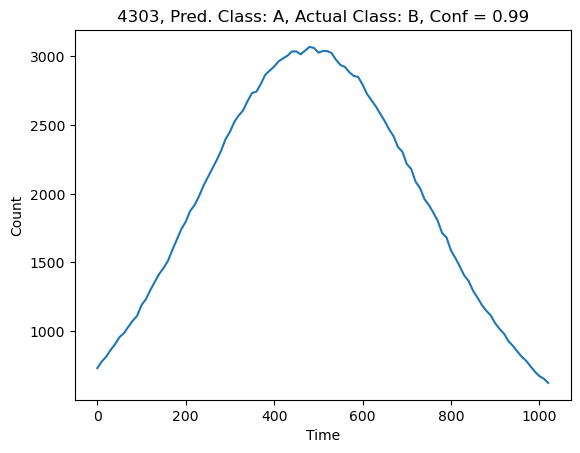

 42%|████████████████████████████████████████████████████████████▉                                                                                   | 419/990 [00:06<00:09, 57.28it/s]

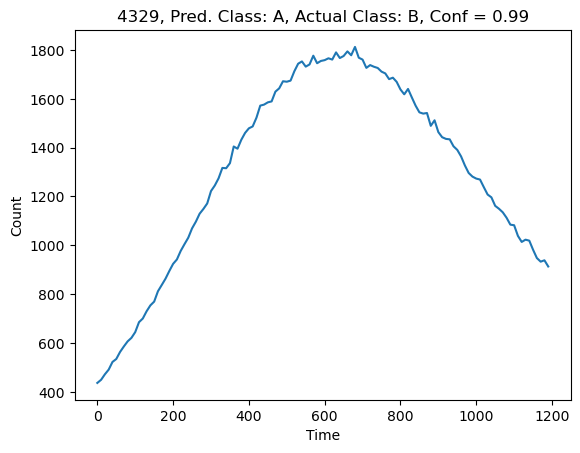

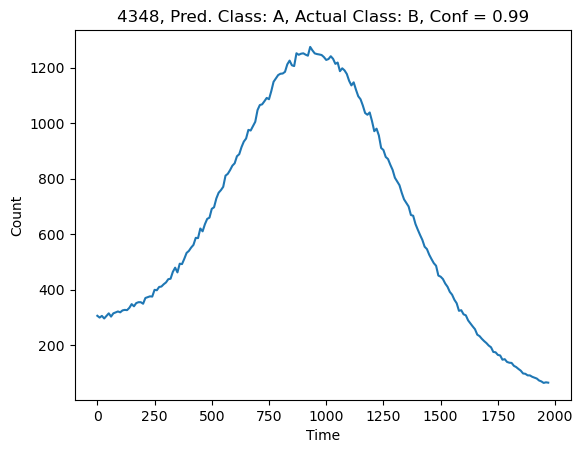

 43%|█████████████████████████████████████████████████████████████▊                                                                                  | 425/990 [00:06<00:11, 50.51it/s]

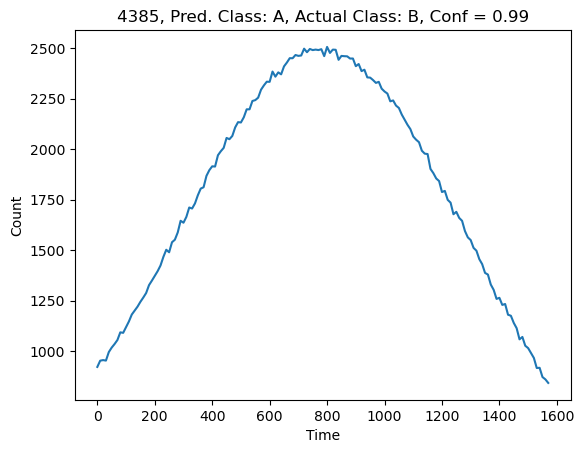

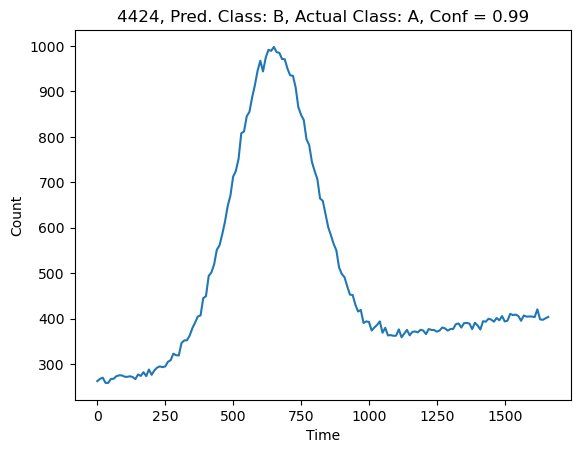

 44%|██████████████████████████████████████████████████████████████▊                                                                                 | 432/990 [00:06<00:11, 47.67it/s]

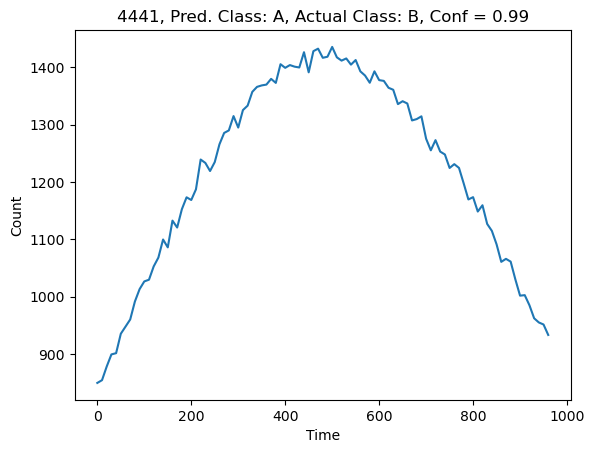

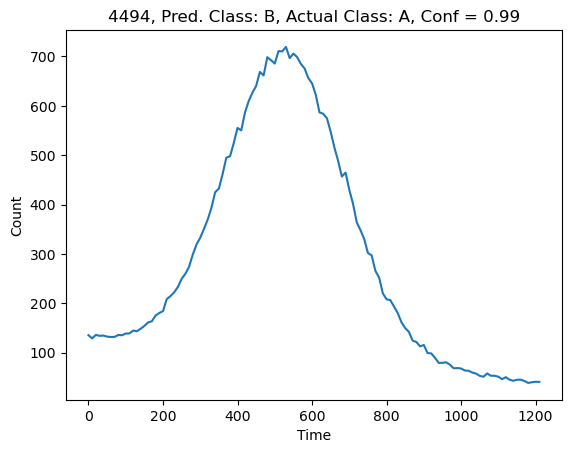

 45%|████████████████████████████████████████████████████████████████▏                                                                               | 441/990 [00:06<00:10, 50.38it/s]

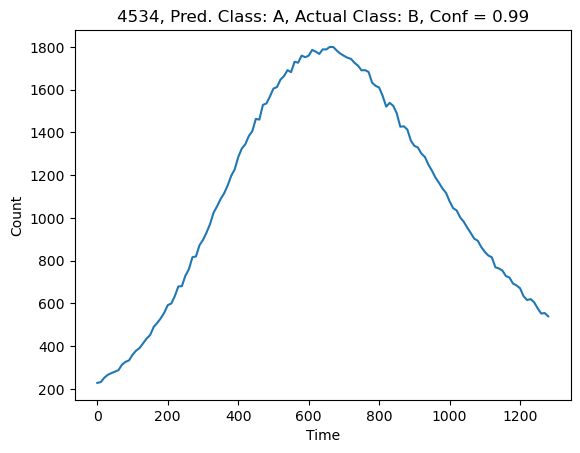

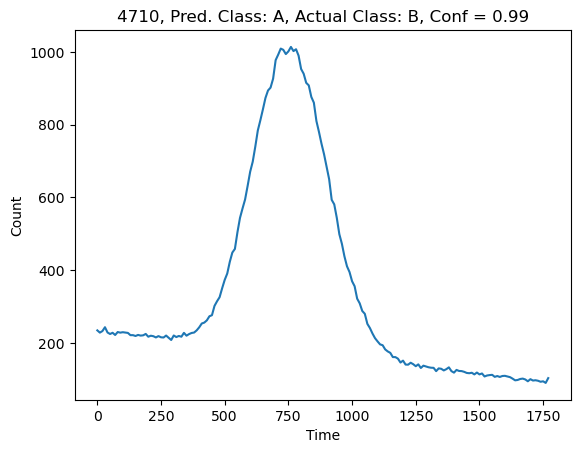

 46%|██████████████████████████████████████████████████████████████████▉                                                                             | 460/990 [00:06<00:07, 70.02it/s]

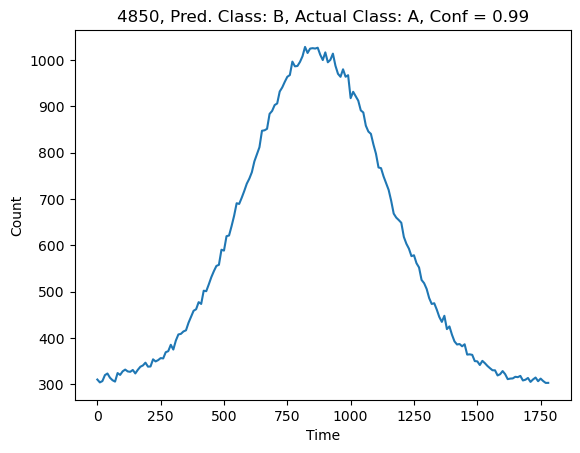

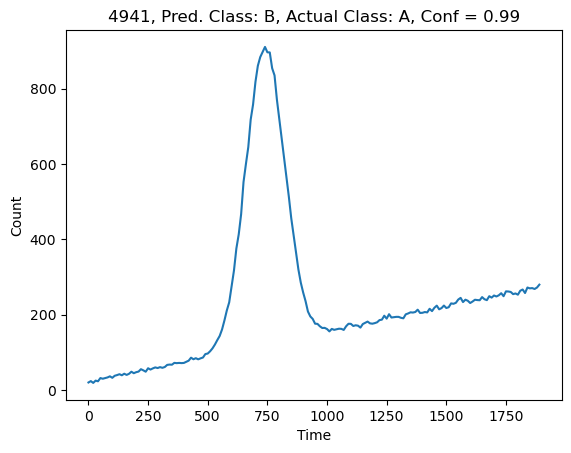

 48%|█████████████████████████████████████████████████████████████████████▋                                                                          | 479/990 [00:06<00:06, 84.20it/s]

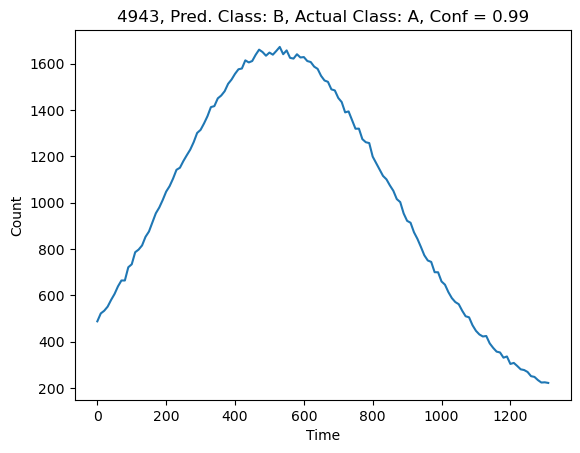

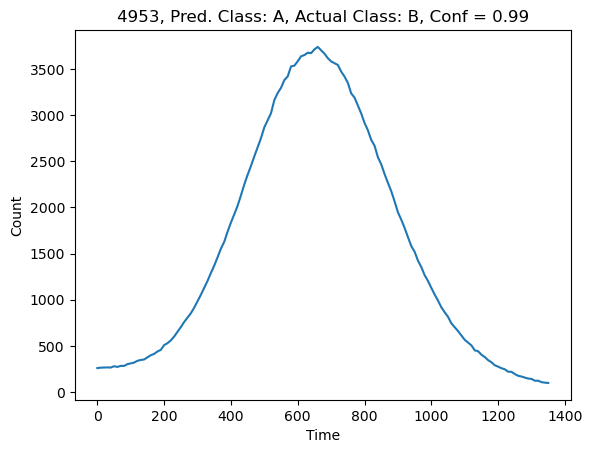

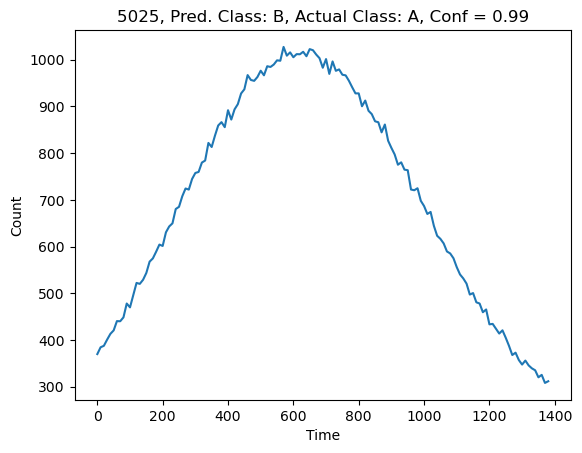

 49%|██████████████████████████████████████████████████████████████████████▉                                                                         | 488/990 [00:07<00:07, 64.74it/s]

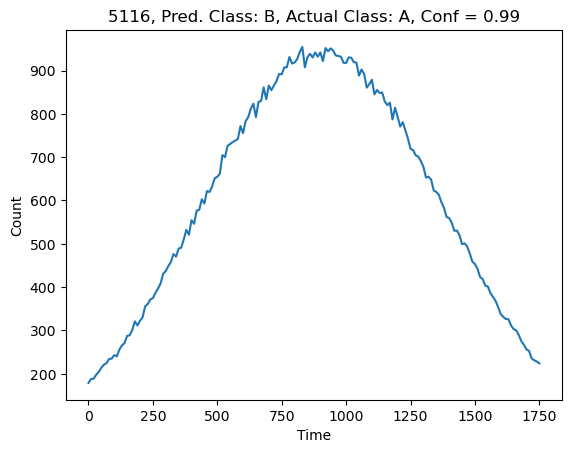

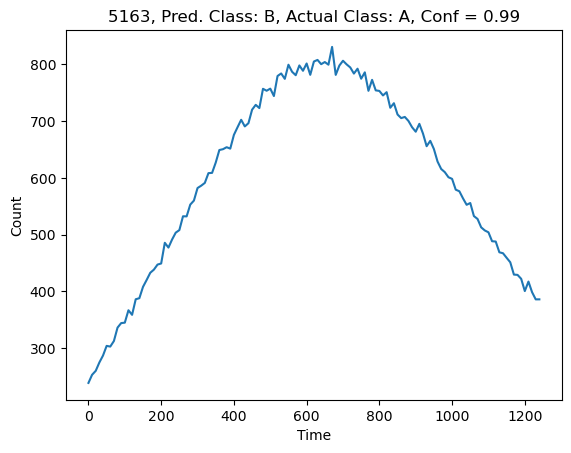

 50%|████████████████████████████████████████████████████████████████████████                                                                        | 495/990 [00:07<00:08, 58.67it/s]

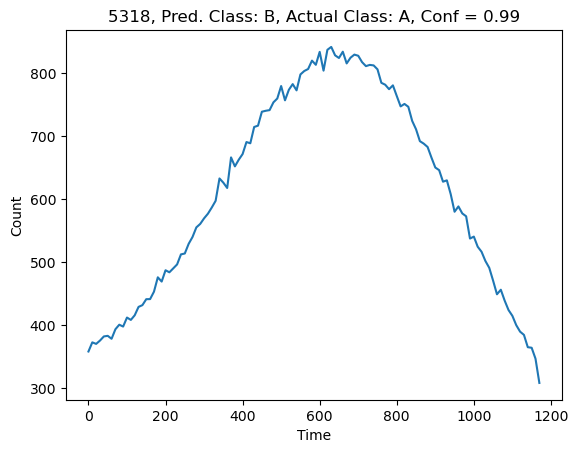

 51%|█████████████████████████████████████████████████████████████████████████▌                                                                      | 506/990 [00:07<00:09, 51.92it/s]

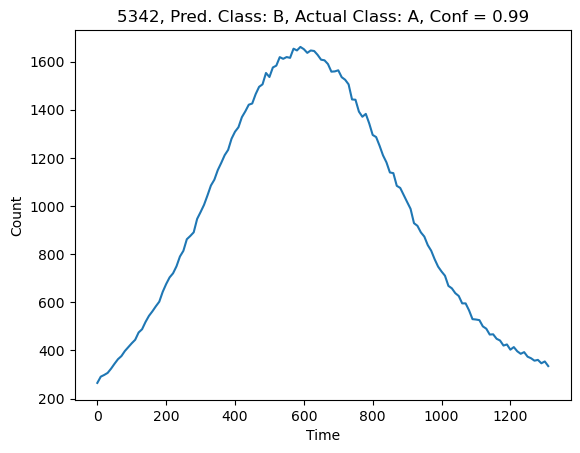

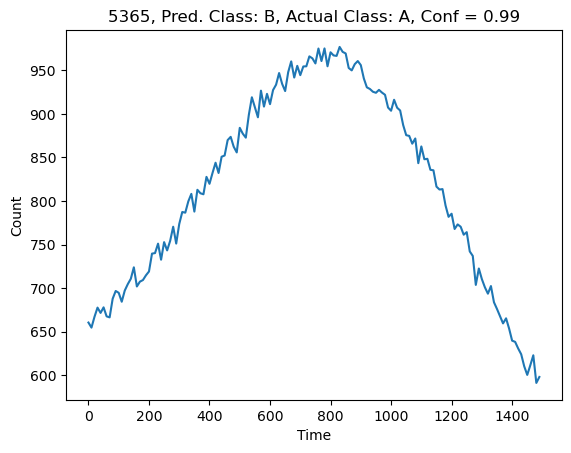

 52%|██████████████████████████████████████████████████████████████████████████▊                                                                     | 514/990 [00:07<00:09, 50.90it/s]

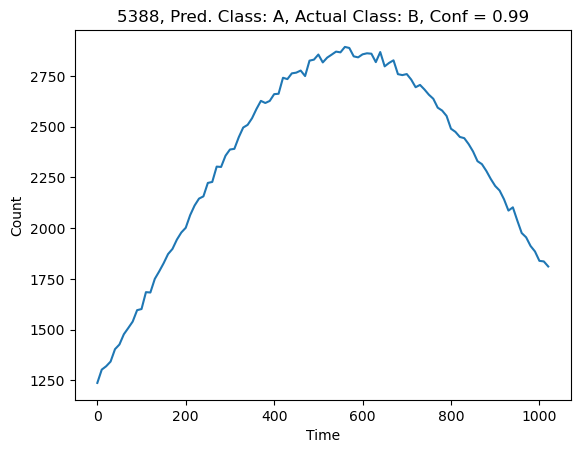

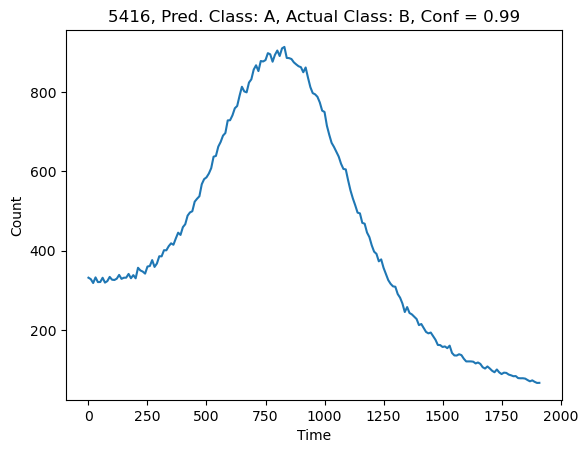

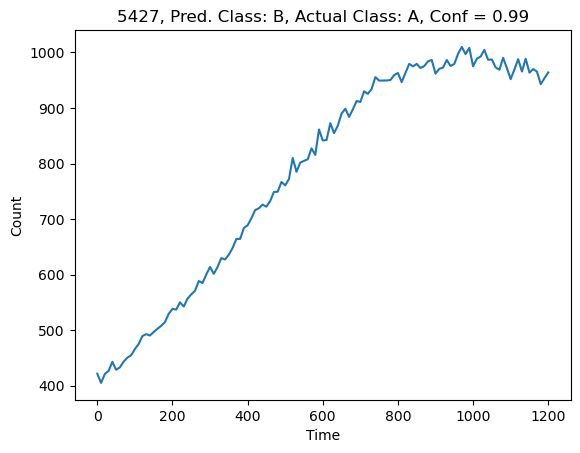

 53%|███████████████████████████████████████████████████████████████████████████▋                                                                    | 520/990 [00:08<00:11, 41.62it/s]

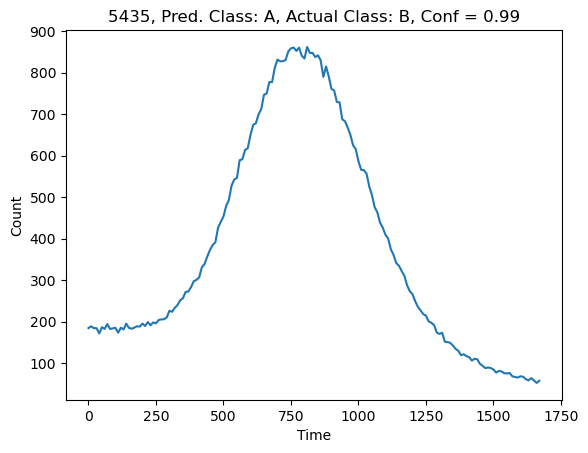

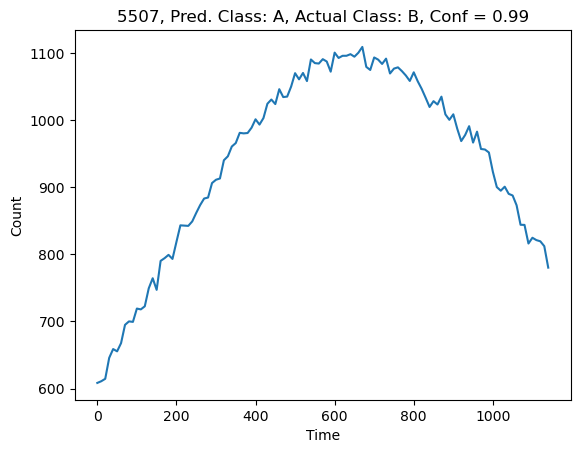

 53%|████████████████████████████████████████████████████████████████████████████▌                                                                   | 526/990 [00:08<00:11, 40.30it/s]

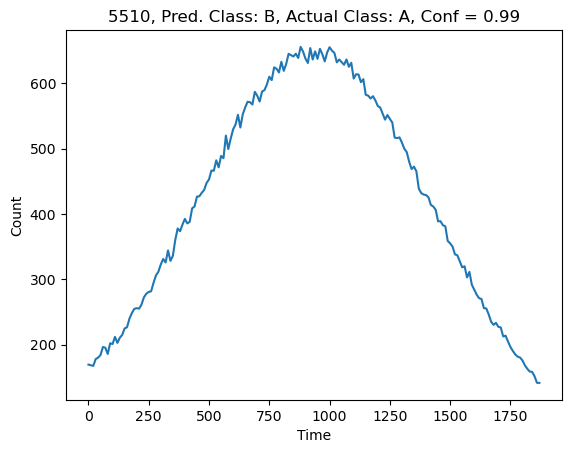

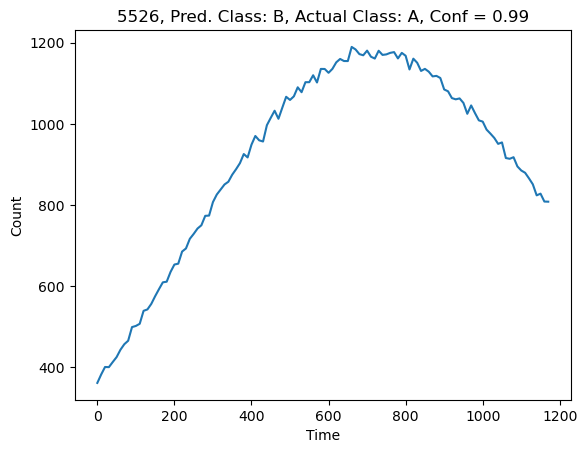

 54%|█████████████████████████████████████████████████████████████████████████████▏                                                                  | 531/990 [00:08<00:11, 38.33it/s]

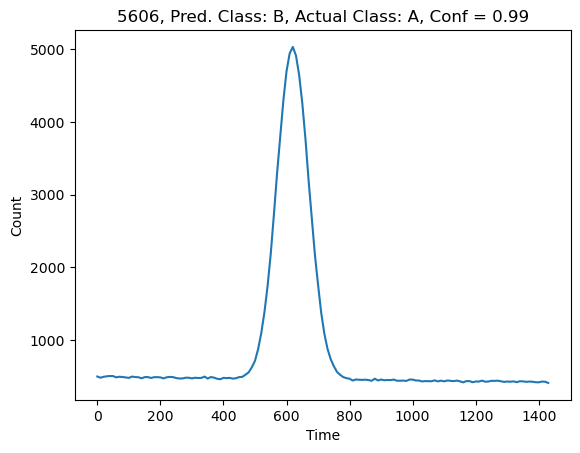

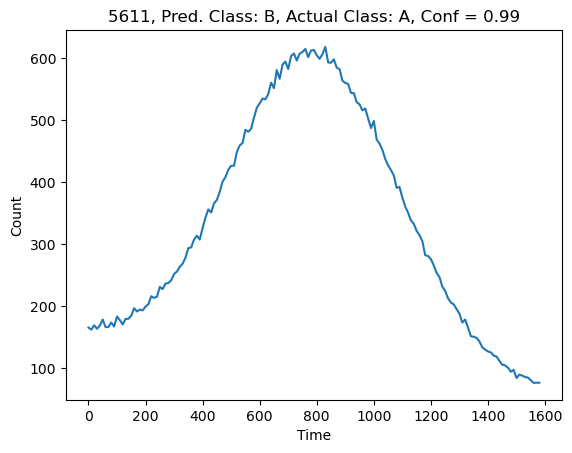

 54%|█████████████████████████████████████████████████████████████████████████████▉                                                                  | 536/990 [00:08<00:12, 36.42it/s]

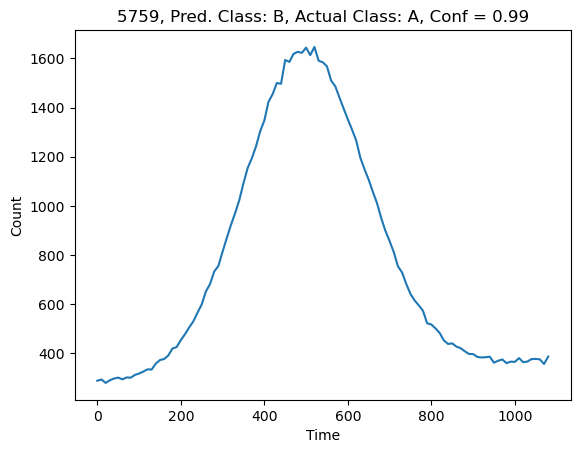

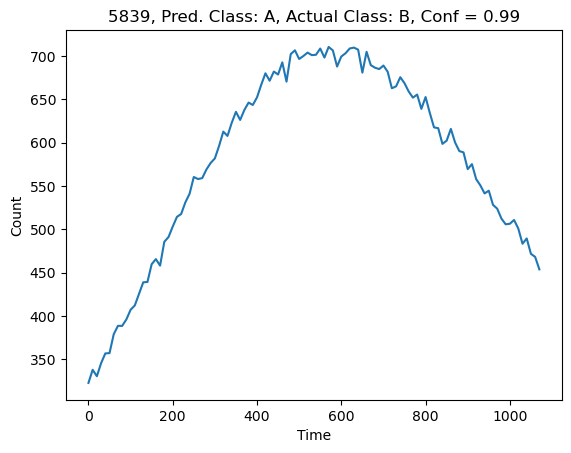

 56%|████████████████████████████████████████████████████████████████████████████████▌                                                               | 554/990 [00:08<00:07, 57.51it/s]

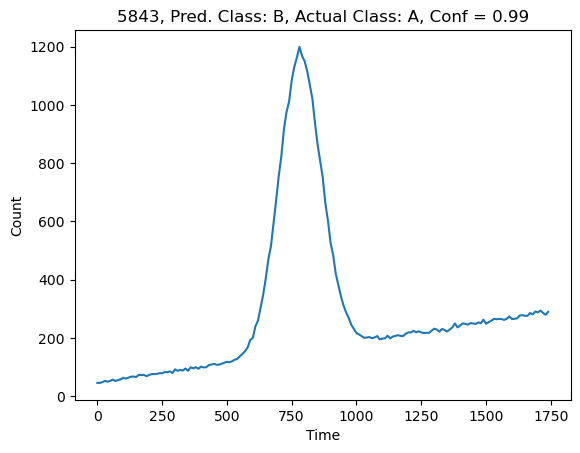

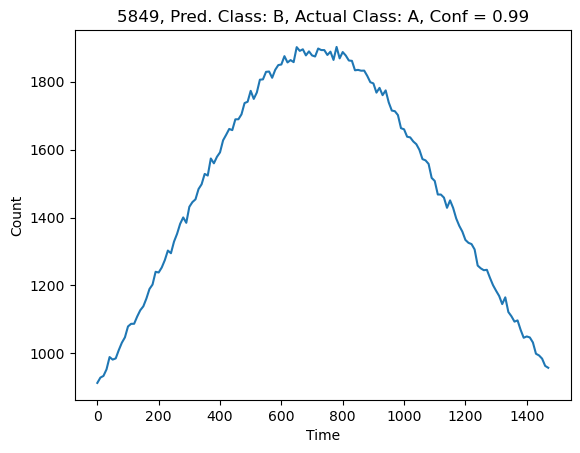

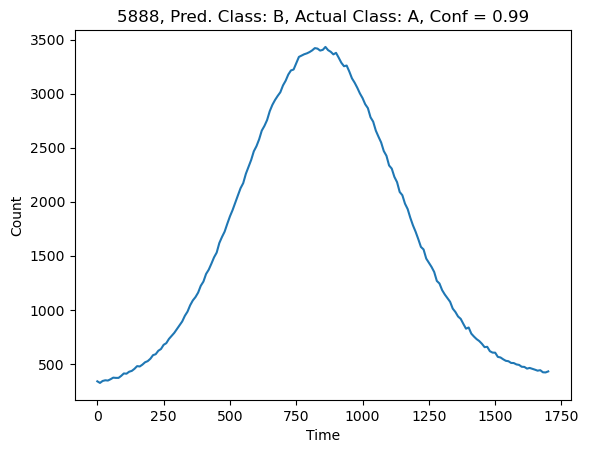

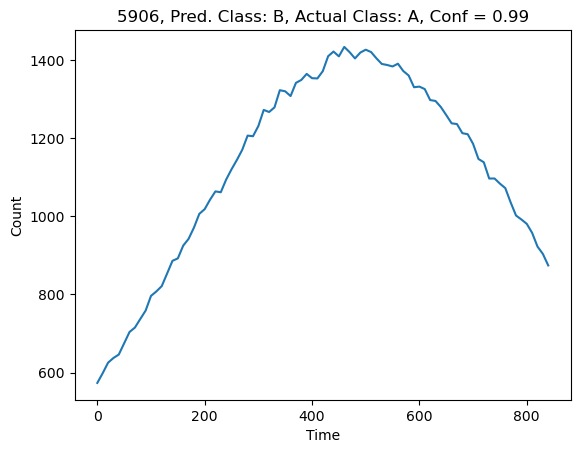

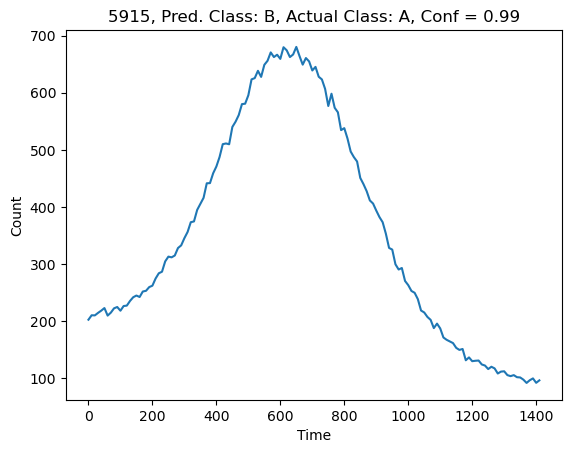

 57%|█████████████████████████████████████████████████████████████████████████████████▍                                                              | 560/990 [00:09<00:11, 36.62it/s]

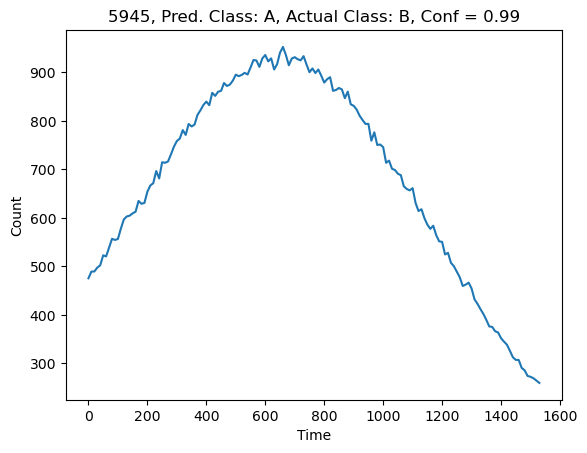

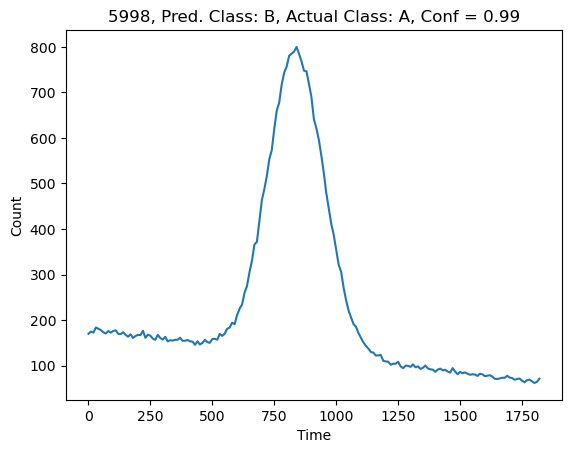

 58%|███████████████████████████████████████████████████████████████████████████████████                                                             | 571/990 [00:09<00:09, 43.38it/s]

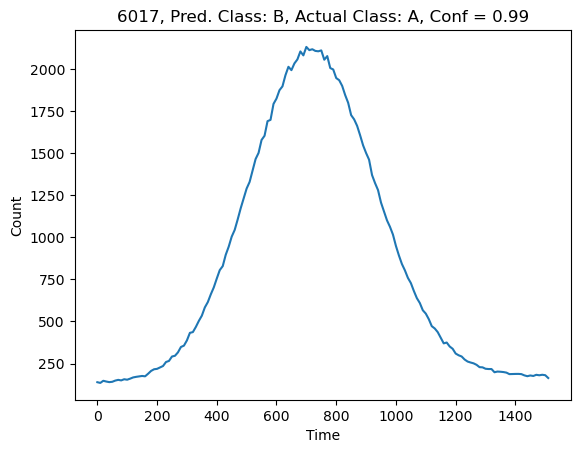

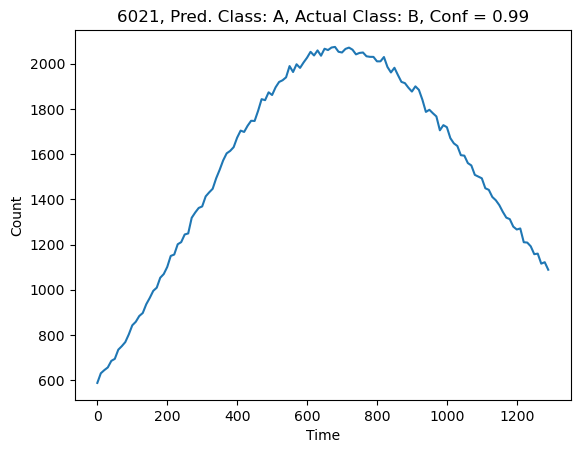

 58%|███████████████████████████████████████████████████████████████████████████████████▉                                                            | 577/990 [00:09<00:09, 41.54it/s]

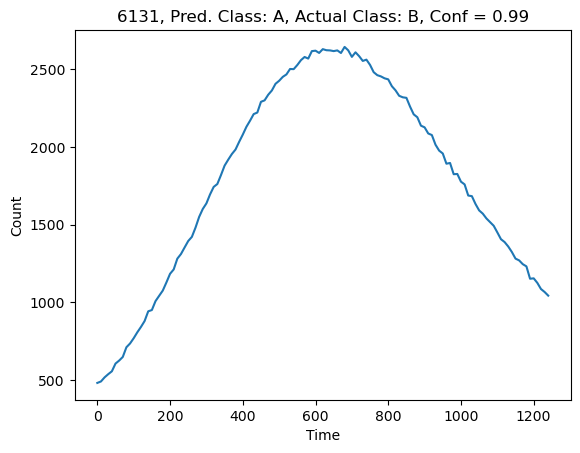

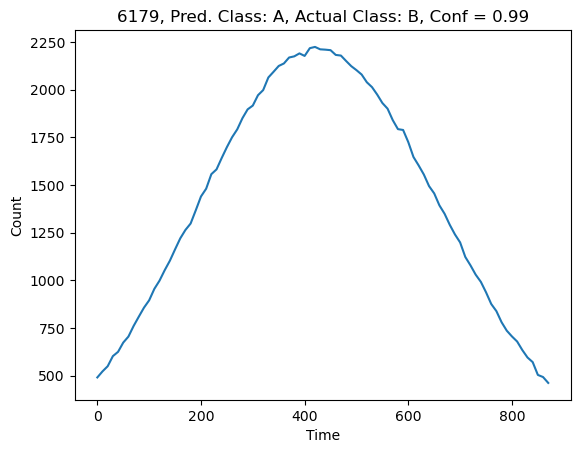

 59%|█████████████████████████████████████████████████████████████████████████████████████                                                           | 585/990 [00:09<00:09, 44.15it/s]

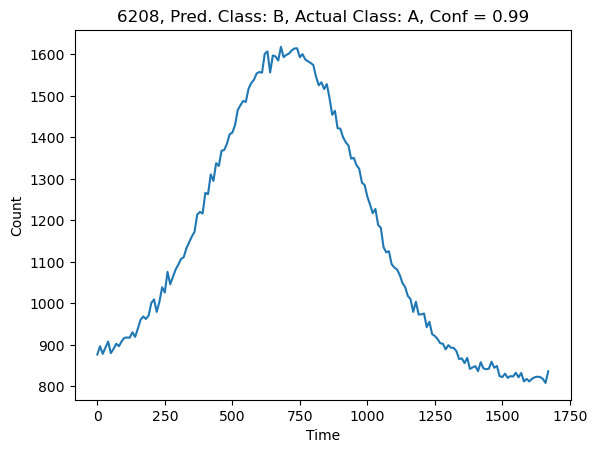

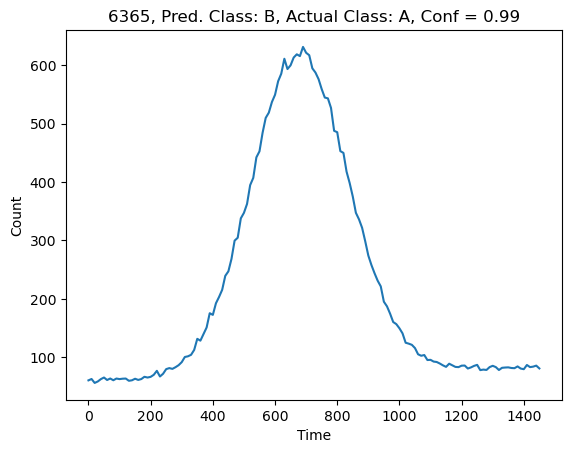

 61%|████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 607/990 [00:09<00:05, 68.06it/s]

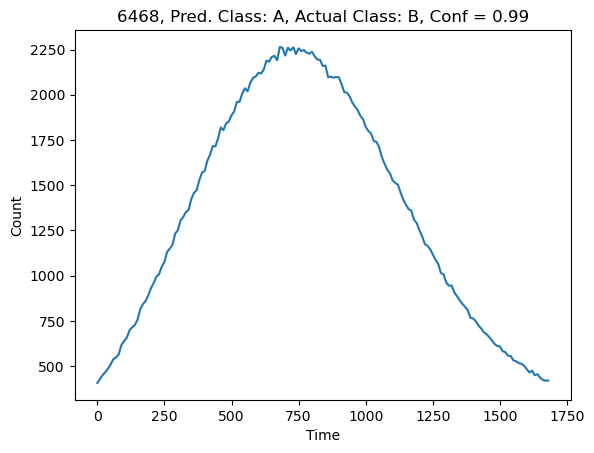

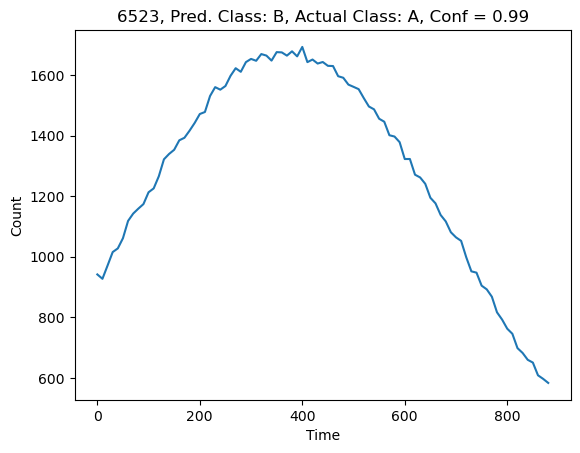

 63%|██████████████████████████████████████████████████████████████████████████████████████████▉                                                     | 625/990 [00:09<00:04, 80.15it/s]

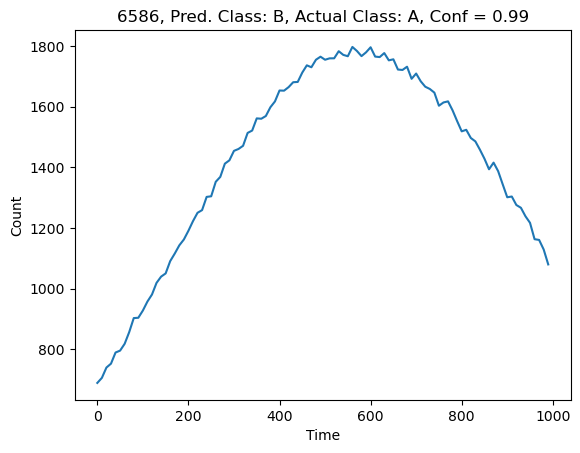

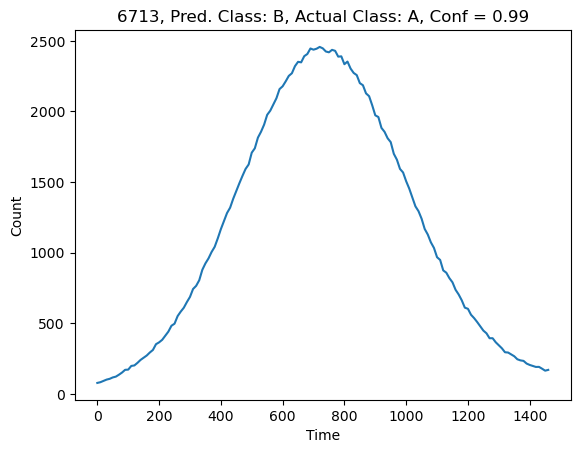

 65%|█████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 646/990 [00:10<00:03, 95.01it/s]

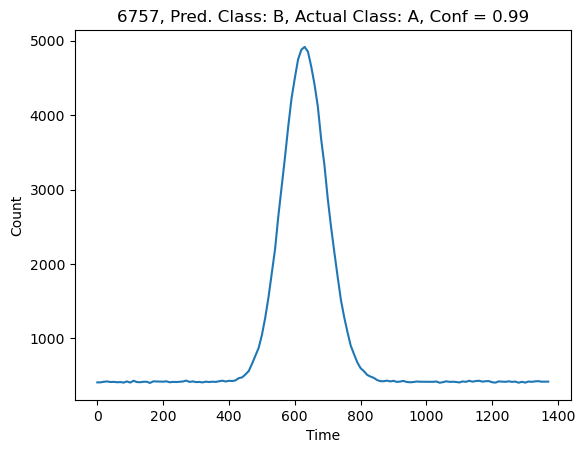

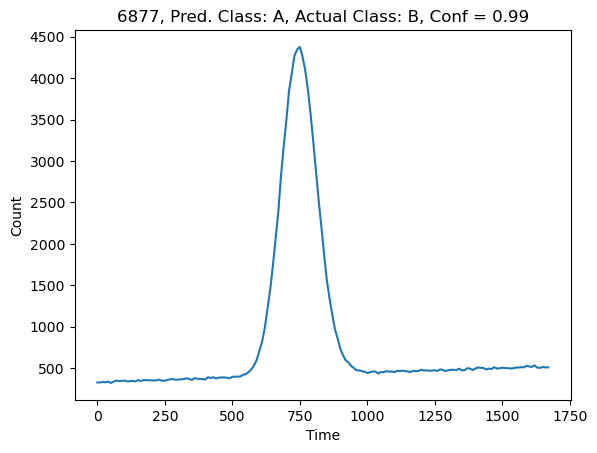

 67%|████████████████████████████████████████████████████████████████████████████████████████████████▍                                               | 663/990 [00:10<00:03, 97.19it/s]

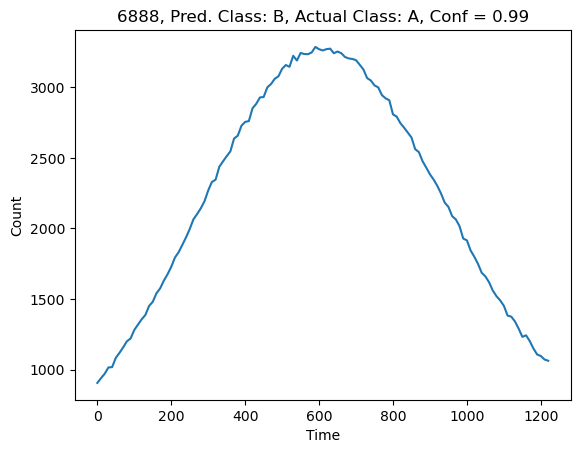

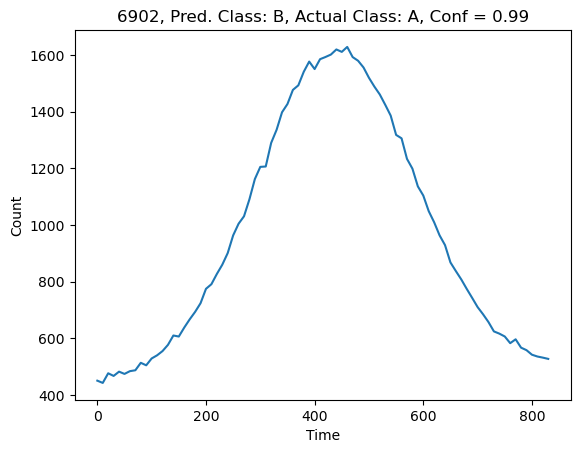

 68%|██████████████████████████████████████████████████████████████████████████████████████████████████                                              | 674/990 [00:10<00:03, 90.68it/s]

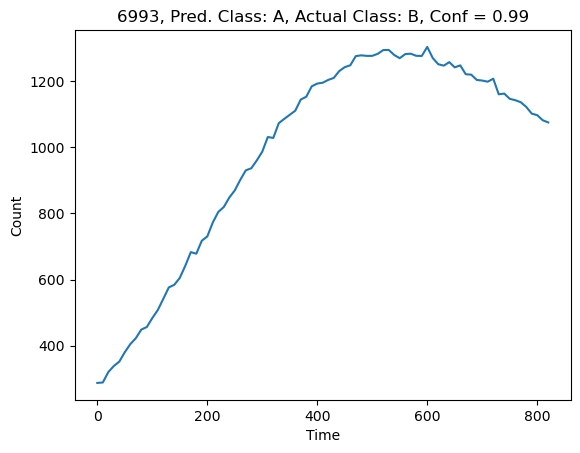

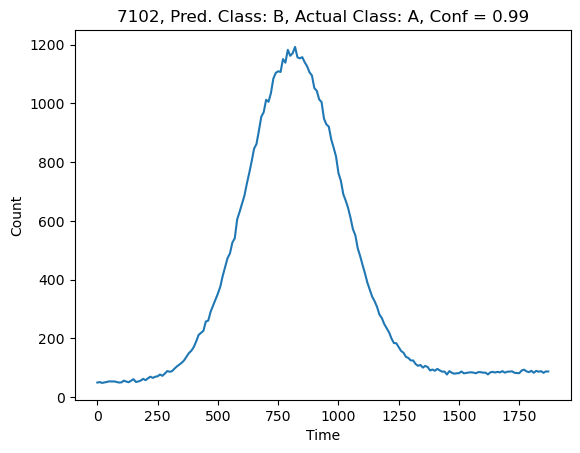

 70%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                                           | 692/990 [00:10<00:03, 98.17it/s]

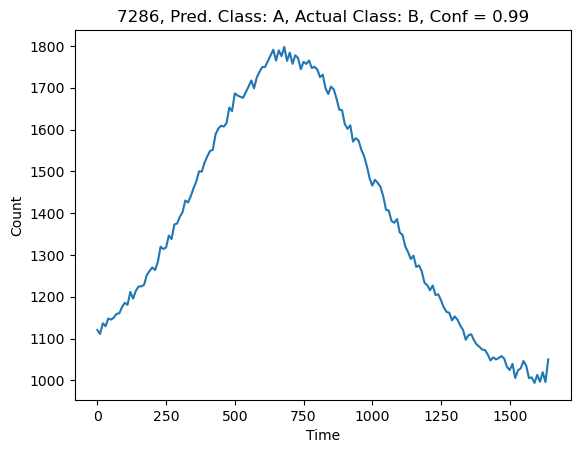

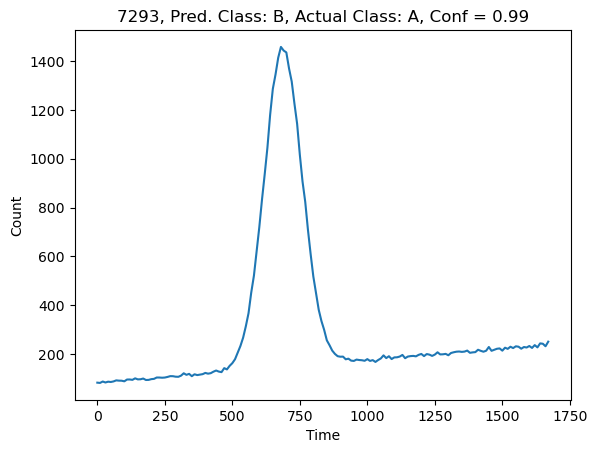

 71%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                                         | 703/990 [00:10<00:03, 88.16it/s]

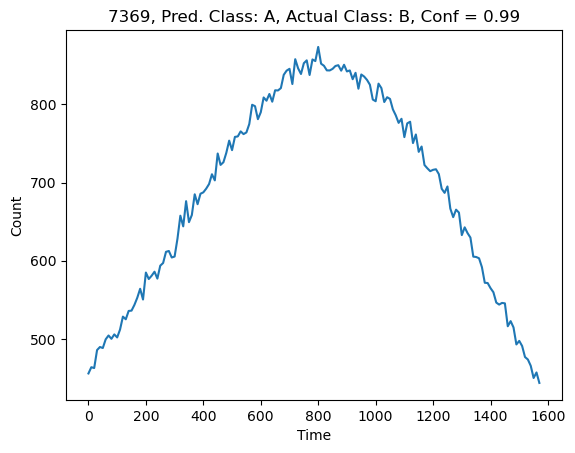

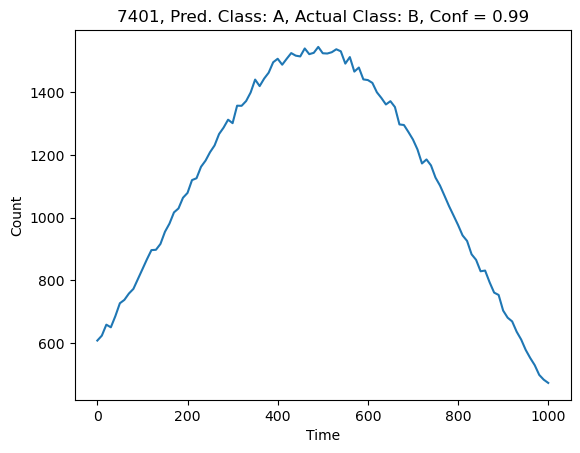

 72%|████████████████████████████████████████████████████████████████████████████████████████████████████████                                        | 715/990 [00:10<00:03, 84.95it/s]

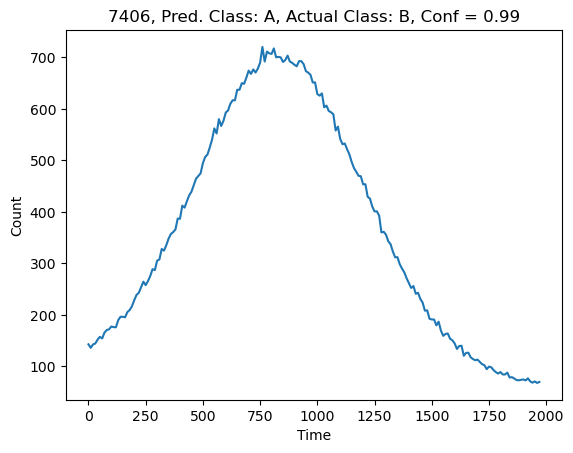

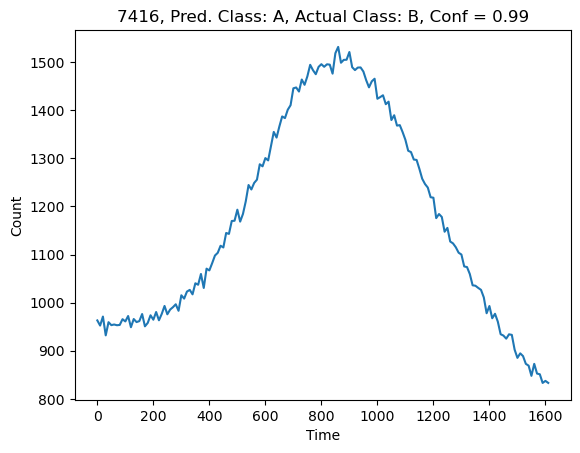

 73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                      | 724/990 [00:11<00:03, 72.05it/s]

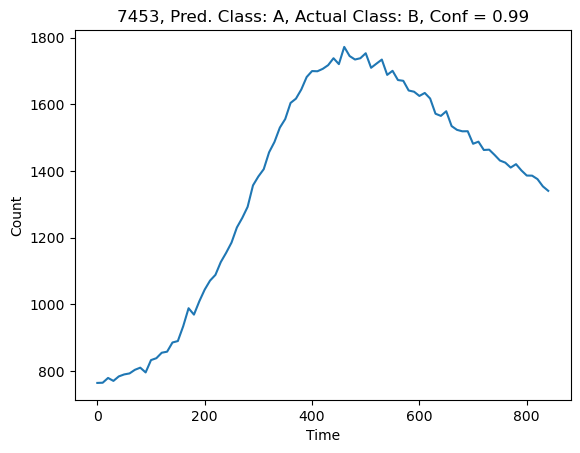

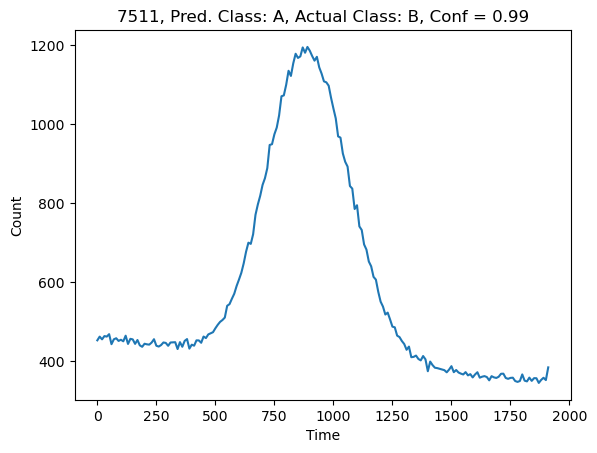

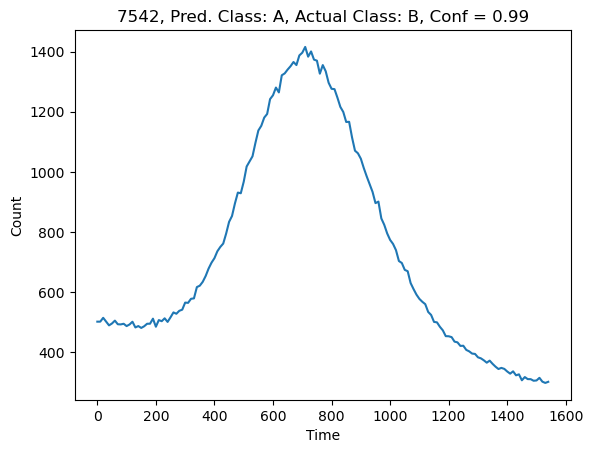

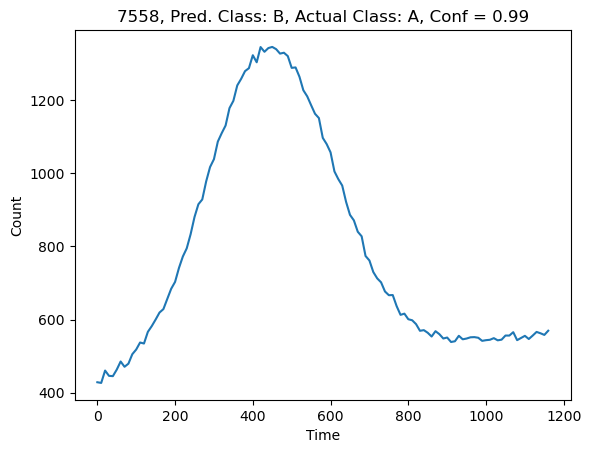

 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                     | 732/990 [00:11<00:05, 51.32it/s]

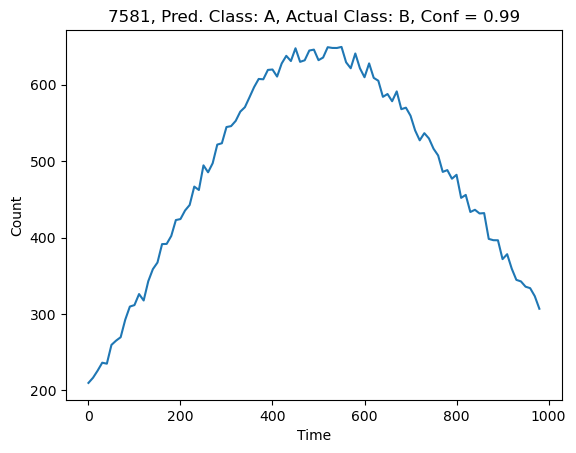

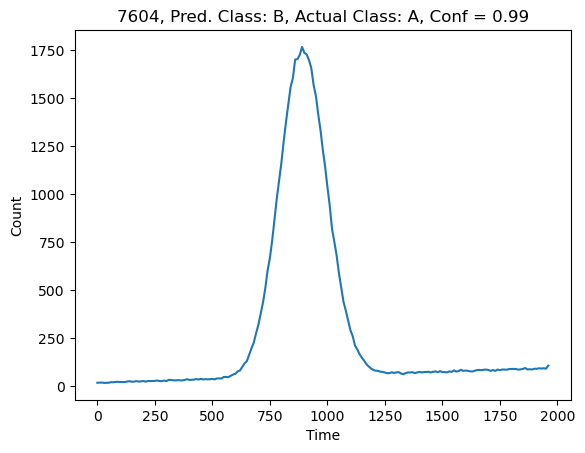

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                    | 738/990 [00:11<00:05, 48.04it/s]

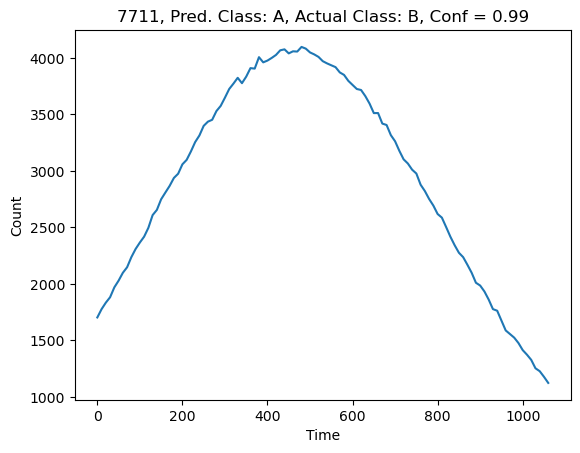

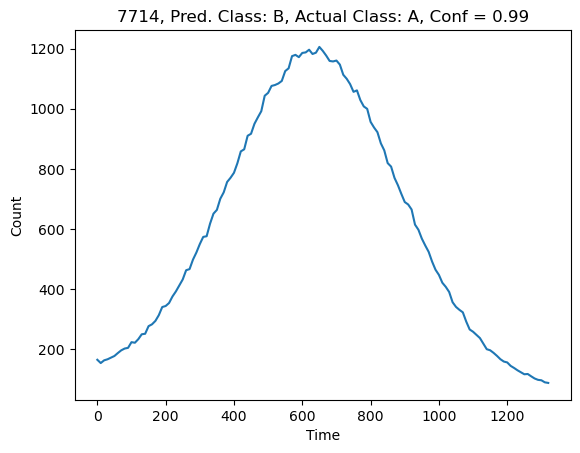

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                   | 744/990 [00:11<00:05, 45.41it/s]

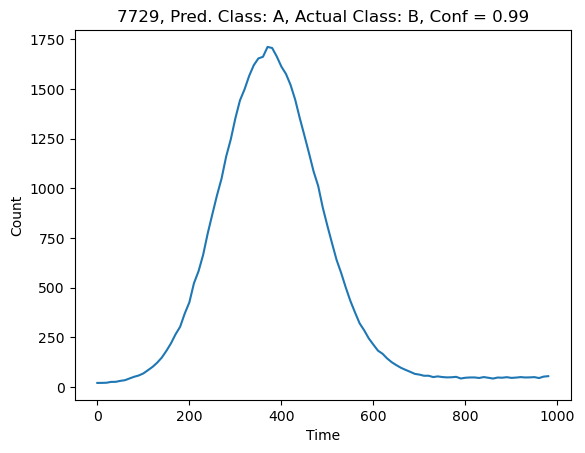

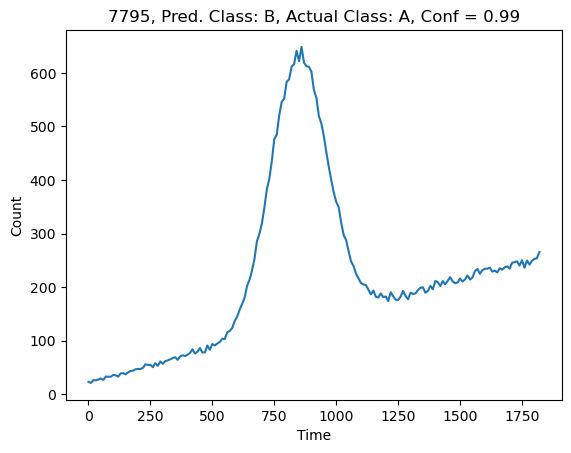

 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 754/990 [00:11<00:04, 49.01it/s]

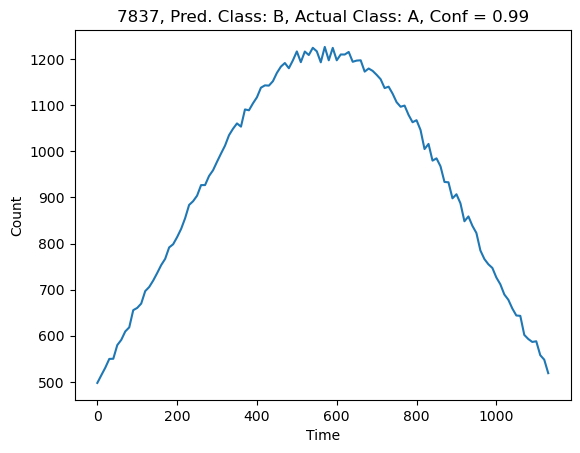

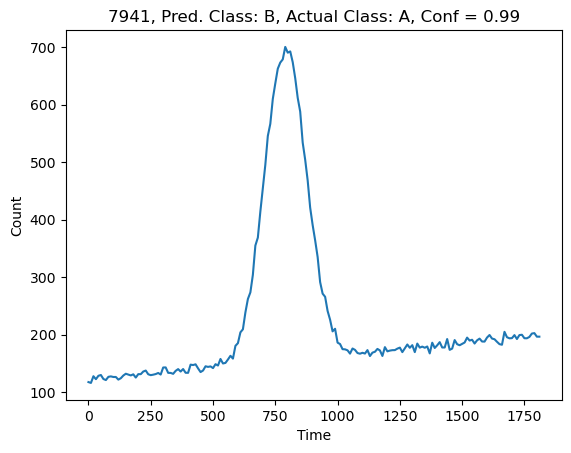

 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                               | 772/990 [00:12<00:03, 64.17it/s]

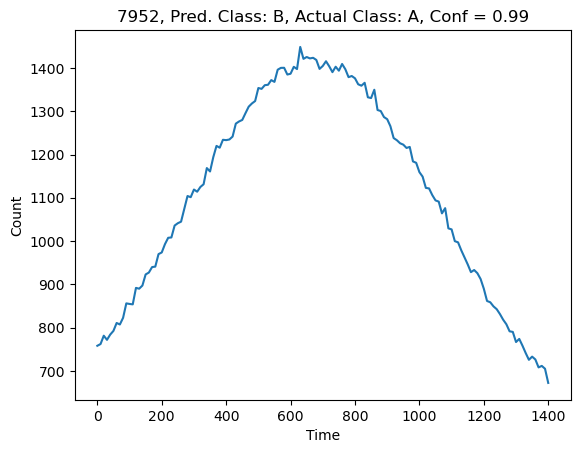

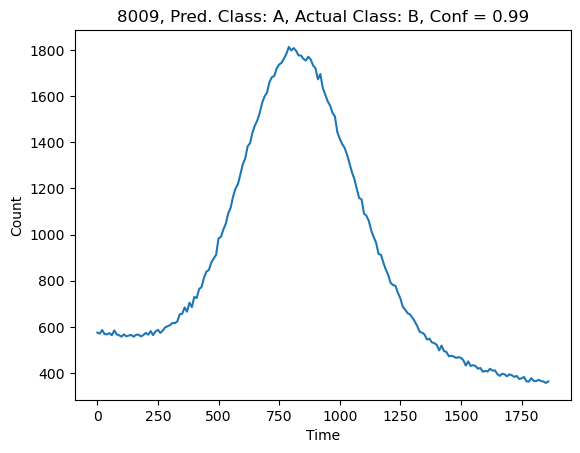

 79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                              | 779/990 [00:12<00:03, 56.95it/s]

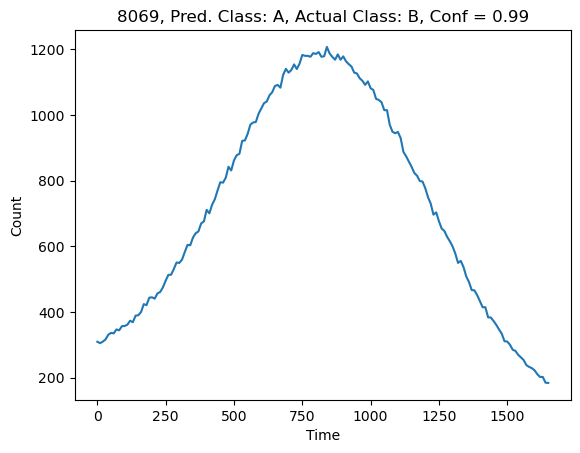

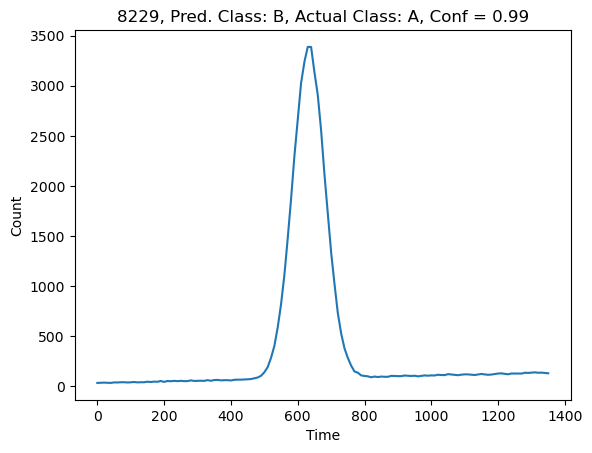

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                            | 798/990 [00:12<00:02, 73.72it/s]

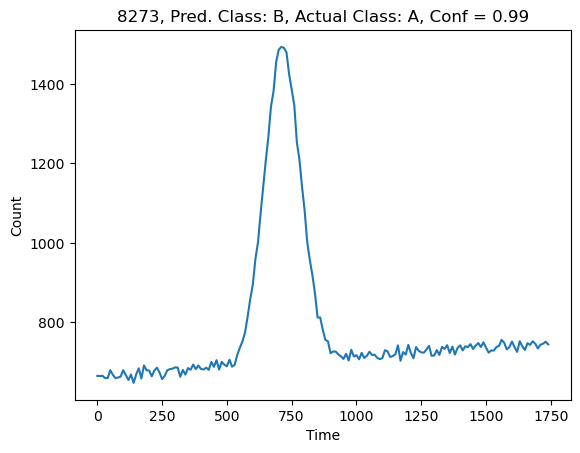

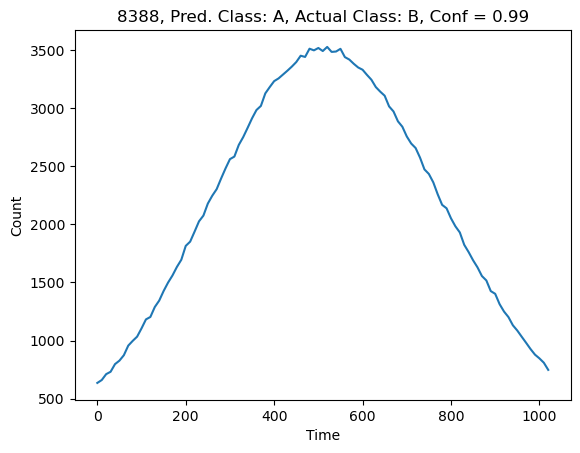

 83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                         | 818/990 [00:12<00:01, 89.67it/s]

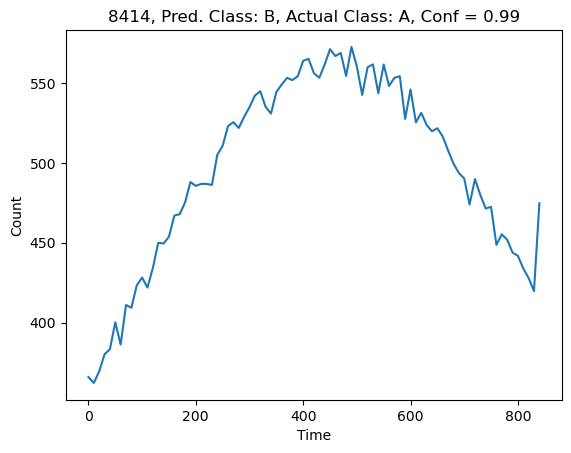

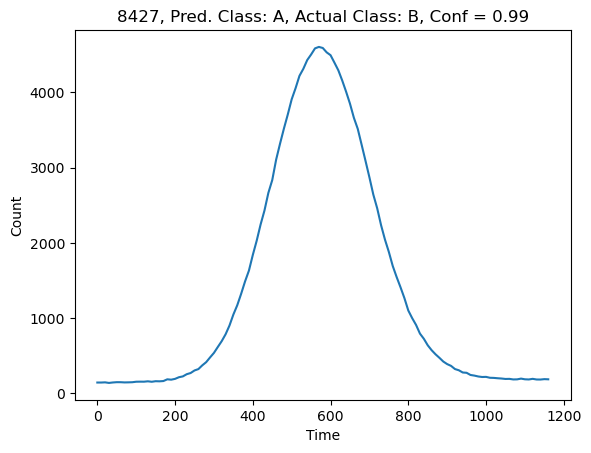

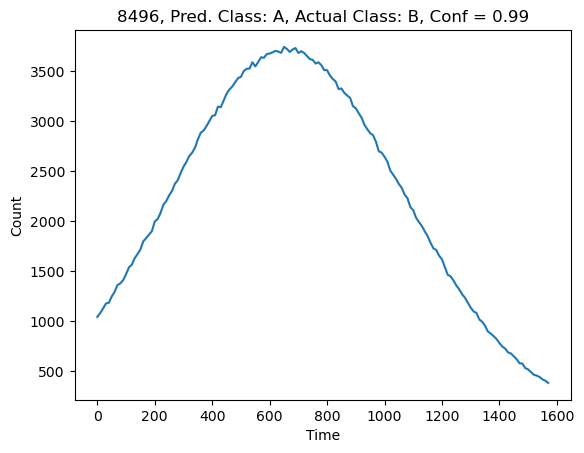

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 828/990 [00:12<00:02, 72.14it/s]

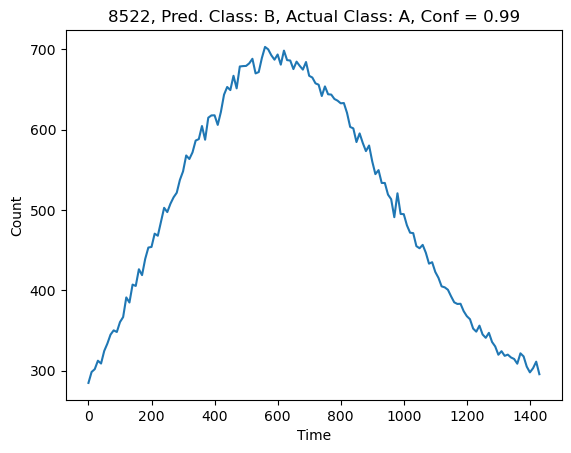

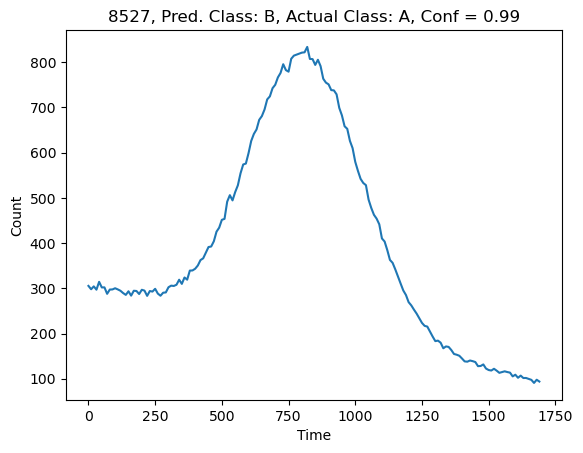

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 836/990 [00:12<00:02, 66.12it/s]

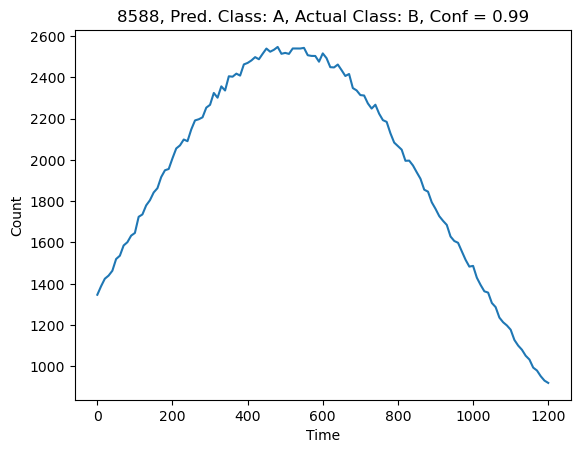

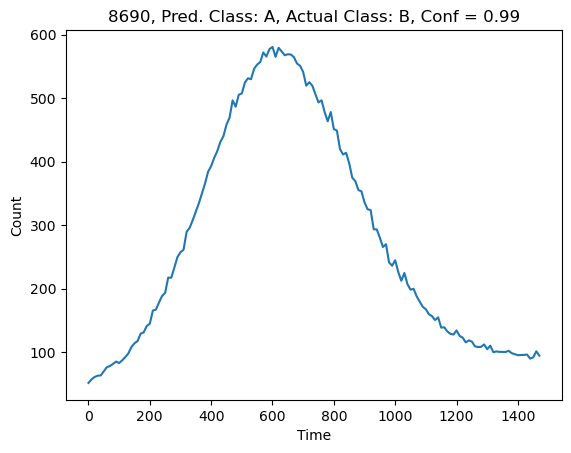

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 847/990 [00:13<00:02, 66.24it/s]

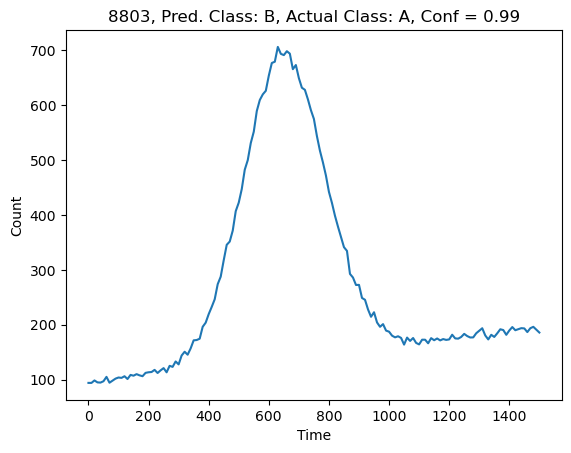

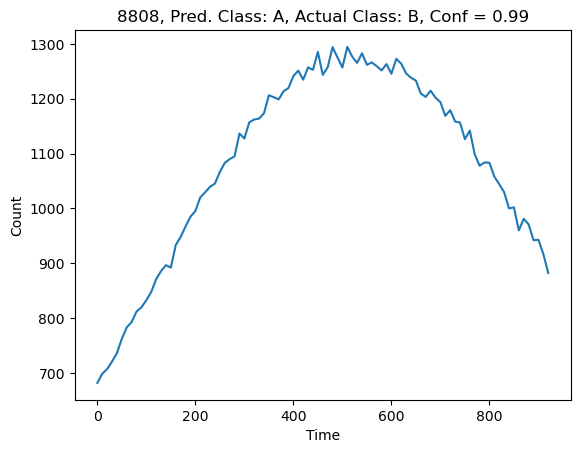

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 858/990 [00:13<00:01, 67.33it/s]

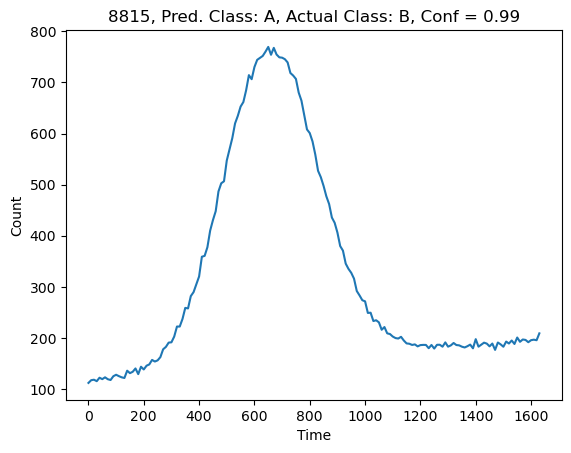

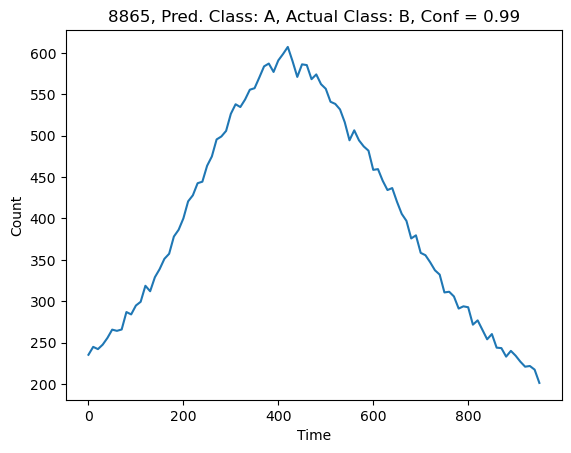

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 865/990 [00:13<00:02, 59.80it/s]

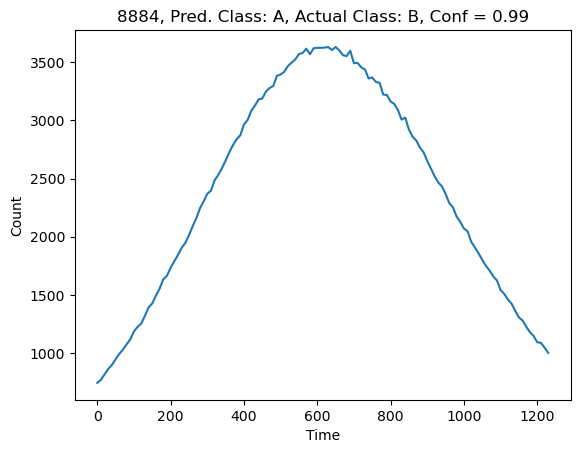

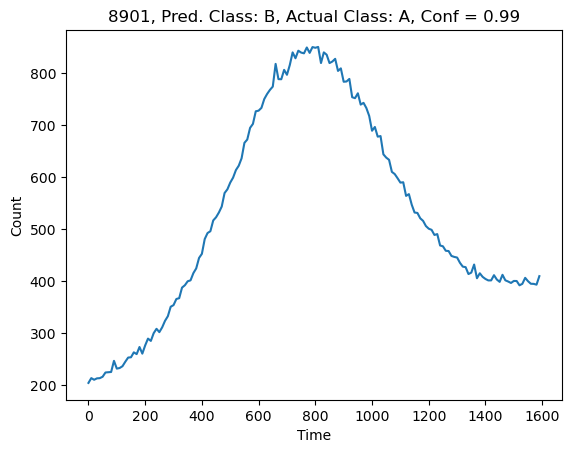

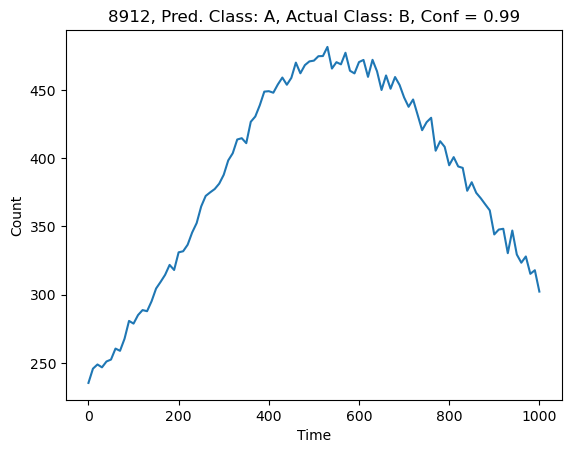

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 872/990 [00:13<00:02, 48.59it/s]

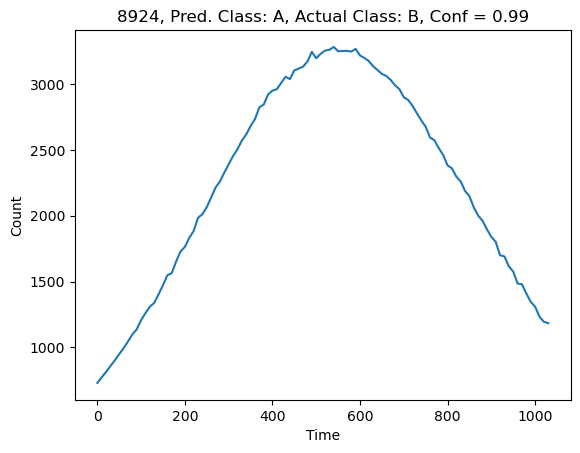

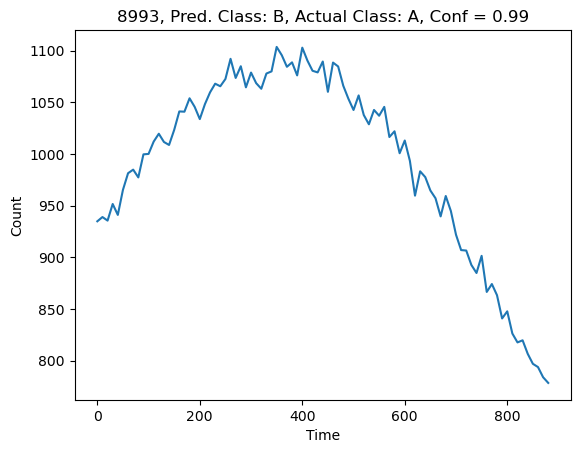

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 881/990 [00:13<00:02, 51.57it/s]

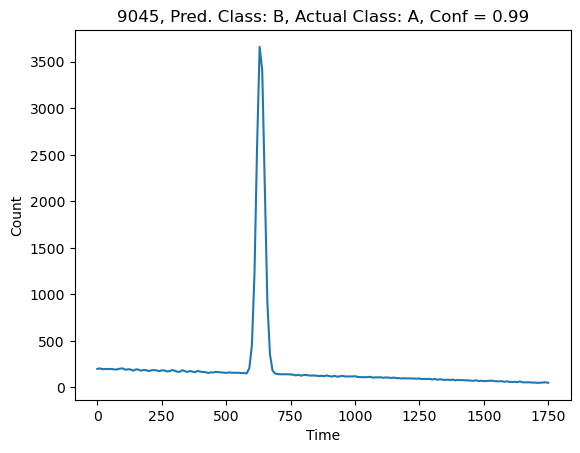

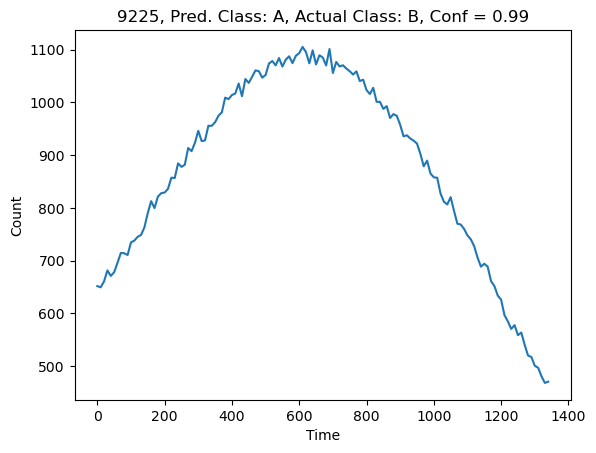

 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 904/990 [00:13<00:01, 76.69it/s]

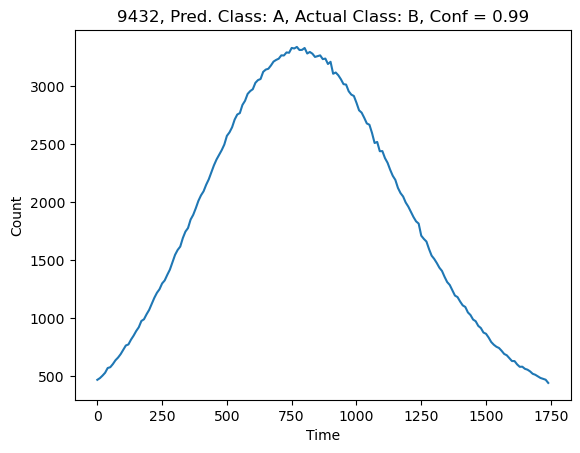

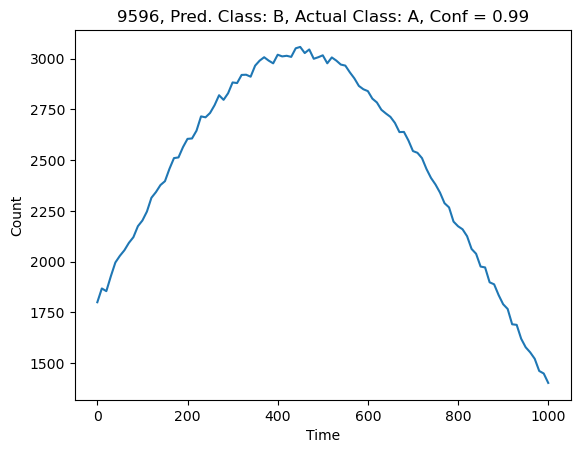

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 937/990 [00:14<00:00, 113.95it/s]

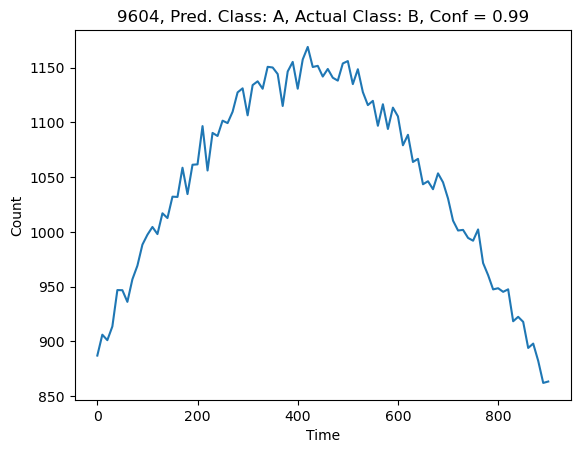

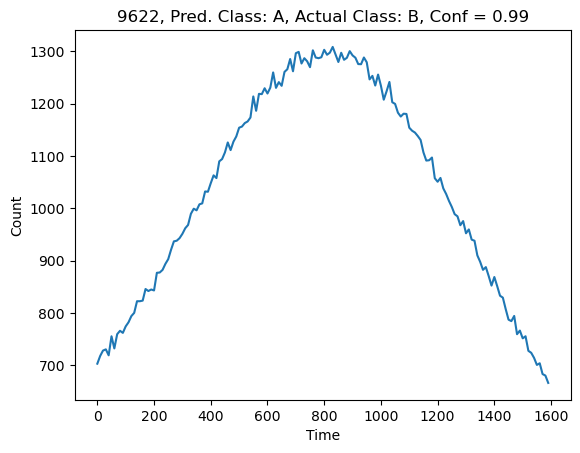

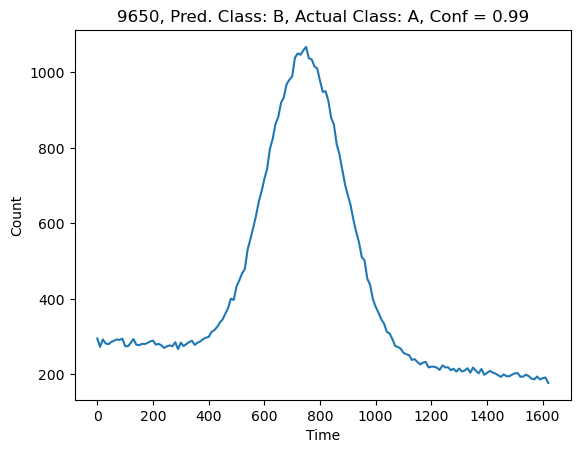

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 949/990 [00:14<00:00, 90.70it/s]

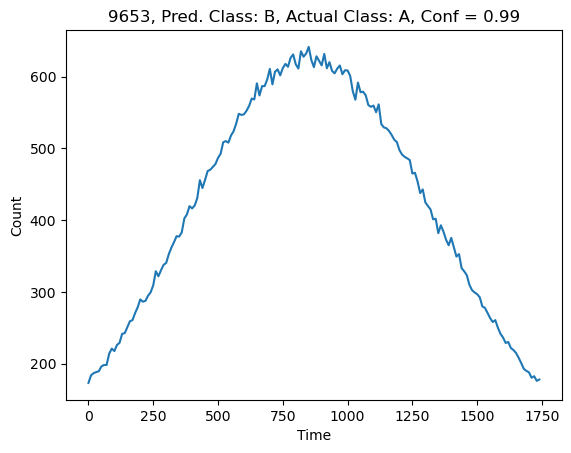

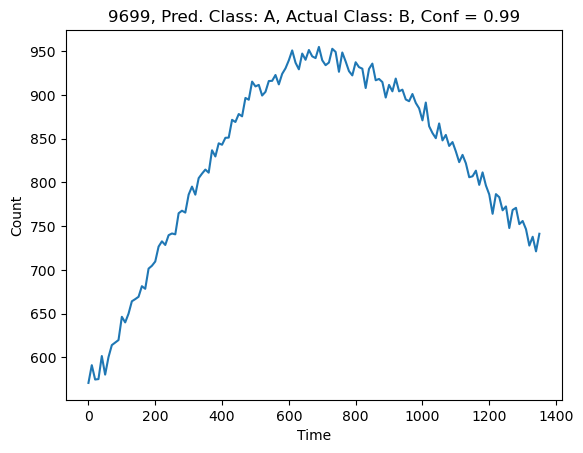

 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 959/990 [00:14<00:00, 83.03it/s]

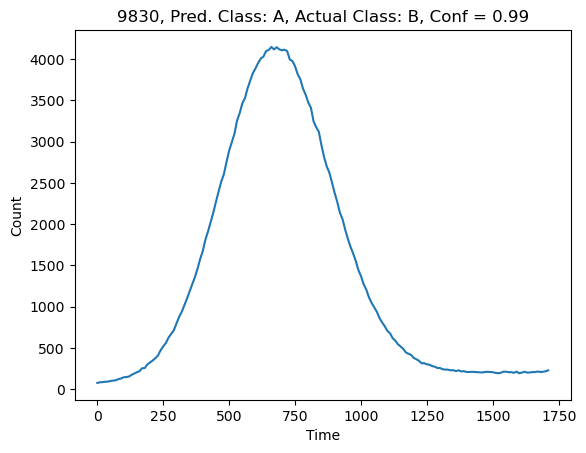

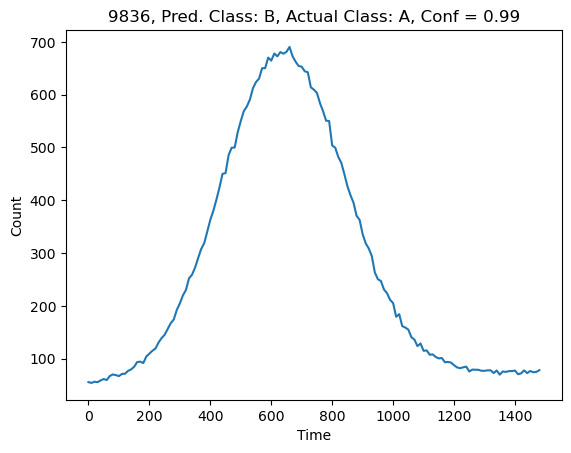

 98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 968/990 [00:14<00:00, 74.70it/s]

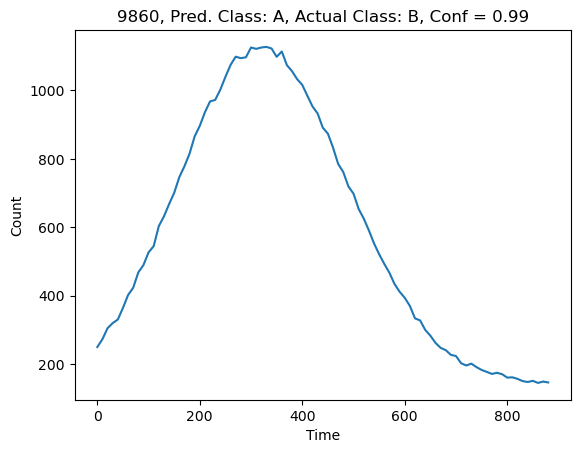

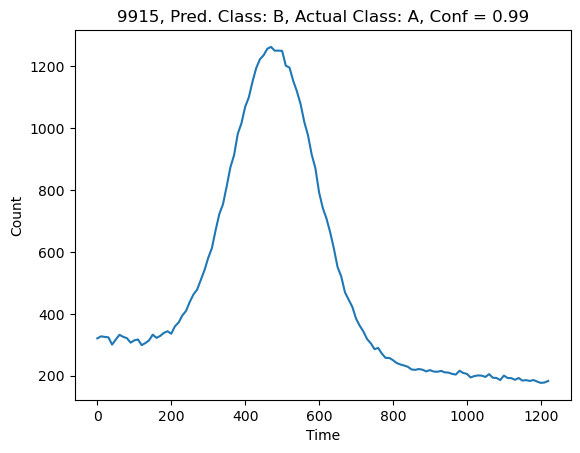

 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 977/990 [00:14<00:00, 71.32it/s]

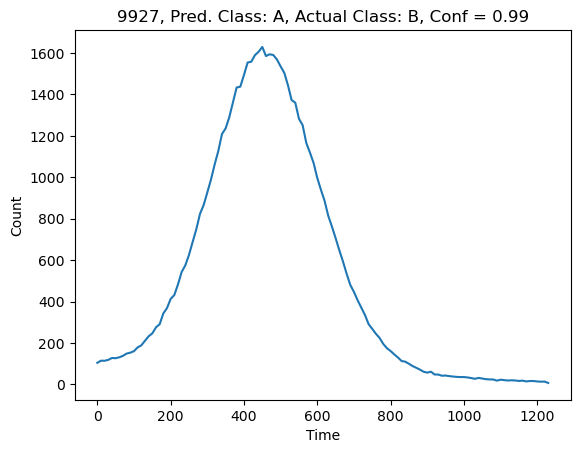

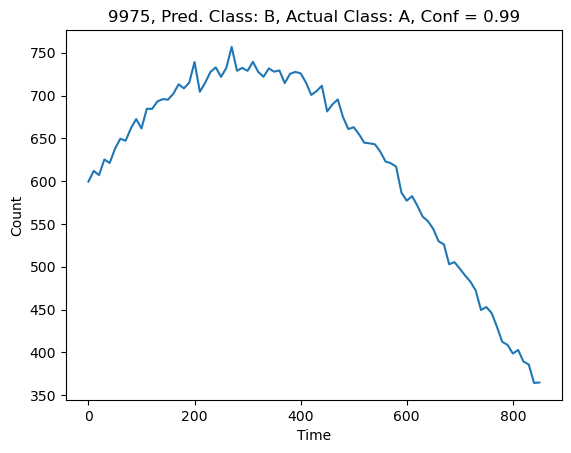

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 986/990 [00:14<00:00, 65.82it/s]

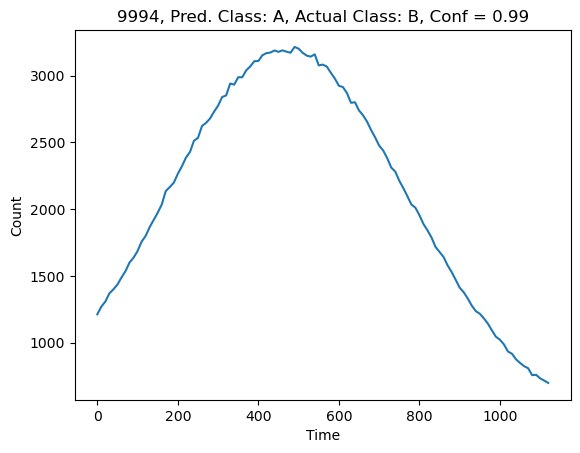

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 990/990 [00:15<00:00, 65.71it/s]


In [31]:
# plotting misclassified 
for i, pred2 in enumerate(tqdm(preds2)):
    pred2_class = int(np.round(pred2[0]))
    if class_list[str(pred2_class)] != class_list[str(labels_val[i])]:
        plt.plot(np.arange(0, len(data_val[i][data_val[i] != 0]))*10, data_val[i][data_val[i] != 0])

        plt.xlabel('Time')
        plt.ylabel('Count')

        plt.title(f"{ids_val[i]}, Pred. Class: {class_list[str(pred2_class)]}, Actual Class: {class_list[str(labels_val[i])]}, Conf = {np.round(conf, 3)}")
        plt.show()

# merge the layers 

In [25]:
from keras.layers import Concatenate, Input

# Define the input tensors with the correct shapes
input_shape_1 = (len(data_train[0]), 1)
input_shape_2 = (len(data_deriv_train[0]), 1)
input_shape_3 = (len(data_deriv2_train[0]), 1)

print(input_shape_2)

input1 = Input(shape=input_shape_1)
input2 = Input(shape=input_shape_2)
input3 = Input(shape=input_shape_3)

# Get the outputs of the models
output1 = model1(input1)
output2 = model2(input2)
output3 = model3(input3)

# Concatenate the outputs of the two models
merged = Concatenate()([model1.output, model2.output, model3.output])

# Add more layers 
x = Dense(128, activation='relu')(merged)
x = Dropout(0.5)(x)
final_output = Dense(1, activation='sigmoid')(x)

# # Create the final model

(199, 1)


In [27]:
from keras.models import Model
combined_model = Model(inputs=[model1.input, model2.input, model3.input], outputs=final_output)
combined_model.compile(optimizer=Adam(), loss='binary_crossentropy', metrics=['accuracy'])
combined_model.fit([data_train, data_deriv_train, data_deriv2_train], np.array(labels_train), epochs=100, batch_size=32)

Epoch 1/100
279/279 ━━━━━━━━━━━━━━━━━━━━ 12s 18ms/step - accuracy: 0.7865 - loss: 0.0000e+00
Epoch 2/100
279/279 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9409 - loss: 0.0000e+00
Epoch 3/100
279/279 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9265 - loss: 0.0000e+00
Epoch 4/100
279/279 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9374 - loss: 0.0000e+00
Epoch 5/100
279/279 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9445 - loss: 0.0000e+00
Epoch 6/100
279/279 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9443 - loss: 0.0000e+00
Epoch 7/100
279/279 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9545 - loss: 0.0000e+00
Epoch 8/100
279/279 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9255 - loss: 0.0000e+00
Epoch 9/100
279/279 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9434 - loss: 0.0000e+00
Epoch 10/100
279/279 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9258 - loss: 0.0000e+00
Epoch 11/100
279/279 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9418 - loss: 0.0000

In [28]:
data_expanded = np.expand_dims(data_val, axis=-1)
data_deriv_expanded = np.expand_dims(data_deriv_val, axis=-1)
data_deriv2_expanded = np.expand_dims(data_deriv2_val, axis=-1)

preds4 = combined_model.predict([data_expanded, data_deriv_expanded, data_deriv2_expanded])

31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step 


In [29]:
from tqdm import tqdm 

class_list = {'0': 'A' , '1': 'B'}

num_high = 0
num_mis_high = 0
num_mis_low = 0

tot_exc = 0
mis_index_4 = []
for i, pred4 in enumerate(tqdm(preds4)):
    conf = np.abs(pred4[0]-0.5)+0.5     # pred is just 1 number 
    pred4_class = int(np.round(pred4[0]))

    #print(pred4_class, labels_val[i])

    tot_exc += 1
    
    if conf > 0.9:
        #plt.savefig(f'classifications/high_confidence/{ids[i]}.png')
        num_high += 1

        if class_list[str(pred4_class)] != class_list[str(labels_val[i])]:
            mis_index_4.append(i)
            num_mis_high += 1
            #plt.show()
    else:
        #plt.savefig(f'classifications/low_confidence/{ids[i]}.png')

        if class_list[str(pred4_class)] != class_list[str(labels_val[i])]:
            num_mis_low += 1
            mis_index_4.append(i)
            #plt.show()

    #plt.close()

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 990/990 [00:00<00:00, 197214.96it/s]


In [31]:
print(1-len(mis_index_4)/len(data_val))

0.8171717171717172


In [30]:
print(f'Number of high confidence classifications = {num_high}')
print(f'Number of low confidence classifications = {len(preds4) - num_high}')
print(f'Percentage of high confidence = {num_high/len(preds4)}')

print(f'Total misclassified = {num_mis_high + num_mis_low}')
print(f'Accuracy in total = {1-(num_mis_high + num_mis_low)/len(preds4)}')

# print(f'Accuracy of high confidence = {1-num_mis_high/num_high}')
print(f'Accuracy of low confidence = {1-num_mis_low/(len(preds4) - num_high)}')

Number of high confidence classifications = 947
Number of low confidence classifications = 43
Percentage of high confidence = 0.9565656565656566
Total misclassified = 181
Accuracy in total = 0.8171717171717172
Accuracy of low confidence = 0.5116279069767442


In [27]:
print(set(mis_index_1) & set(mis_index_2) & set(mis_index_3))
print(len(set(mis_index_1) & set(mis_index_2) & set(mis_index_3)))
print(len(mis_index_3))

{3, 516, 518, 519, 903, 393, 778, 140, 525, 782, 397, 528, 145, 18, 149, 662, 153, 154, 410, 28, 922, 31, 288, 416, 418, 35, 676, 422, 423, 553, 169, 427, 46, 943, 49, 178, 563, 180, 817, 434, 826, 67, 964, 837, 584, 969, 714, 459, 716, 846, 336, 210, 978, 726, 87, 857, 858, 347, 732, 988, 863, 480, 225, 865, 868, 357, 742, 745, 874, 620, 111, 242, 118, 886, 379}
75
174


##  plotting to see if it looks right

  0%|          | 0/1000 [00:00<?, ?it/s]

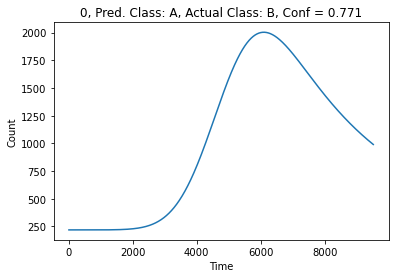

  0%|          | 1/1000 [00:00<02:17,  7.28it/s]

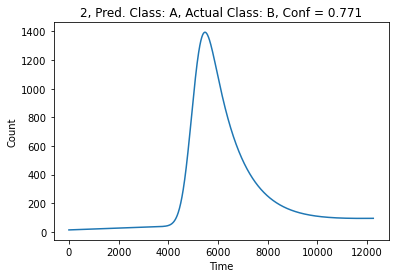

  0%|          | 3/1000 [00:00<01:29, 11.10it/s]

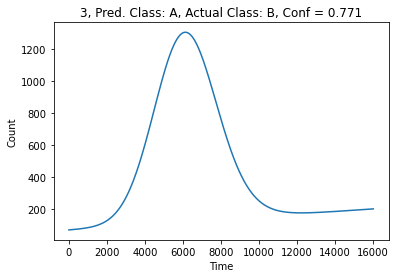

  0%|          | 5/1000 [00:00<02:23,  6.91it/s]

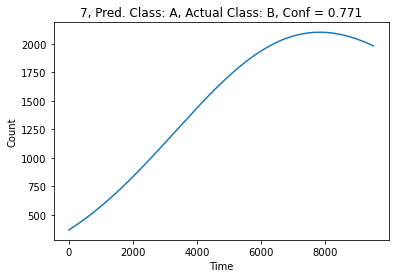

  1%|          | 8/1000 [00:00<01:32, 10.73it/s]

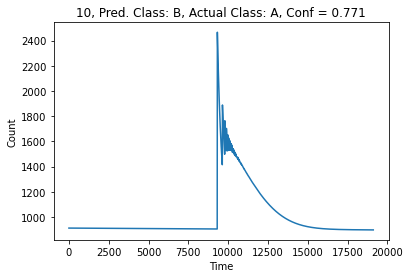

  1%|          | 11/1000 [00:00<01:11, 13.82it/s]

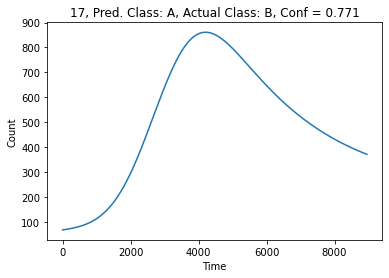

  2%|▏         | 18/1000 [00:01<00:40, 24.28it/s]

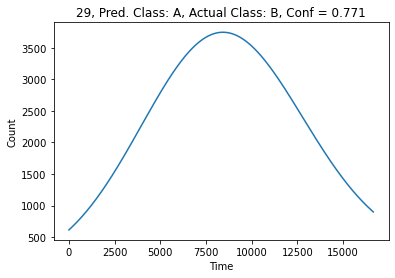

  3%|▎         | 30/1000 [00:01<00:22, 42.85it/s]

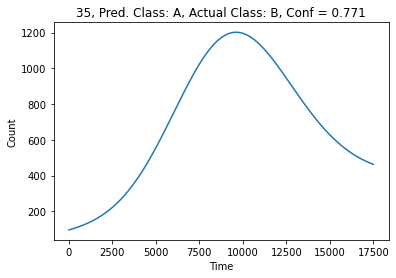

  4%|▎         | 36/1000 [00:01<00:21, 45.23it/s]

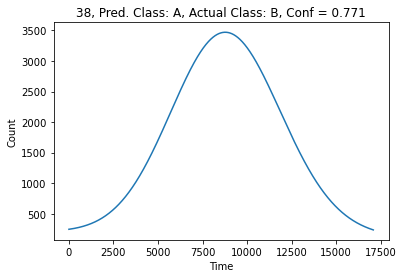

  4%|▍         | 42/1000 [00:01<00:20, 46.32it/s]

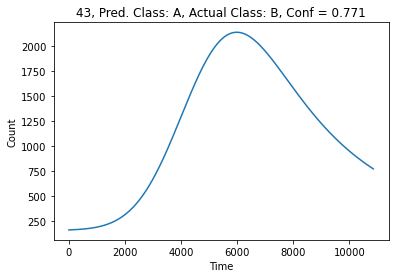

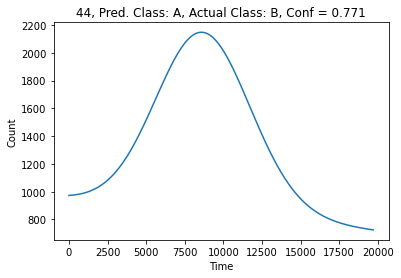

  5%|▍         | 47/1000 [00:01<00:27, 34.63it/s]

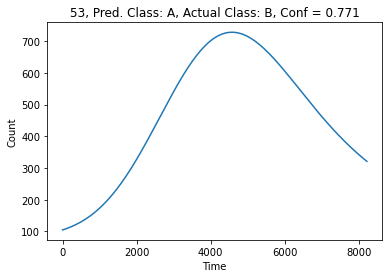

  5%|▌         | 54/1000 [00:01<00:22, 41.56it/s]

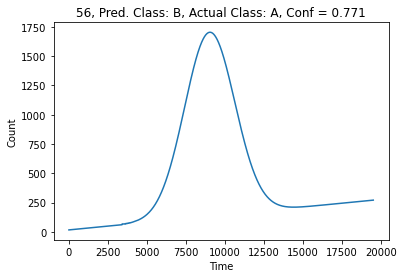

  6%|▌         | 59/1000 [00:01<00:23, 40.56it/s]

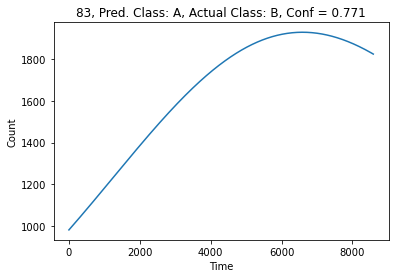

  8%|▊         | 84/1000 [00:02<00:10, 87.83it/s]

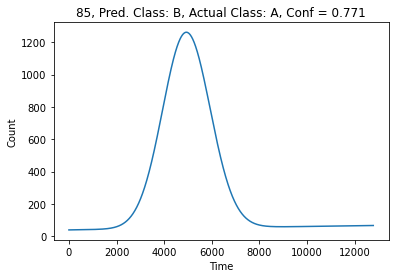

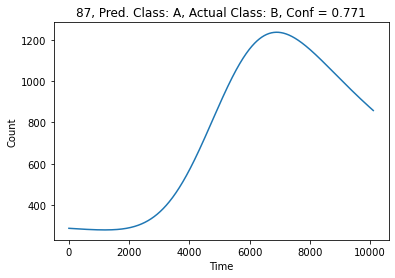

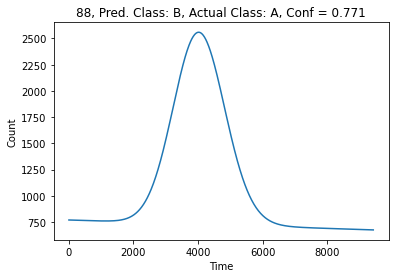

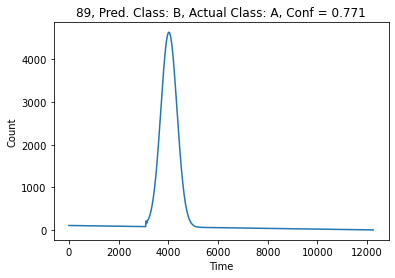

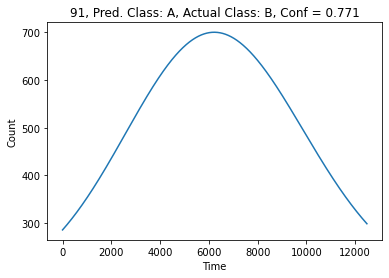

 10%|▉         | 95/1000 [00:02<00:20, 43.85it/s]

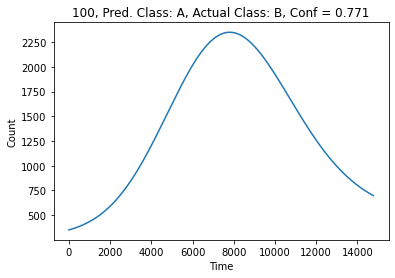

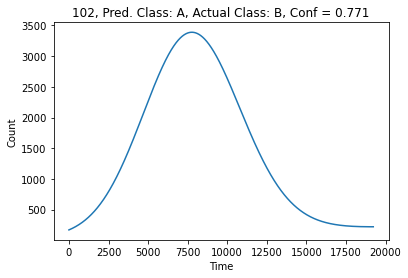

 10%|█         | 103/1000 [00:02<00:22, 40.58it/s]

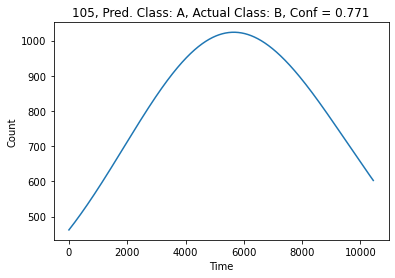

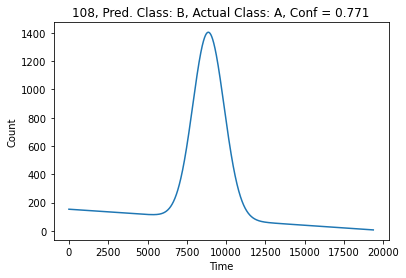

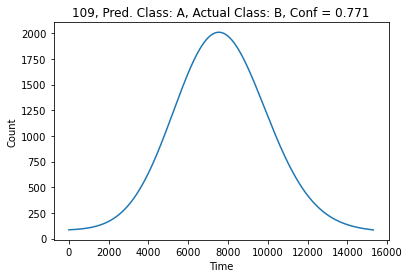

 11%|█         | 110/1000 [00:03<00:27, 32.29it/s]

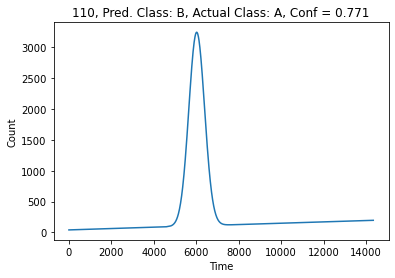

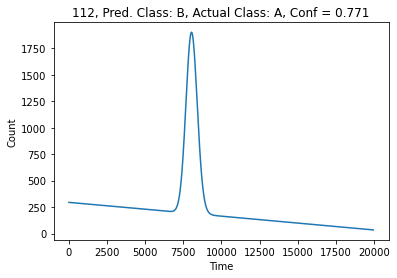

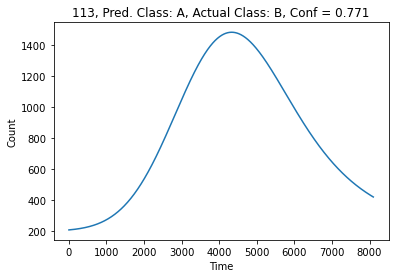

 12%|█▏        | 116/1000 [00:03<00:32, 26.79it/s]

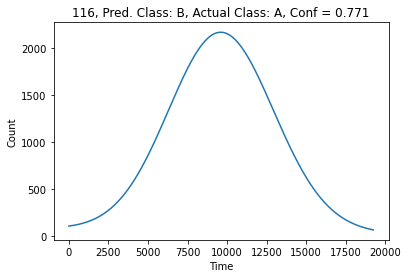

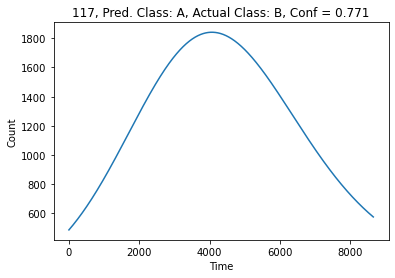

 12%|█▏        | 121/1000 [00:03<00:33, 26.11it/s]

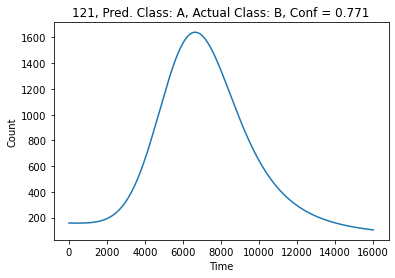

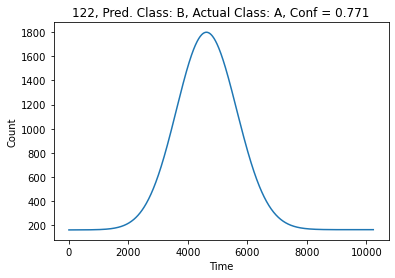

 12%|█▎        | 125/1000 [00:04<00:37, 23.55it/s]

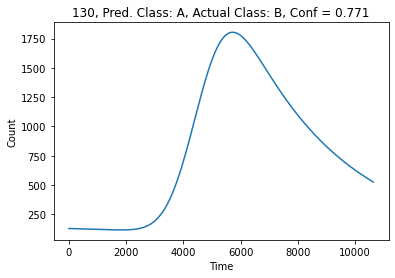

 13%|█▎        | 131/1000 [00:04<00:31, 27.96it/s]

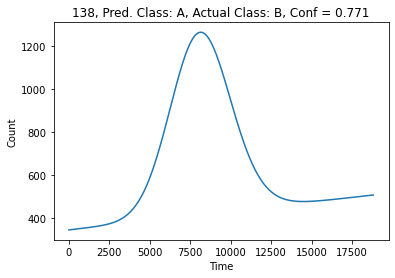

 14%|█▍        | 139/1000 [00:04<00:32, 26.50it/s]

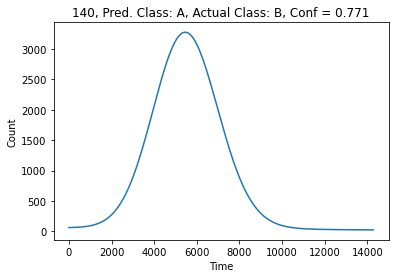

 14%|█▍        | 143/1000 [00:04<00:30, 28.03it/s]

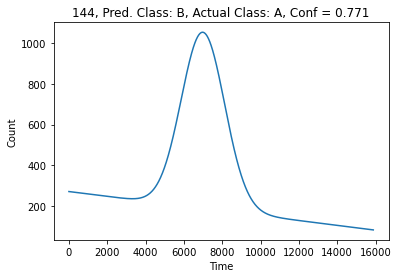

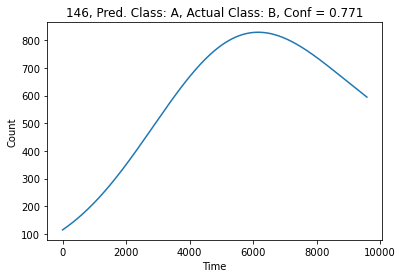

 15%|█▍        | 147/1000 [00:04<00:34, 24.88it/s]

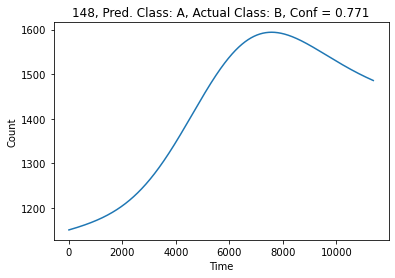

 15%|█▌        | 150/1000 [00:04<00:33, 25.45it/s]

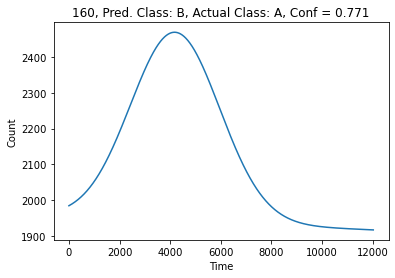

 16%|█▌        | 161/1000 [00:05<00:21, 39.23it/s]

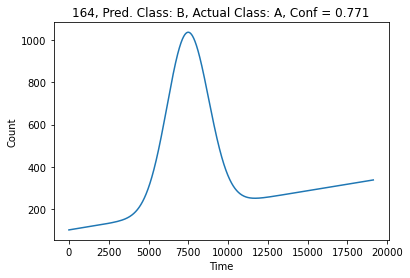

 17%|█▋        | 166/1000 [00:05<00:21, 38.94it/s]

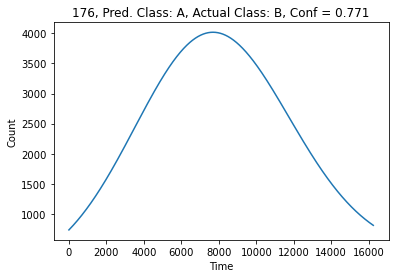

 18%|█▊        | 177/1000 [00:05<00:15, 52.21it/s]

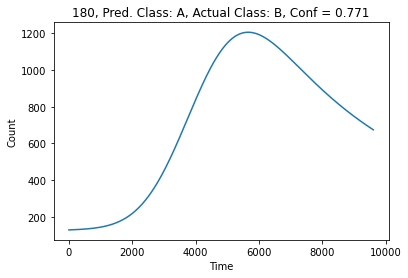

 18%|█▊        | 183/1000 [00:05<00:15, 53.74it/s]

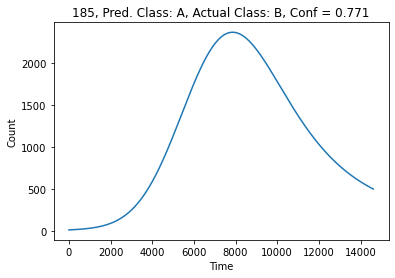

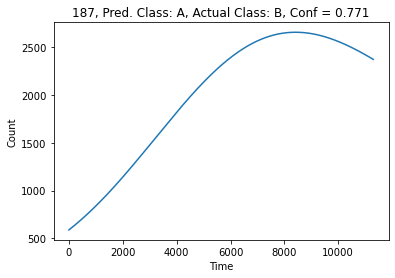

 19%|█▉        | 189/1000 [00:05<00:18, 44.17it/s]

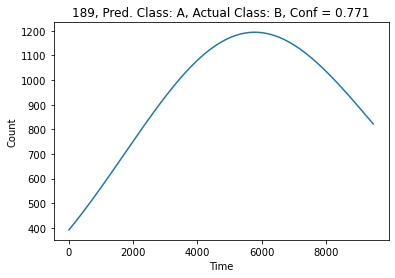

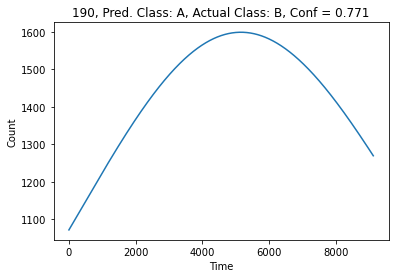

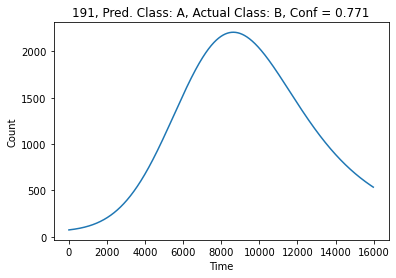

 19%|█▉        | 194/1000 [00:05<00:26, 30.54it/s]

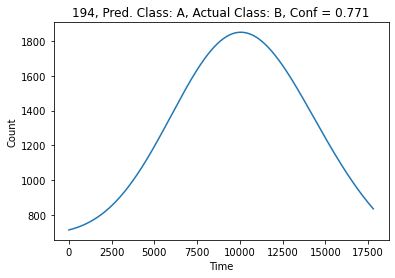

 20%|█▉        | 198/1000 [00:06<00:31, 25.51it/s]

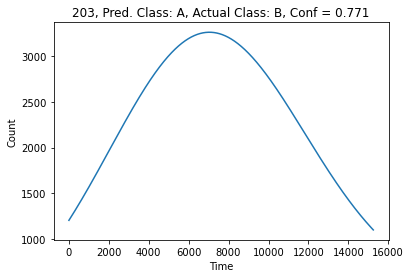

 20%|██        | 204/1000 [00:06<00:26, 30.38it/s]

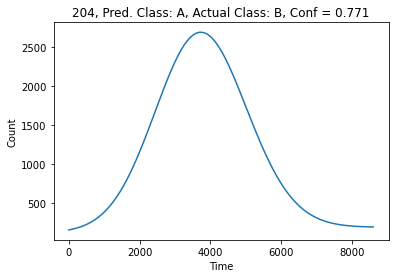

 21%|██        | 208/1000 [00:06<00:27, 29.18it/s]

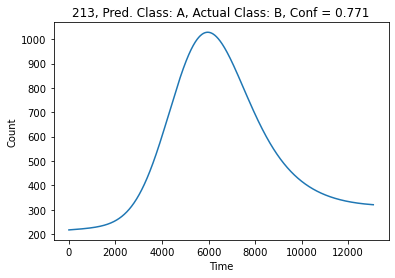

 21%|██▏       | 214/1000 [00:06<00:23, 33.60it/s]

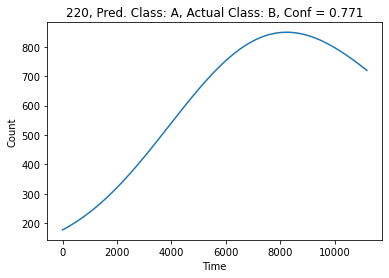

 22%|██▏       | 221/1000 [00:06<00:19, 39.75it/s]

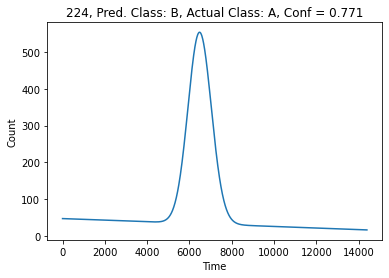

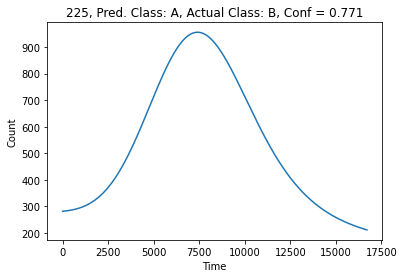

 23%|██▎       | 226/1000 [00:07<00:28, 27.62it/s]

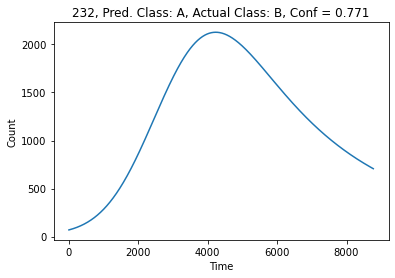

 23%|██▎       | 233/1000 [00:07<00:22, 33.88it/s]

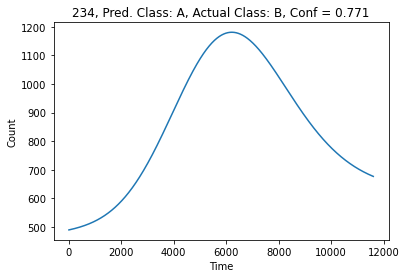

 24%|██▍       | 238/1000 [00:07<00:21, 35.72it/s]

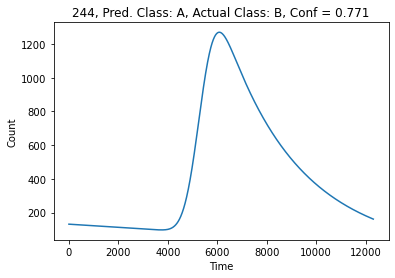

 24%|██▍       | 245/1000 [00:07<00:18, 41.12it/s]

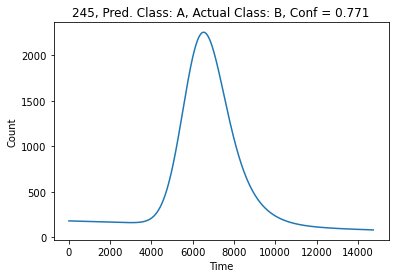

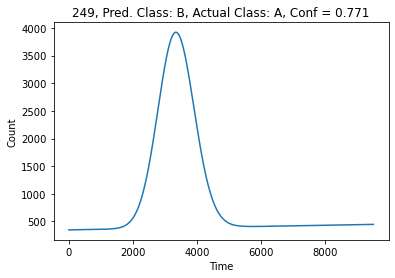

 25%|██▌       | 250/1000 [00:07<00:22, 33.36it/s]

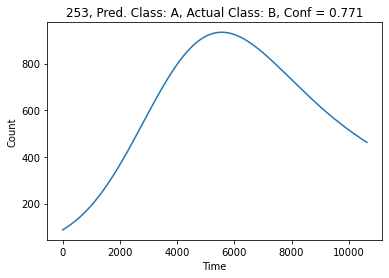

 25%|██▌       | 254/1000 [00:07<00:21, 34.54it/s]

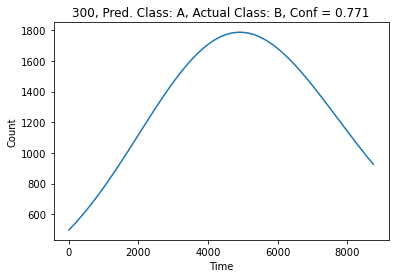

 30%|███       | 301/1000 [00:07<00:05, 127.17it/s]

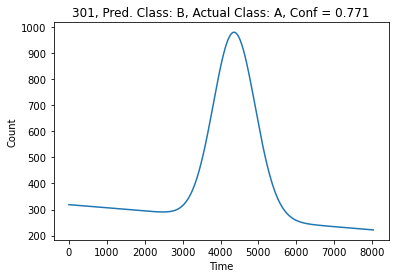

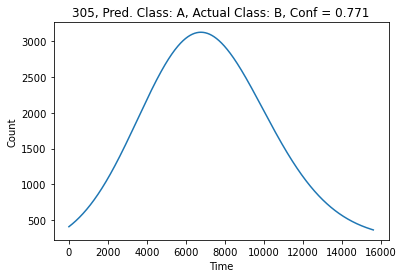

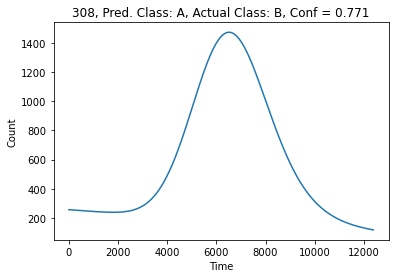

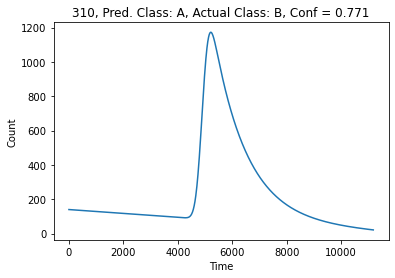

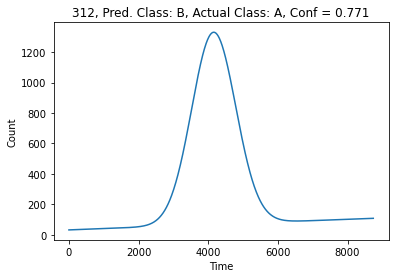

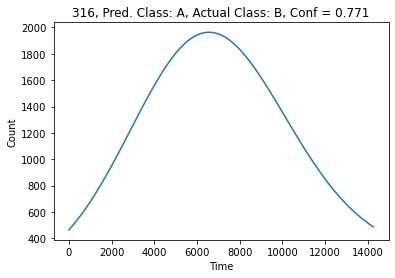

 32%|███▏      | 317/1000 [00:08<00:15, 44.42it/s] 

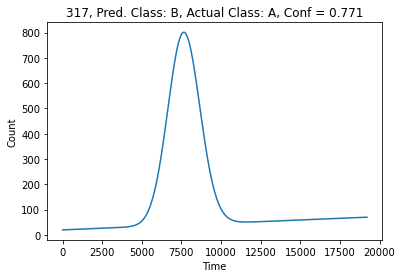

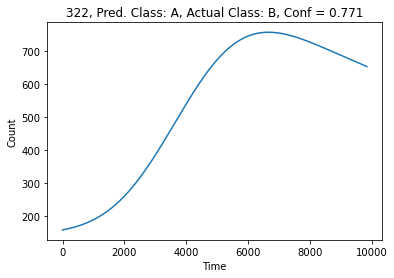

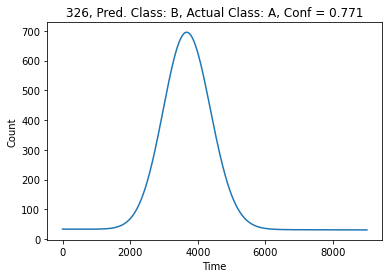

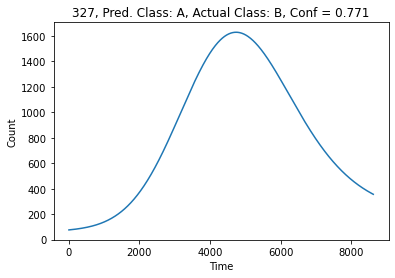

 33%|███▎      | 329/1000 [00:09<00:18, 36.41it/s]

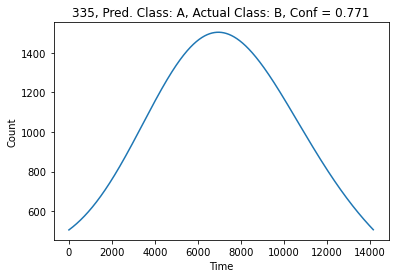

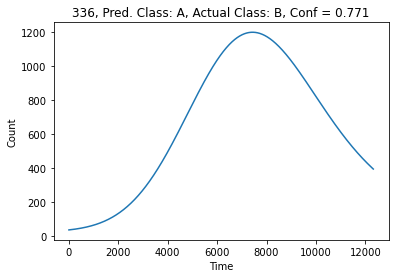

 34%|███▍      | 338/1000 [00:09<00:18, 35.70it/s]

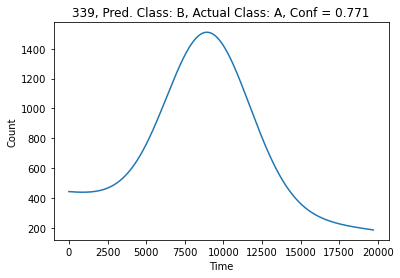

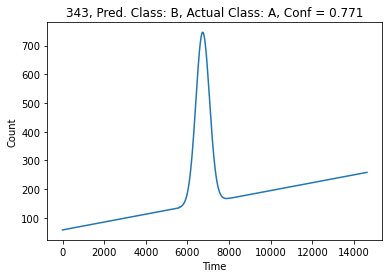

 34%|███▍      | 345/1000 [00:09<00:19, 33.55it/s]

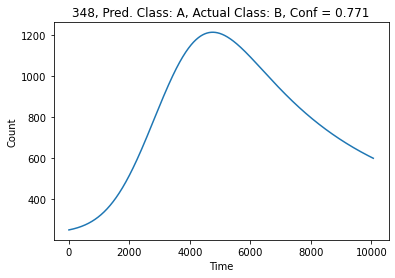

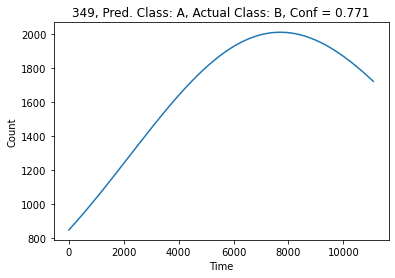

 35%|███▌      | 351/1000 [00:10<00:20, 31.67it/s]

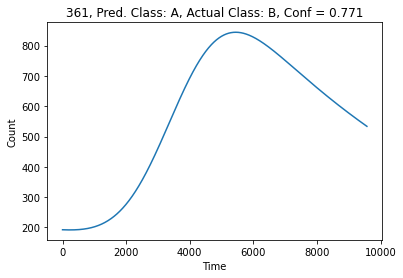

 36%|███▌      | 362/1000 [00:10<00:16, 39.66it/s]

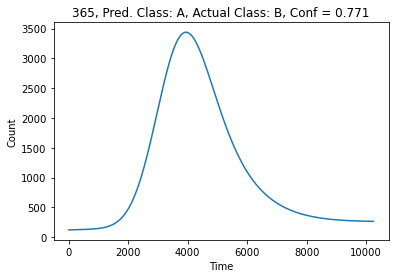

 37%|███▋      | 368/1000 [00:10<00:15, 40.63it/s]

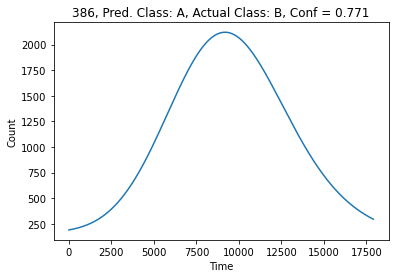

 39%|███▊      | 387/1000 [00:10<00:09, 62.40it/s]

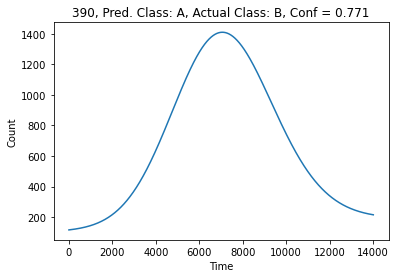

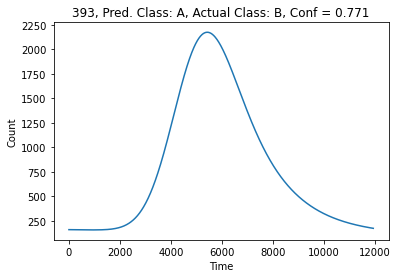

 40%|███▉      | 396/1000 [00:10<00:11, 54.68it/s]

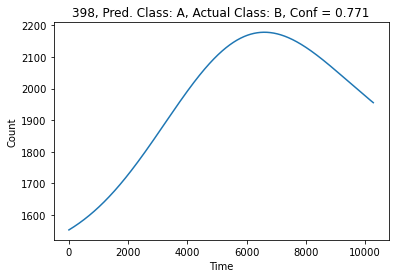

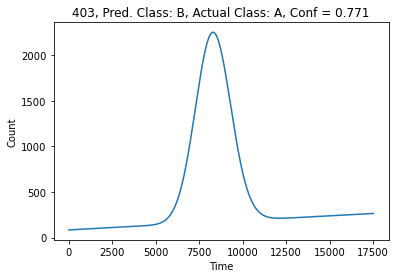

 40%|████      | 404/1000 [00:10<00:12, 48.49it/s]

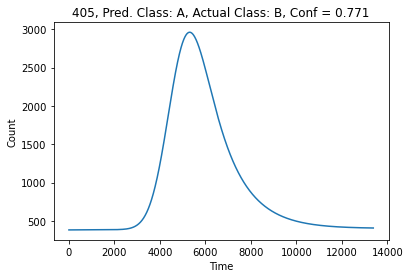

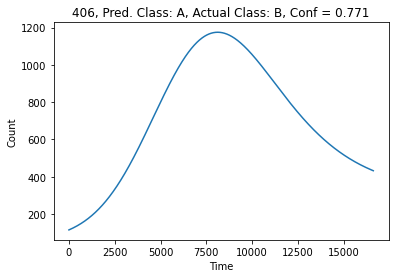

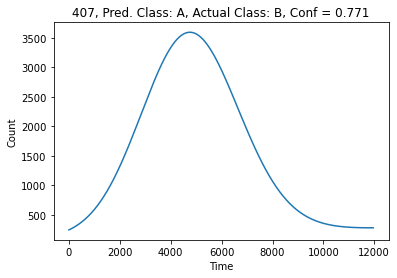

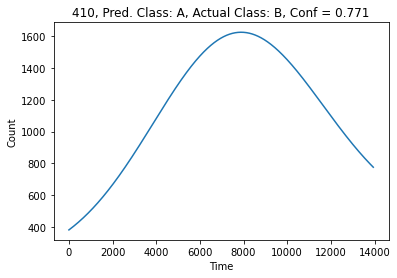

 41%|████      | 411/1000 [00:11<00:18, 32.62it/s]

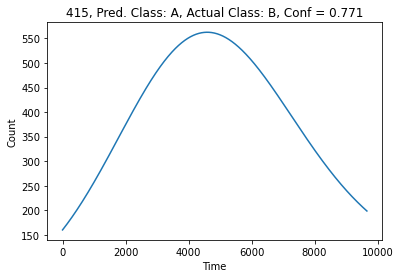

 42%|████▏     | 416/1000 [00:11<00:17, 33.98it/s]

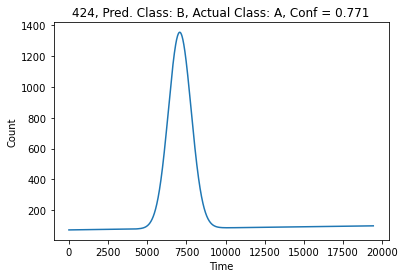

 42%|████▎     | 425/1000 [00:11<00:14, 40.58it/s]

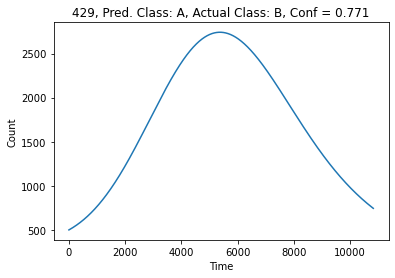

 43%|████▎     | 431/1000 [00:11<00:12, 43.87it/s]

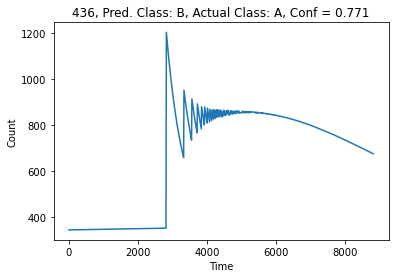

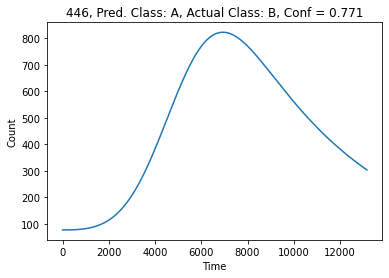

 45%|████▍     | 447/1000 [00:11<00:10, 54.50it/s]

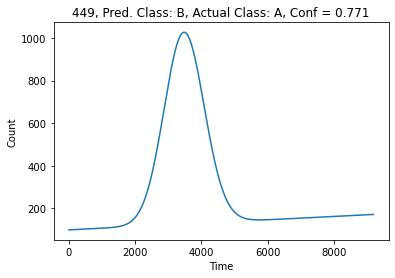

 45%|████▌     | 454/1000 [00:12<00:09, 56.96it/s]

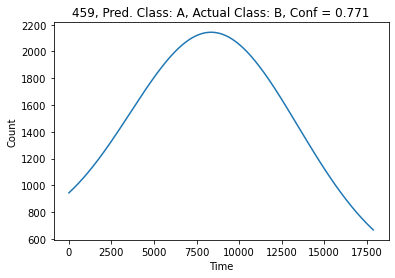

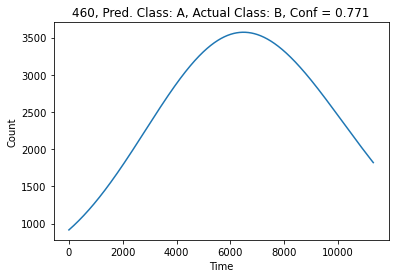

 46%|████▌     | 461/1000 [00:12<00:16, 33.53it/s]

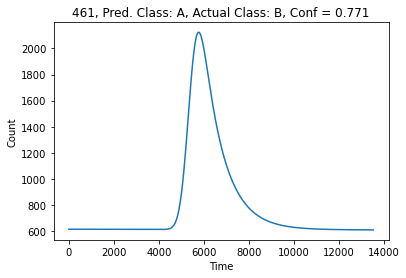

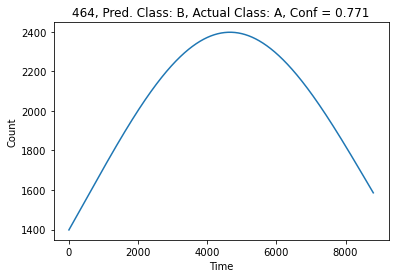

 47%|████▋     | 466/1000 [00:12<00:18, 28.83it/s]

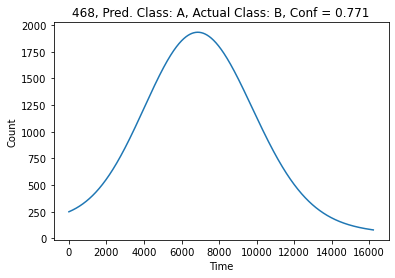

 47%|████▋     | 470/1000 [00:12<00:17, 29.50it/s]

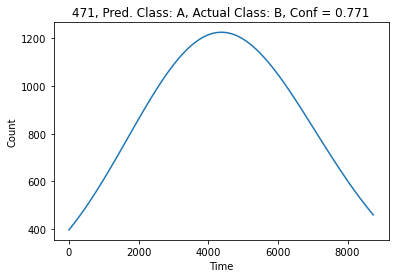

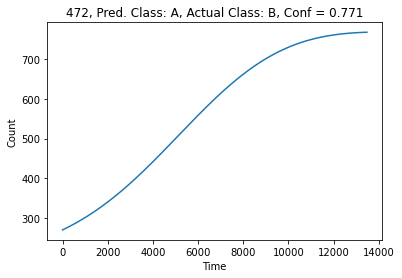

 47%|████▋     | 474/1000 [00:13<00:19, 26.52it/s]

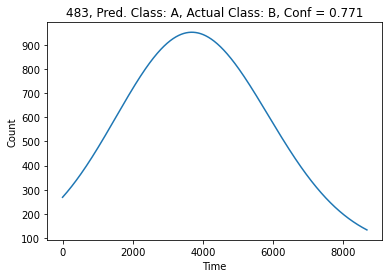

 48%|████▊     | 484/1000 [00:13<00:13, 37.28it/s]

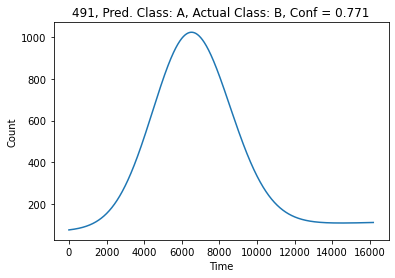

 49%|████▉     | 492/1000 [00:13<00:11, 43.98it/s]

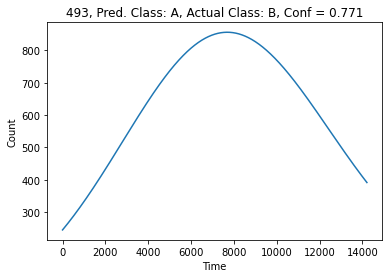

 50%|████▉     | 498/1000 [00:13<00:10, 45.72it/s]

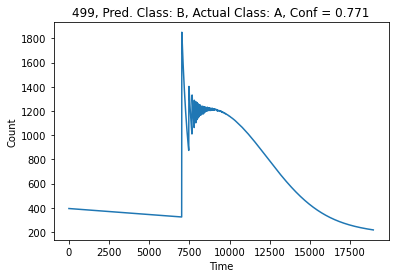

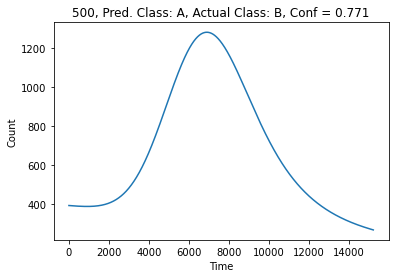

 50%|█████     | 504/1000 [00:13<00:13, 37.13it/s]

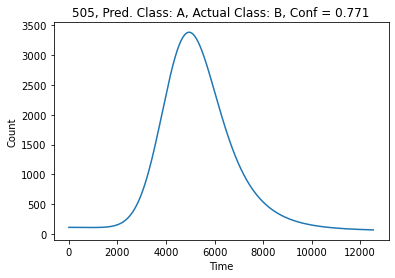

 51%|█████     | 509/1000 [00:13<00:12, 37.93it/s]

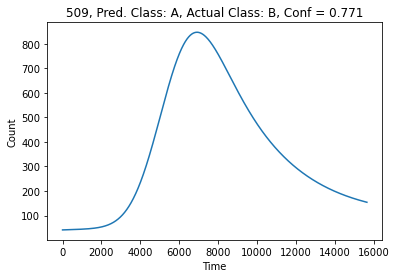

 51%|█████▏    | 514/1000 [00:13<00:12, 38.56it/s]

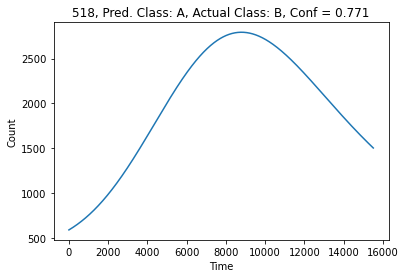

 52%|█████▏    | 519/1000 [00:14<00:12, 39.69it/s]

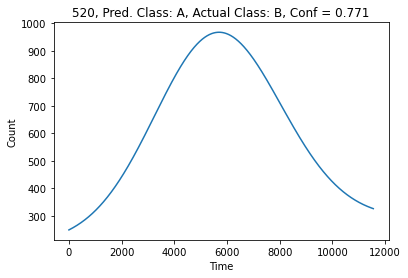

 52%|█████▏    | 524/1000 [00:14<00:11, 40.57it/s]

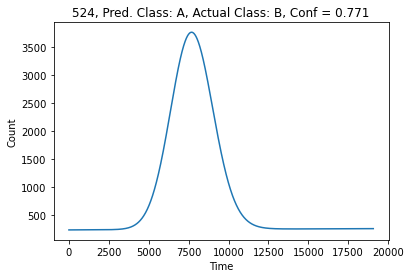

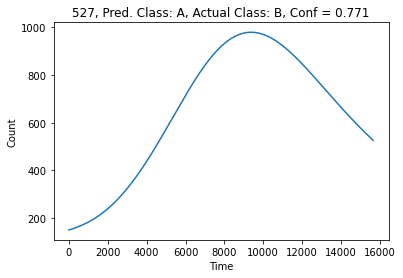

 53%|█████▎    | 529/1000 [00:14<00:15, 31.39it/s]

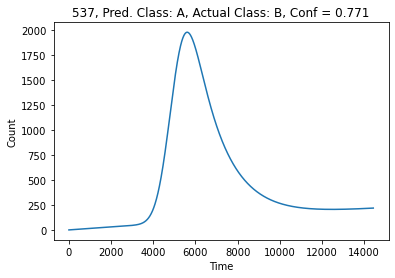

 54%|█████▍    | 538/1000 [00:14<00:11, 40.36it/s]

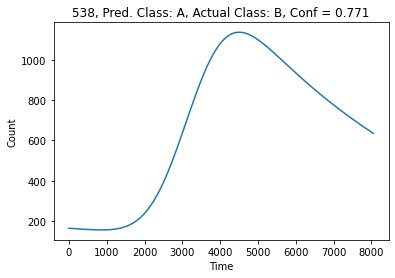

 54%|█████▍    | 543/1000 [00:14<00:12, 35.56it/s]

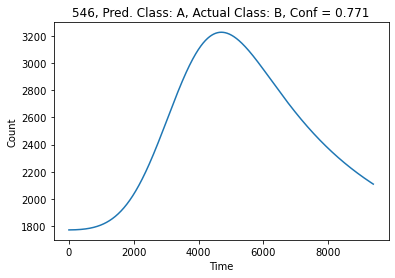

 55%|█████▍    | 547/1000 [00:14<00:12, 35.69it/s]

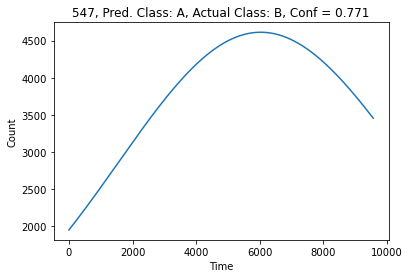

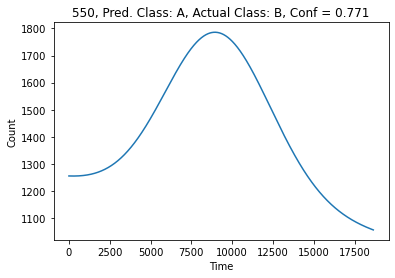

 55%|█████▌    | 551/1000 [00:15<00:15, 28.08it/s]

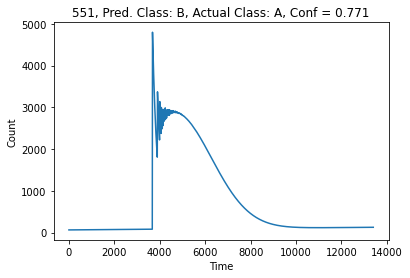

 56%|█████▌    | 555/1000 [00:15<00:15, 29.52it/s]

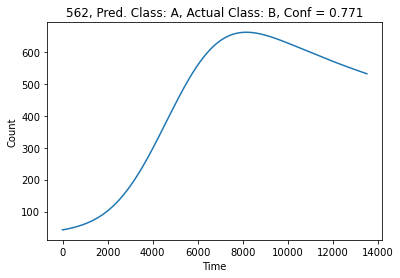

 56%|█████▋    | 563/1000 [00:15<00:11, 37.70it/s]

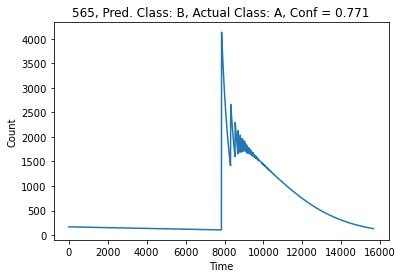

 57%|█████▋    | 568/1000 [00:15<00:11, 38.55it/s]

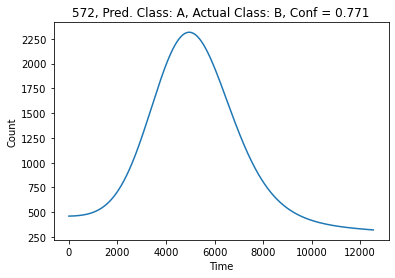

 57%|█████▋    | 573/1000 [00:15<00:10, 39.21it/s]

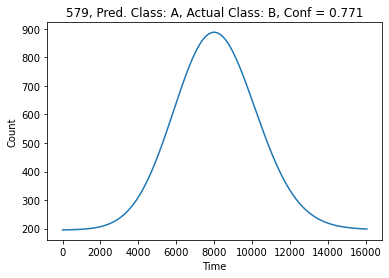

 58%|█████▊    | 580/1000 [00:15<00:09, 44.56it/s]

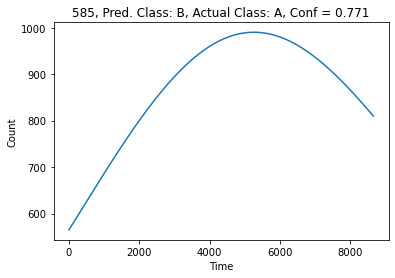

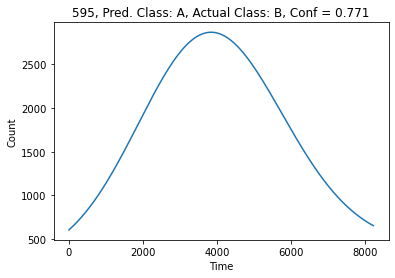

 60%|█████▉    | 596/1000 [00:15<00:06, 59.47it/s]

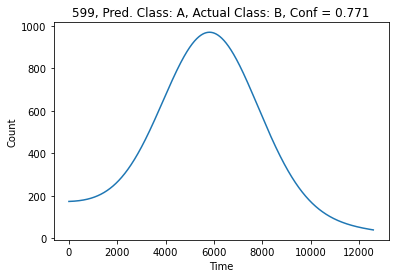

 60%|██████    | 602/1000 [00:16<00:06, 58.48it/s]

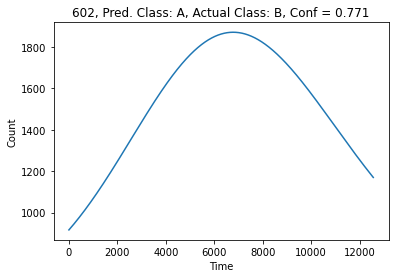

 61%|██████    | 608/1000 [00:16<00:11, 34.32it/s]

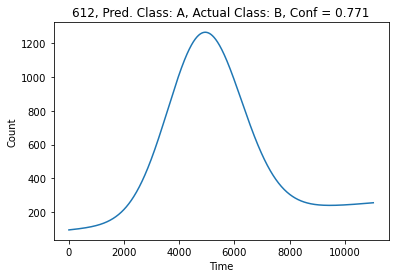

 61%|██████▏   | 613/1000 [00:16<00:10, 36.86it/s]

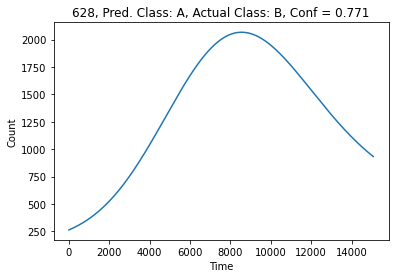

 63%|██████▎   | 629/1000 [00:16<00:06, 58.37it/s]

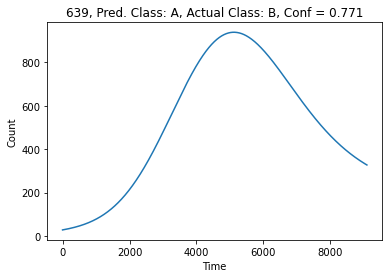

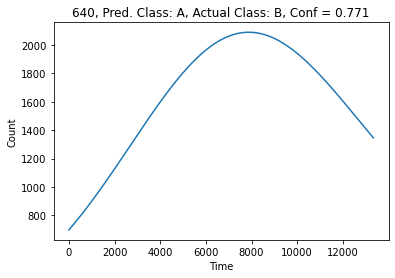

 64%|██████▍   | 641/1000 [00:16<00:06, 57.71it/s]

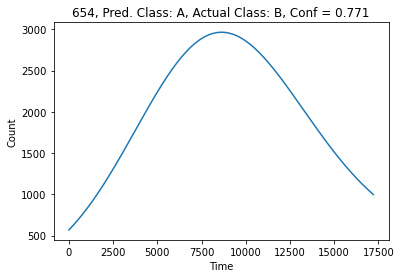

 66%|██████▌   | 655/1000 [00:16<00:04, 71.66it/s]

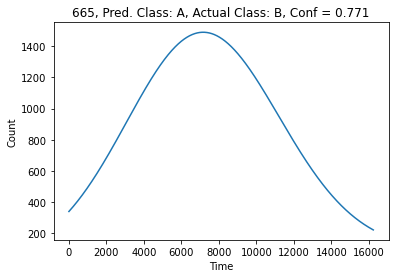

 67%|██████▋   | 666/1000 [00:17<00:04, 74.82it/s]

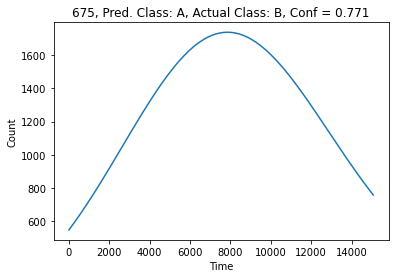

 68%|██████▊   | 676/1000 [00:17<00:04, 78.26it/s]

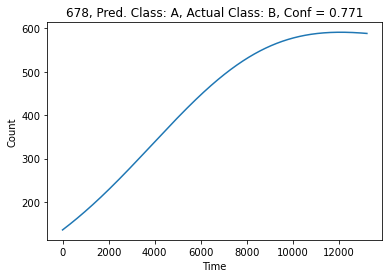

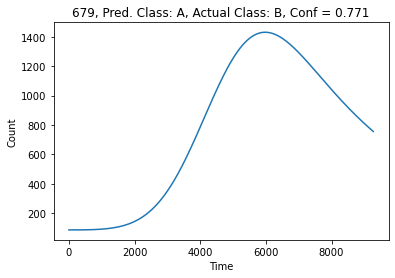

 68%|██████▊   | 685/1000 [00:17<00:05, 62.08it/s]

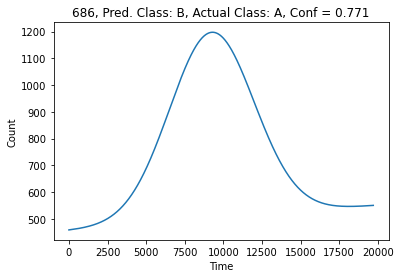

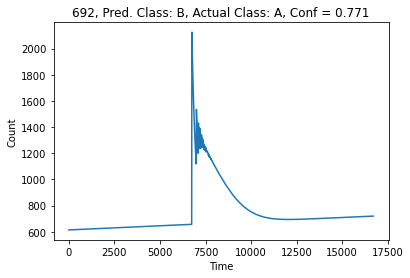

 69%|██████▉   | 693/1000 [00:17<00:06, 48.14it/s]

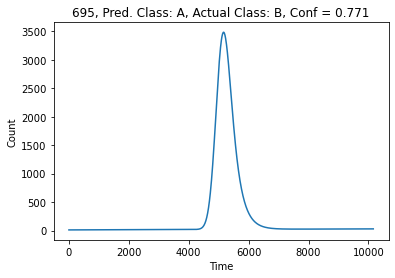

 70%|██████▉   | 699/1000 [00:17<00:06, 45.20it/s]

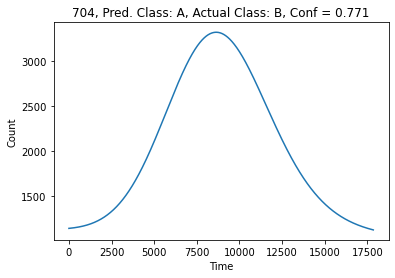

 70%|███████   | 705/1000 [00:18<00:06, 45.48it/s]

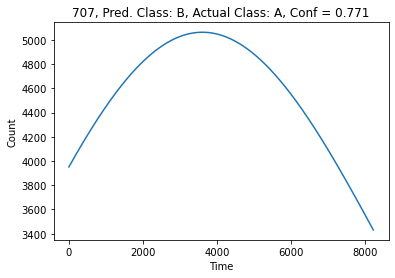

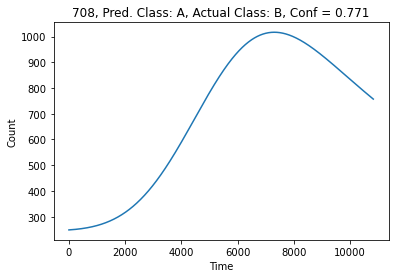

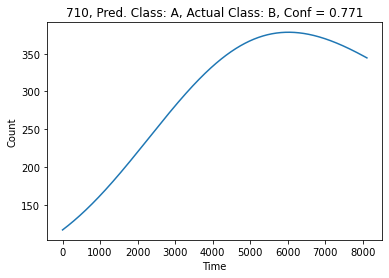

 71%|███████   | 711/1000 [00:18<00:09, 29.54it/s]

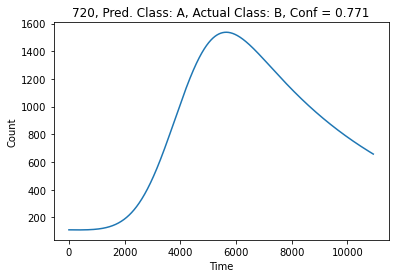

 72%|███████▏  | 721/1000 [00:18<00:07, 38.26it/s]

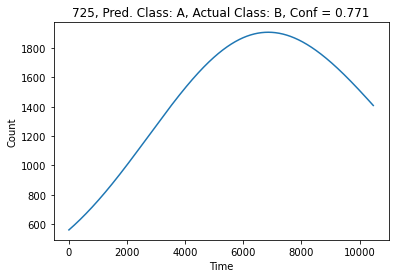

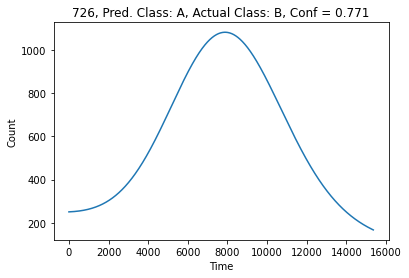

 73%|███████▎  | 727/1000 [00:18<00:08, 32.24it/s]

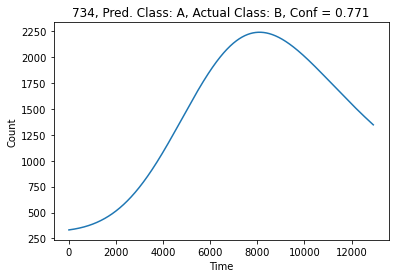

 74%|███████▎  | 735/1000 [00:19<00:07, 35.30it/s]

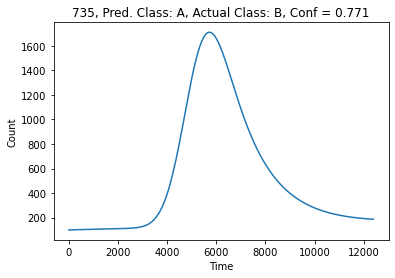

 74%|███████▍  | 740/1000 [00:19<00:07, 33.89it/s]

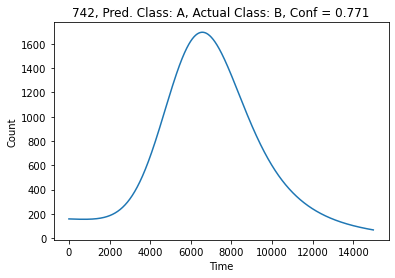

 74%|███████▍  | 744/1000 [00:19<00:07, 33.22it/s]

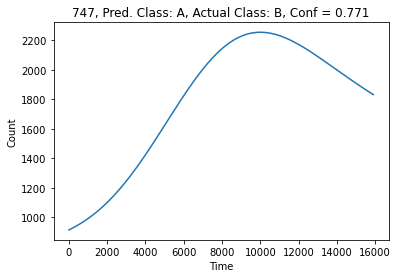

 75%|███████▍  | 748/1000 [00:19<00:07, 33.17it/s]

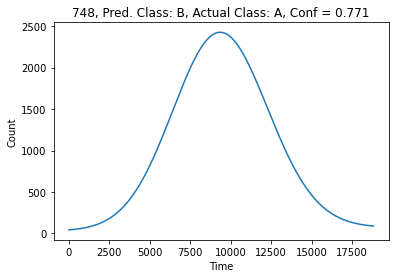

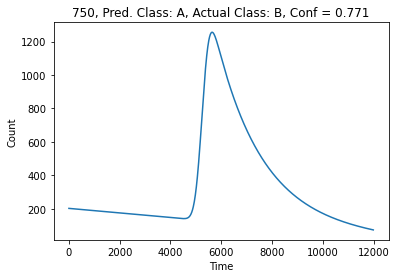

 75%|███████▌  | 752/1000 [00:19<00:09, 26.17it/s]

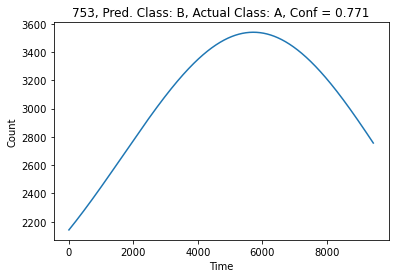

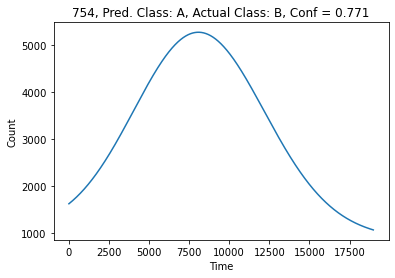

 76%|███████▌  | 755/1000 [00:19<00:11, 21.80it/s]

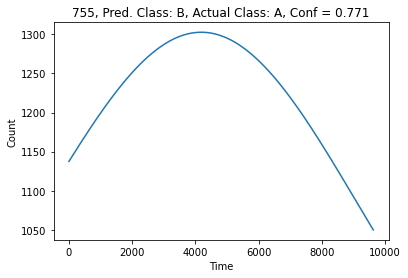

 76%|███████▌  | 758/1000 [00:20<00:10, 22.95it/s]

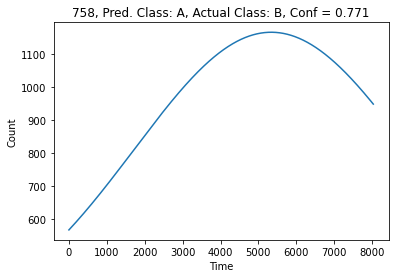

 76%|███████▌  | 761/1000 [00:20<00:10, 23.71it/s]

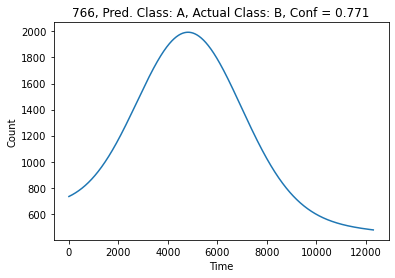

 77%|███████▋  | 767/1000 [00:20<00:07, 30.46it/s]

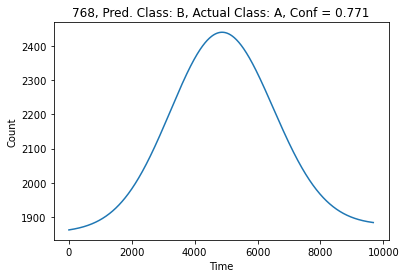

 77%|███████▋  | 771/1000 [00:20<00:11, 20.46it/s]

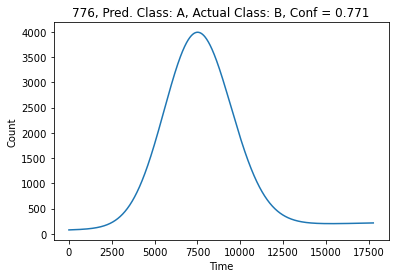

 78%|███████▊  | 777/1000 [00:20<00:08, 25.53it/s]

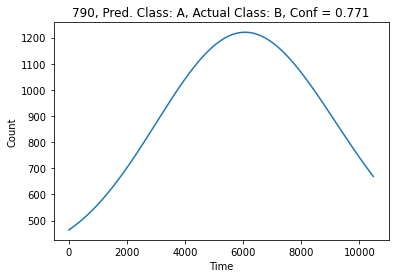

 79%|███████▉  | 791/1000 [00:20<00:04, 44.42it/s]

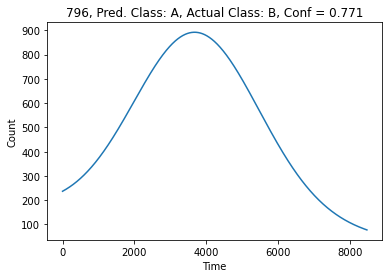

 80%|███████▉  | 797/1000 [00:21<00:04, 43.20it/s]

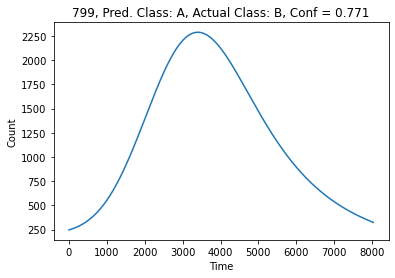

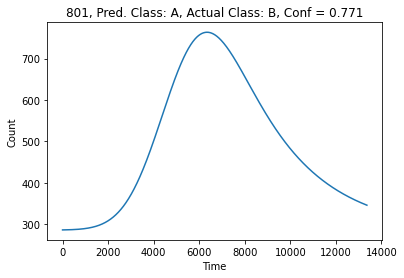

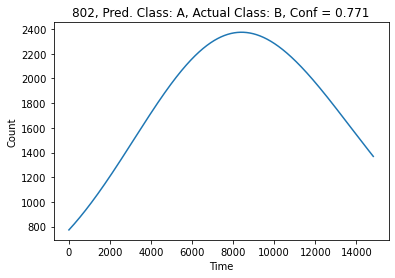

 80%|████████  | 803/1000 [00:21<00:06, 28.20it/s]

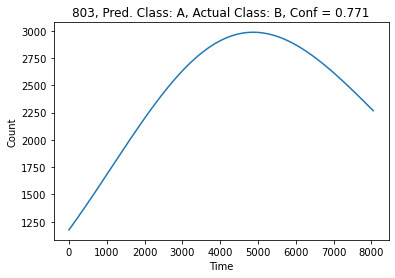

 81%|████████  | 807/1000 [00:21<00:06, 28.80it/s]

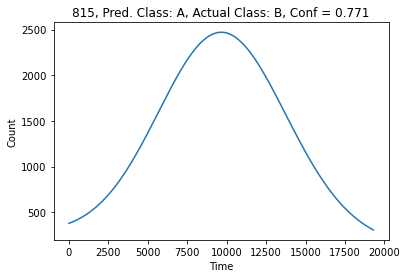

 82%|████████▏ | 816/1000 [00:21<00:04, 38.52it/s]

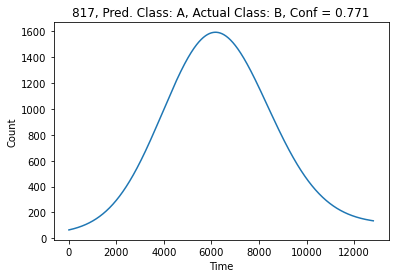

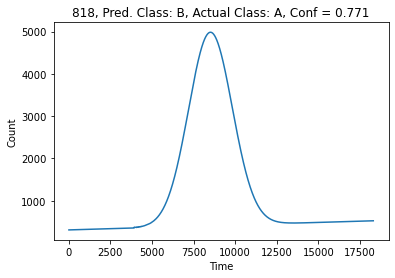

 82%|████████▏ | 821/1000 [00:21<00:05, 32.29it/s]

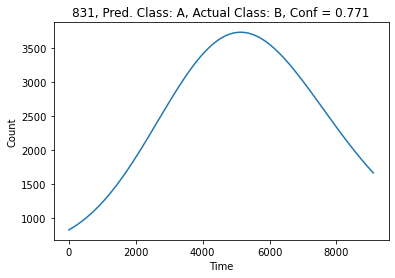

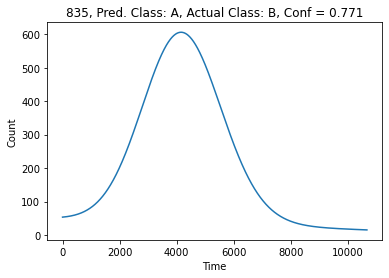

 84%|████████▎ | 836/1000 [00:22<00:03, 45.07it/s]

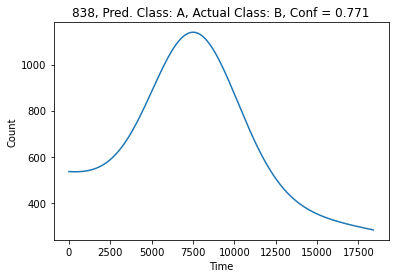

 84%|████████▍ | 842/1000 [00:22<00:03, 47.33it/s]

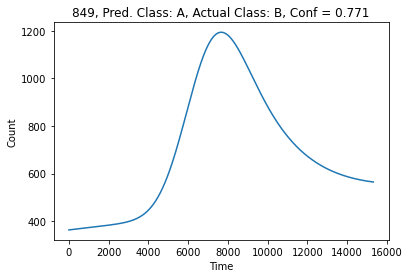

 85%|████████▌ | 850/1000 [00:22<00:02, 52.27it/s]

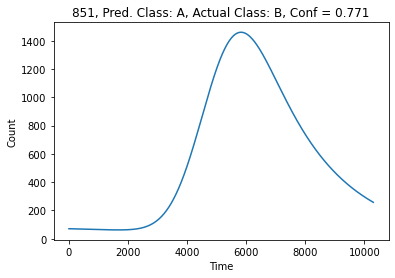

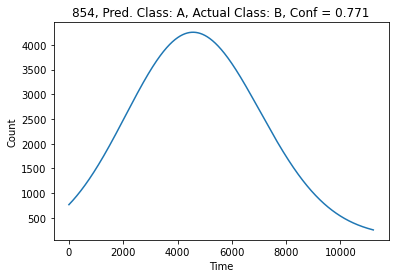

 86%|████████▌ | 856/1000 [00:22<00:03, 42.05it/s]

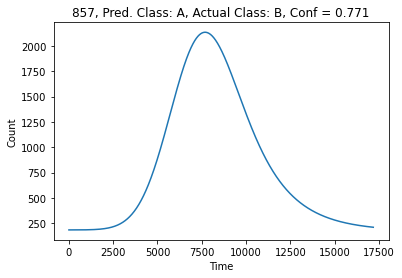

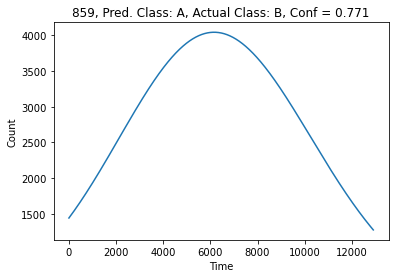

 86%|████████▌ | 861/1000 [00:22<00:04, 34.73it/s]

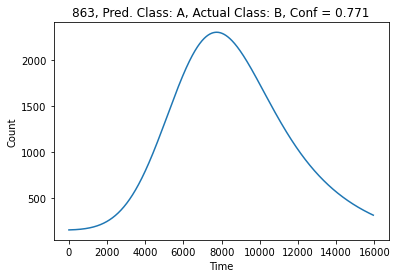

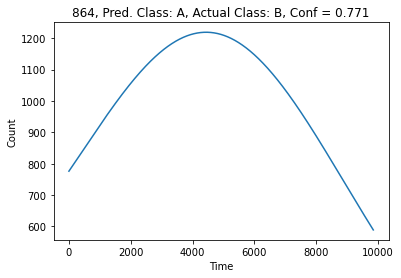

 87%|████████▋ | 866/1000 [00:23<00:04, 30.71it/s]

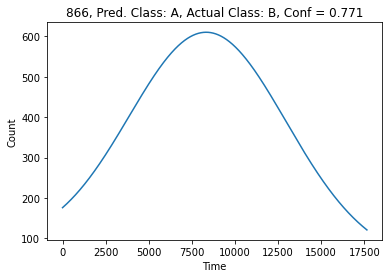

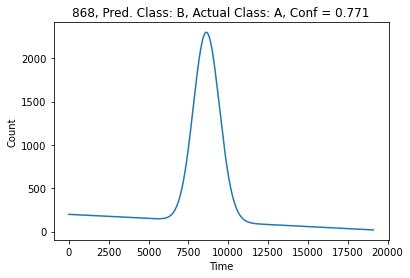

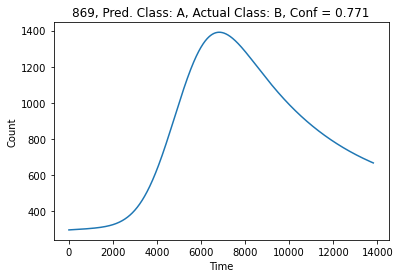

 87%|████████▋ | 870/1000 [00:23<00:05, 22.27it/s]

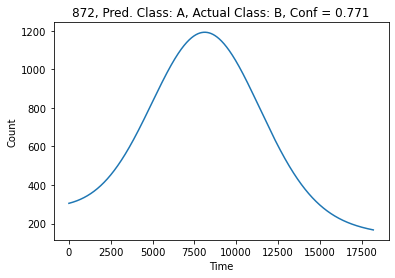

 87%|████████▋ | 873/1000 [00:23<00:05, 23.06it/s]

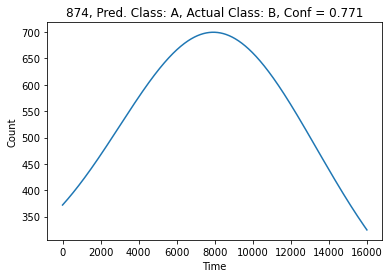

 88%|████████▊ | 876/1000 [00:23<00:05, 23.41it/s]

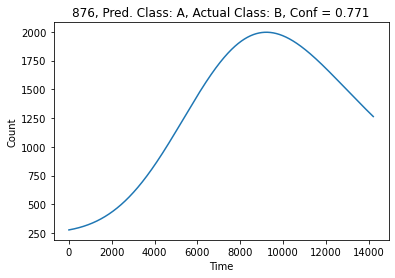

 88%|████████▊ | 879/1000 [00:23<00:05, 23.95it/s]

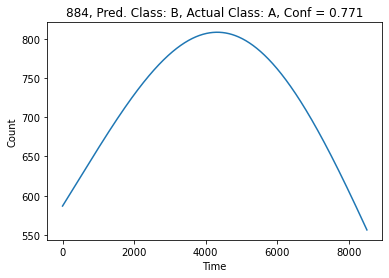

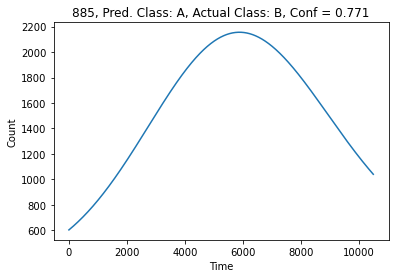

 89%|████████▊ | 886/1000 [00:23<00:04, 27.02it/s]

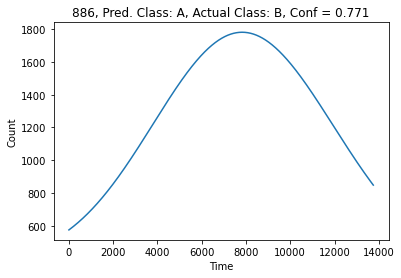

 89%|████████▉ | 889/1000 [00:24<00:04, 26.09it/s]

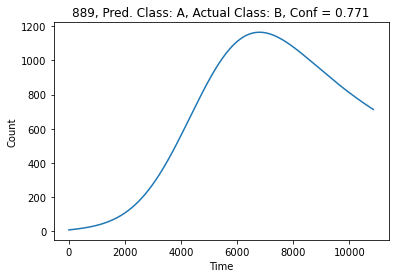

 89%|████████▉ | 892/1000 [00:24<00:06, 17.59it/s]

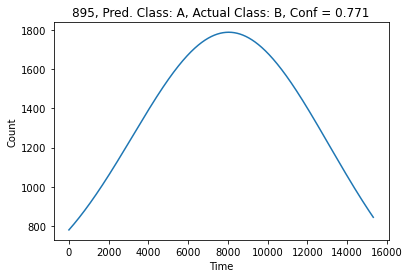

 90%|████████▉ | 896/1000 [00:24<00:05, 18.25it/s]

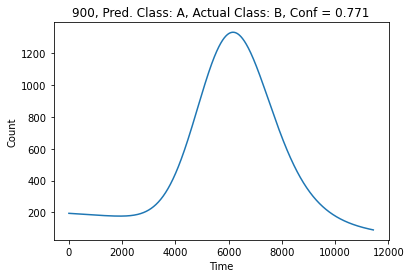

 90%|█████████ | 901/1000 [00:24<00:04, 23.12it/s]

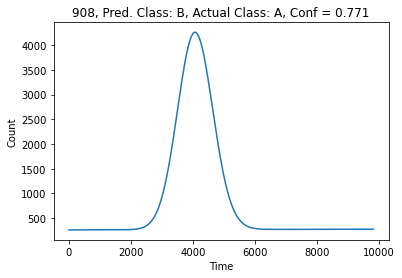

 91%|█████████ | 909/1000 [00:24<00:02, 32.83it/s]

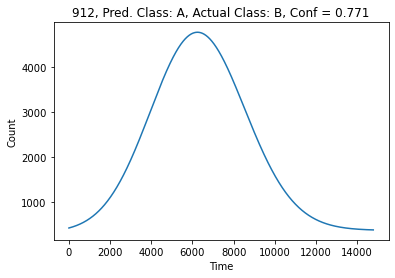

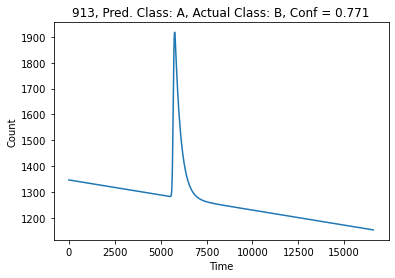

 91%|█████████▏| 914/1000 [00:25<00:03, 26.80it/s]

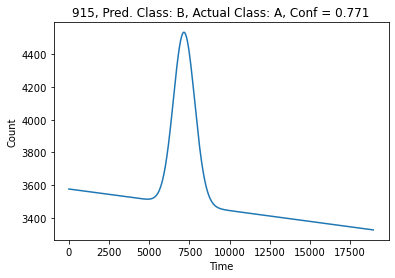

 92%|█████████▏| 918/1000 [00:25<00:02, 27.80it/s]

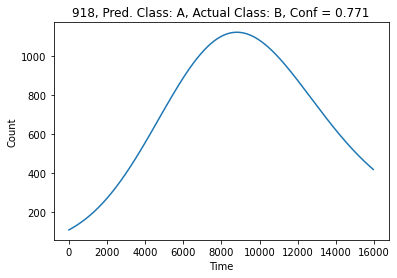

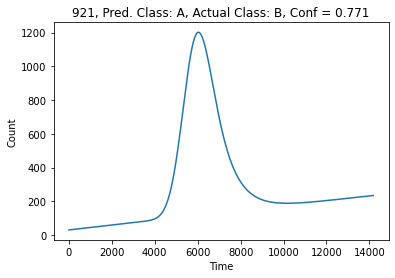

 92%|█████████▏| 922/1000 [00:25<00:03, 22.67it/s]

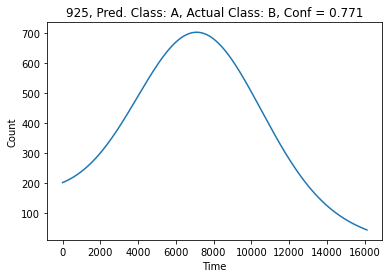

 93%|█████████▎| 926/1000 [00:25<00:03, 24.29it/s]

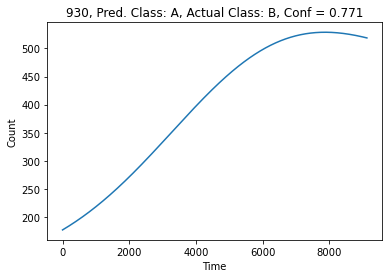

 93%|█████████▎| 931/1000 [00:25<00:02, 27.16it/s]

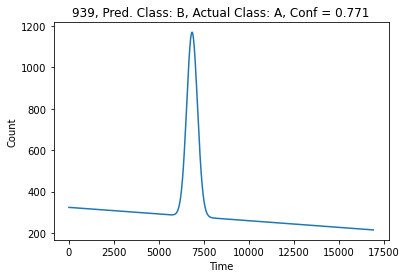

 94%|█████████▍| 940/1000 [00:26<00:01, 35.04it/s]

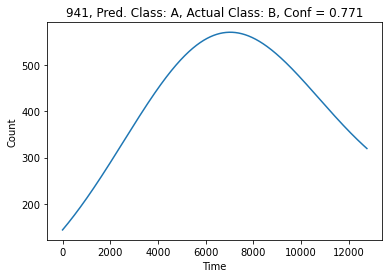

 94%|█████████▍| 944/1000 [00:26<00:01, 35.68it/s]

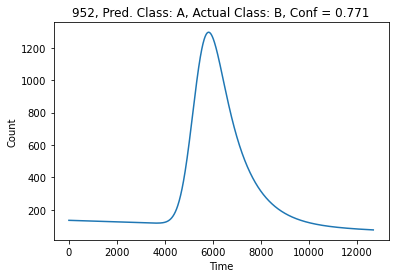

 95%|█████████▌| 953/1000 [00:26<00:01, 46.44it/s]

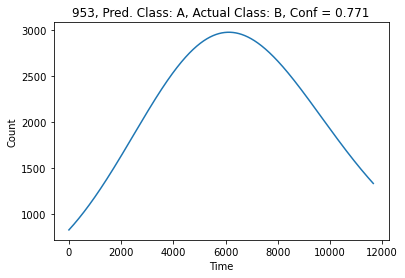

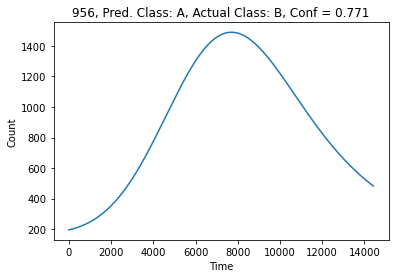

 96%|█████████▌| 959/1000 [00:26<00:01, 36.96it/s]

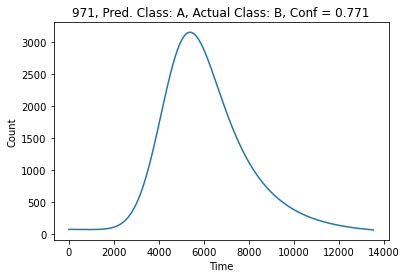

 97%|█████████▋| 972/1000 [00:26<00:00, 49.65it/s]

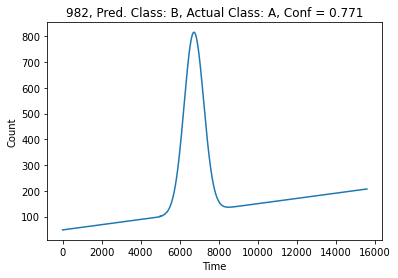

 98%|█████████▊| 983/1000 [00:26<00:00, 59.39it/s]

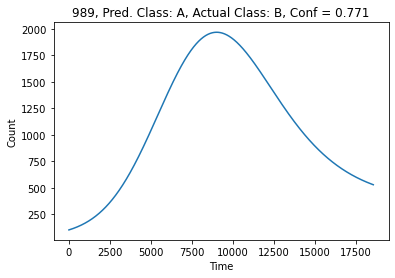

 99%|█████████▉| 990/1000 [00:26<00:00, 59.65it/s]

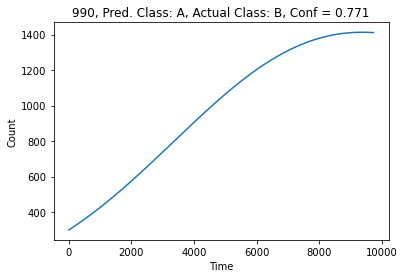

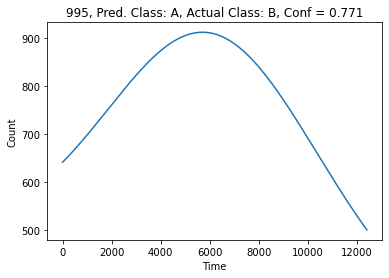

100%|██████████| 1000/1000 [00:27<00:00, 36.95it/s]


In [40]:
for i, pred3 in enumerate(tqdm(preds3)):
    pred3_class = int(np.round(pred3[0]))
    if class_list[str(pred3_class)] != class_list[str(labels[i])]:
        plt.plot(np.arange(0, len(data[i][data[i] != 0]))*10, data[i][data[i] != 0])

        plt.xlabel('Time')
        plt.ylabel('Count')

        plt.title(f"{ids[i]}, Pred. Class: {class_list[str(pred3_class)]}, Actual Class: {class_list[str(labels[i])]}, Conf = {np.round(conf, 3)}")
        plt.show()

# try k-fold validation for the final NN 
help me mein gottens

In [59]:
def get_merged_NN(data_train, data_val, 
                  data_deriv_train, data_deriv_val,
                  labels_train, labels_val):
    
    model1 = Sequential()   
    # First convolutional layer
    model1.add(Conv1D(filters=64, kernel_size=3, activation='relu', input_shape=(len(data[0]), 1)))
    model1.add(MaxPooling1D(pool_size=2))
    # Second convolutional layer
    model1.add(Conv1D(filters=128, kernel_size=3, activation='relu'))
    model1.add(MaxPooling1D(pool_size=2))
    # Third convolutional layer
    model1.add(Conv1D(filters=256, kernel_size=3, activation='relu'))
    model1.add(MaxPooling1D(pool_size=2))
    # Flatten the output
    model1.add(Flatten())
    # Fully connected layer
    model1.add(Dense(128, activation='relu'))
    model1.add(Dropout(0.5))
    # Output layer
    model1.add(Dense(1, activation='sigmoid'))
    # Compile the model
    model1.compile(optimizer=Adam(), loss='binary_crossentropy', metrics=['accuracy'])
    model1.fit(np.array(data_train), np.array(labels_train), epochs=100, batch_size=32, validation_split=0.2, verbose=0)
    
    model2 = Sequential()   
    # First convolutional layer
    model2.add(Conv1D(filters=64, kernel_size=3, activation='relu', input_shape=(len(data[0]), 1)))
    model2.add(MaxPooling1D(pool_size=2))
    # Second convolutional layer
    model2.add(Conv1D(filters=128, kernel_size=3, activation='relu'))
    model2.add(MaxPooling1D(pool_size=2))
    # Third convolutional layer
    model2.add(Conv1D(filters=256, kernel_size=3, activation='relu'))
    model2.add(MaxPooling1D(pool_size=2))
    # Flatten the output
    model2.add(Flatten())
    # Fully connected layer
    model2.add(Dense(128, activation='relu'))
    model2.add(Dropout(0.5))
    # Output layer
    model2.add(Dense(1, activation='sigmoid'))
    # Compile the model
    
    
    # THIS IS WHERE THE PROBLEM LIES 
    model2.compile(optimizer=Adam(), loss='binary_crossentropy', metrics=['accuracy'])
    model2.fit(np.array(data_deriv_train), np.array(labels_train), epochs=100, batch_size=32, validation_split=0.2, verbose=0)
    
    
    
    # final NN 
    merged = Concatenate()([model1.output, model2.output])

    # Add more layers 
    x = Dense(64, activation='relu')(merged)
    final_output = Dense(1, activation='sigmoid')(x)
    
    combined_model = Model(inputs=[model1.input, model2.input], outputs=final_output)
    combined_model.compile(optimizer=Adam(), loss='binary_crossentropy', metrics=['accuracy'])
    combined_model.fit([data_train, data_deriv_train], np.array(labels_train), epochs=100, batch_size=32)
    
    data_val_expanded = np.expand_dims(data_val, axis=-1)
    data_deriv_val_expanded = np.expand_dims(data_deriv_val, axis=-1)
    
    preds = model.predict([data_val_expanded, data_deriv_val_expanded])
    
    return preds


# HELP pls 
when compiling the model, i am encountering some sizing errors for the input shape of model2. I would very greatly appreciate some help with that :'). im not sure why it didnt come up when training individually. 

In [58]:
from sklearn.model_selection import KFold
from keras.layers import LSTM, Dense, Dropout, Bidirectional
import json
import gc

n_trials = 20

check = {}

acc = []
high_conf_acc = []
low_conf_acc = [] 

for n in range(n_trials):
    print(f'ITERATION {n+1}')

    kf = KFold(n_splits=2, shuffle=True)#, random_state=42) # shuffle folds each time
    
    for train_ind, val_ind in kf.split(data):
        data_train, data_val = data[train_ind], data[val_ind]
        data_deriv_train, data_deriv_val = data_deriv[train_ind], data_deriv[val_ind]
        labels_train, labels_val = np.array(labels)[train_ind], np.array(labels)[val_ind]
        ids_train, ids_val = np.array(ids)[train_ind], np.array(ids)[val_ind]
        
        preds = get_merged_NN(data_train, data_val, data_deriv_train, data_deriv_val, labels_train, labels_val)
        
        print(preds)
        
#         class_list = {'0': 'A', '1': 'B'}
        
#         num_high = 0
#         num_mis_high = 0
#         num_mis_low = 0
        
#         tot_exc = 0
        
#         for i, pred in enumerate(tqdm(preds)):
#             conf = np.abs(pred[0]-0.5)/0.5
#             pred_class = int(np.round(pred[0]))

#             tot_exc += 1
            
#             if conf > 0.9: # split by confidence levels, more easily identify initially incorrect classifications
#                 num_high += 1
        
#                 if class_list[str(pred_class)] != class_list[str(labels_val[i])]:
#                     if ids_val[i] not in check.keys():
#                         check[ids_val[i]] = {'high_conf_mis': 0, 'low_conf_mis': 0, 'low_conf_cor': 0}
                    
#                     check[ids_val[i]]['high_conf_mis'] += 1
                    
#                     num_mis_high += 1
    
#             else:
        
#                 if class_list[str(pred_class)] != class_list[str(labels_val[i])]:
#                     if ids_val[i] not in check.keys():
#                         check[ids_val[i]] = {'high_conf_mis': 0, 'low_conf_mis': 0, 'low_conf_cor': 0}
                    
#                     check[ids_val[i]]['low_conf_mis'] += 1
                    
#                     num_mis_low += 1
    

#                 else:
#                     if ids_val[i] not in check.keys():
#                         check[ids_val[i]] = {'high_conf_mis': 0, 'low_conf_mis': 0, 'low_conf_cor': 0}
                    
#                     check[ids_val[i]]['low_conf_cor'] += 1
    /
#         print(f'Number of high confidence classifications = {num_high}')
#         print(f'Number of low confidence classifications = {tot_exc - num_high}')
#         print(f'Percentage of high confidence = {num_high/tot_exc}')
        
#         print(f'Total misclassified = {num_mis_high + num_mis_low}')
#         print(f'Accuracy in total = {1-(num_mis_high + num_mis_low)/tot_exc}')
        
#         print(f'Accuracy of high confidence = {1-num_mis_high/num_high}')
    
#         acc.append(1-(num_mis_high + num_mis_low)/tot_exc)
#         high_conf_acc.append(1-num_mis_high/num_high)

#         try:
#             print(f'Accuracy of low confidence = {1-num_mis_low/(tot_exc - num_high)}')
#             low_conf_acc.append(1-num_mis_low/(tot_exc - num_high))
#         except ZeroDivisionError:
#             low_conf_acc.append(None)

# #with open('problem_ids.json', 'w') as f:
# #    json.dump(check, f)
        

ITERATION 1


ValueError: in user code:

    File "/opt/conda/lib/python3.9/site-packages/keras/src/engine/training.py", line 1338, in train_function  *
        return step_function(self, iterator)
    File "/opt/conda/lib/python3.9/site-packages/keras/src/engine/training.py", line 1322, in step_function  **
        outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "/opt/conda/lib/python3.9/site-packages/keras/src/engine/training.py", line 1303, in run_step  **
        outputs = model.train_step(data)
    File "/opt/conda/lib/python3.9/site-packages/keras/src/engine/training.py", line 1080, in train_step
        y_pred = self(x, training=True)
    File "/opt/conda/lib/python3.9/site-packages/keras/src/utils/traceback_utils.py", line 70, in error_handler
        raise e.with_traceback(filtered_tb) from None
    File "/opt/conda/lib/python3.9/site-packages/keras/src/engine/input_spec.py", line 298, in assert_input_compatibility
        raise ValueError(

    ValueError: Input 0 of layer "sequential_8" is incompatible with the layer: expected shape=(None, 1999, 1), found shape=(None, 1998)
